<a href="https://colab.research.google.com/github/nikhitarao/nikhita_rao_IPBA_projects/blob/IIM_Indore_IPBA-BYOP_Project/IPBA17_GroupA_BYOP_MoviePortfolioAnalysis_FinalCodeSubmission.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# IPBA17-GroupA-BYOP-MoviePortfolioAnalysis-FinalCodeSubmission

**Group Members:**

1. Ashutosh Mohanty
2. Nikhita Rao
3. Praphull Kumar Jain
4. Chandana Jampala
5. Radhika Yadav
6. Poornima Jha
7. Rishindra Sharma
8. Sukesh Bondada


## Importing Libraries

In [ ]:
!pip install ydata_profiling

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 357.9/357.9 kB 7.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 11.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 17.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 293.3/293.3 kB 14.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 16.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.0/13.0 MB 46.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 345.4/345.4 kB 30.3 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27080 sha256=320b07cac9e6178b950d88d403fcf233edd3edc61993e671f9a46a5bfef6b099
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin
  Attempting uninstall: pandas
    Found existing installation: pandas 1.5.3
    Uninstalling 

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import calendar
from datetime import datetime
from IPython.display import display, HTML
import ydata_profiling
import matplotlib.ticker as ticker
import warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', None)

## Reading the Kaggle Dataset into the Kernel

1. URL: https://www.kaggle.com/datasets/ashishkumarjayswal/movies-updated-data
2. Dataset downloaded from Kaggle
3. Created by the original uploader Ashish Kumar Jayaswal by using the IMDB API
4. Download Date: 25th November 2023
5. Dataset for the Period: 1980 to 2020
6. Original Dataset Size: 1.29 MB
7. No of Rows: 7668
8. No of Columns: 23 (inclusive of 8 undefined columns)

In [ ]:
from google.colab import files

uploaded = files.upload()

# Upload movies_small.csv from Drive: https://drive.google.com/drive/folders/1XEyDHOgZQdbPNxKG7IlgArVjgr8cOpEe?usp=drive_link to runtime

Saving movies_small.csv to movies_small.csv


In [ ]:
# Reading the movies_small.csv dataset into the kernel
full_dataset = pd.read_csv("movies_small.csv")
full_dataset = full_dataset.drop(['Unnamed: 15', 'Unnamed: 16', 'Unnamed: 17', 'Unnamed: 18', 'Unnamed: 19', 'Unnamed: 20', 'Unnamed: 21', 'Unnamed: 22'], axis=1)
full_dataset

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000.0,46998772.0,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000.0,58853106.0,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000.0,538375067.0,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000.0,83453539.0,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000.0,39846344.0,Orion Pictures,98.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7663,More to Life,NaN,Drama,2020,"October 23, 2020 (United States)",3.1,18.0,Joseph Ebanks,Joseph Ebanks,Shannon Bond,United States,7000.0,NaN,NaN,90.0
7664,Dream Round,NaN,Comedy,2020,"February 7, 2020 (United States)",4.7,36.0,Dusty Dukatz,Lisa Huston,Michael Saquella,United States,NaN,NaN,Cactus Blue Entertainment,90.0
7665,Saving Mbango,NaN,Drama,2020,"April 27, 2020 (Cameroon)",5.7,29.0,Nkanya Nkwai,Lynno Lovert,Onyama Laura,United States,58750.0,NaN,Embi Productions,NaN
7666,It's Just Us,NaN,Drama,2020,"October 1, 2020 (United States)",NaN,NaN,James Randall,James Randall,Christina Roz,United States,15000.0,NaN,NaN,120.0


## Filtering out data where Country = United States

In [ ]:
# Filter rows where the 'Country' column is equal to 'United States'
us_movies_dataset = full_dataset[full_dataset['country'] == 'United States']
dataset= us_movies_dataset

#Dropping column country as it's no longer needed
dataset=dataset.drop(['country'], axis=1)
dataset

,name,rating,genre,year,released,score,votes,director,writer,star,budget,gross,company,runtime
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,4500000.0,58853106.0,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,18000000.0,538375067.0,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,3500000.0,83453539.0,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,6000000.0,39846344.0,Orion Pictures,98.0
5,Friday the 13th,R,Horror,1980,"May 9, 1980 (United States)",6.4,123000.0,Sean S. Cunningham,Victor Miller,Betsy Palmer,550000.0,39754601.0,Paramount Pictures,95.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7662,The Robinsons,NaN,Action,2020,"November 10, 2020 (United States)",NaN,NaN,Directors,Aleks Alifirenko Jr.,Billy Hartmann,10000.0,NaN,NaN,90.0
7663,More to Life,NaN,Drama,2020,"October 23, 2020 (United States)",3.1,18.0,Joseph Ebanks,Joseph Ebanks,Shannon Bond,7000.0,NaN,NaN,90.0
7664,Dream Round,NaN,Comedy,2020,"February 7, 2020 (United States)",4.7,36.0,Dusty Dukatz,Lisa Huston,Michael Saquella,NaN,NaN,Cactus Blue Entertainment,90.0
7665,Saving Mbango,NaN,Drama,2020,"April 27, 2020 (Cameroon)",5.7,29.0,Nkanya Nkwai,Lynno Lovert,Onyama Laura,58750.0,NaN,Embi Productions,NaN


## Handling Released column and extracting the data

In [ ]:
# Handling the 'released' column

from datetime import datetime

# Extract country and date into separate columns
dataset['released_country'] = dataset['released'].str.extract(r'\(([^)]+)\)')
dataset['released_date'] = dataset['released'].str.extract(r'([^()]+)')

# Convert the 'date' column to datetime format
dataset['released_date'] = pd.to_datetime(dataset['released_date'], errors='coerce')

# Extract day of the week, week number, month, and year into separate columns
dataset['released_day_of_week'] = dataset['released_date'].dt.strftime('%A')
dataset['released_week_number'] = dataset['released_date'].dt.isocalendar().week
dataset['released_month'] = dataset['released_date'].dt.strftime('%B')
dataset['released_year'] = dataset['released_date'].dt.year

dataset

,name,rating,genre,year,released,score,votes,director,writer,star,budget,gross,company,runtime,released_country,released_date,released_day_of_week,released_week_number,released_month,released_year
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,4500000.0,58853106.0,Columbia Pictures,104.0,United States,1980-07-02,Wednesday,27,July,1980.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,18000000.0,538375067.0,Lucasfilm,124.0,United States,1980-06-20,Friday,25,June,1980.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,3500000.0,83453539.0,Paramount Pictures,88.0,United States,1980-07-02,Wednesday,27,July,1980.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,6000000.0,39846344.0,Orion Pictures,98.0,United States,1980-07-25,Friday,30,July,1980.0
5,Friday the 13th,R,Horror,1980,"May 9, 1980 (United States)",6.4,123000.0,Sean S. Cunningham,Victor Miller,Betsy Palmer,550000.0,39754601.0,Paramount Pictures,95.0,United States,1980-05-09,Friday,19,May,1980.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7662,The Robinsons,NaN,Action,2020,"November 10, 2020 (United States)",NaN,NaN,Directors,Aleks Alifirenko Jr.,Billy Hartmann,10000.0,NaN,NaN,90.0,United States,2020-11-10,Tuesday,46,November,2020.0
7663,More to Life,NaN,Drama,2020,"October 23, 2020 (United States)",3.1,18.0,Joseph Ebanks,Joseph Ebanks,Shannon Bond,7000.0,NaN,NaN,90.0,United States,2020-10-23,Friday,43,October,2020.0
7664,Dream Round,NaN,Comedy,2020,"February 7, 2020 (United States)",4.7,36.0,Dusty Dukatz,Lisa Huston,Michael Saquella,NaN,NaN,Cactus Blue Entertainment,90.0,United States,2020-02-07,Friday,6,February,2020.0
7665,Saving Mbango,NaN,Drama,2020,"April 27, 2020 (Cameroon)",5.7,29.0,Nkanya Nkwai,Lynno Lovert,Onyama Laura,58750.0,NaN,Embi Productions,NaN,Cameroon,2020-04-27,Monday,18,April,2020.0


In [ ]:
# Filter rows where the 'released_country' column is equal to 'United States'
us_movies_dataset = dataset[dataset['released_country'] == 'United States']
dataset= us_movies_dataset

#Dropping column country as it's no longer needed
dataset=dataset.drop(['released_country'], axis=1)
dataset

,name,rating,genre,year,released,score,votes,director,writer,star,budget,gross,company,runtime,released_date,released_day_of_week,released_week_number,released_month,released_year
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,4500000.0,58853106.0,Columbia Pictures,104.0,1980-07-02,Wednesday,27,July,1980.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,18000000.0,538375067.0,Lucasfilm,124.0,1980-06-20,Friday,25,June,1980.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,3500000.0,83453539.0,Paramount Pictures,88.0,1980-07-02,Wednesday,27,July,1980.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,6000000.0,39846344.0,Orion Pictures,98.0,1980-07-25,Friday,30,July,1980.0
5,Friday the 13th,R,Horror,1980,"May 9, 1980 (United States)",6.4,123000.0,Sean S. Cunningham,Victor Miller,Betsy Palmer,550000.0,39754601.0,Paramount Pictures,95.0,1980-05-09,Friday,19,May,1980.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7661,Love by Drowning,R,Drama,2020,"November 6, 2020 (United States)",NaN,NaN,Justin Kreinbrink,C.E. Poverman,Nicky Whelan,1000000.0,NaN,Dow Jazz Films,121.0,2020-11-06,Friday,45,November,2020.0
7662,The Robinsons,NaN,Action,2020,"November 10, 2020 (United States)",NaN,NaN,Directors,Aleks Alifirenko Jr.,Billy Hartmann,10000.0,NaN,NaN,90.0,2020-11-10,Tuesday,46,November,2020.0
7663,More to Life,NaN,Drama,2020,"October 23, 2020 (United States)",3.1,18.0,Joseph Ebanks,Joseph Ebanks,Shannon Bond,7000.0,NaN,NaN,90.0,2020-10-23,Friday,43,October,2020.0
7664,Dream Round,NaN,Comedy,2020,"February 7, 2020 (United States)",4.7,36.0,Dusty Dukatz,Lisa Huston,Michael Saquella,NaN,NaN,Cactus Blue Entertainment,90.0,2020-02-07,Friday,6,February,2020.0


In [ ]:
dataset['released_year'].isna().sum()

20

In [ ]:
#Dropping column released as it's no longer needed
dataset=dataset.drop(['released'], axis=1)

In [ ]:
dataset.columns

Index(['name', 'rating', 'genre', 'year', 'score', 'votes', 'director',
       'writer', 'star', 'budget', 'gross', 'company', 'runtime',
       'released_date', 'released_day_of_week', 'released_week_number',
       'released_month', 'released_year'],
      dtype='object')

## Season Tagging

In [ ]:
# Idenftiying which season movie was released
#Spring= March, April, May
#Summer= June, July , August
#Fall= September, October ,November
#Winter= December, January, February

# Define a function to map months to seasons
def get_season(month):
    if month in ['March', 'April', 'May']:
        return 'Spring'
    elif month in ['June', 'July', 'August']:
        return 'Summer'
    elif month in ['September', 'October', 'November']:
        return 'Fall'
    else:
        return 'Winter'  # December, January, February

# Apply the function to create a new column for seasons
dataset['season'] = dataset['released_month'].apply(get_season)

dataset.head()

,name,rating,genre,year,score,votes,director,writer,star,budget,gross,company,runtime,released_date,released_day_of_week,released_week_number,released_month,released_year,season
1,The Blue Lagoon,R,Adventure,1980,5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,4500000.0,58853106.0,Columbia Pictures,104.0,1980-07-02,Wednesday,27,July,1980.0,Summer
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,18000000.0,538375067.0,Lucasfilm,124.0,1980-06-20,Friday,25,June,1980.0,Summer
3,Airplane!,PG,Comedy,1980,7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,3500000.0,83453539.0,Paramount Pictures,88.0,1980-07-02,Wednesday,27,July,1980.0,Summer
4,Caddyshack,R,Comedy,1980,7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,6000000.0,39846344.0,Orion Pictures,98.0,1980-07-25,Friday,30,July,1980.0,Summer
5,Friday the 13th,R,Horror,1980,6.4,123000.0,Sean S. Cunningham,Victor Miller,Betsy Palmer,550000.0,39754601.0,Paramount Pictures,95.0,1980-05-09,Friday,19,May,1980.0,Spring


## Data Pre-processing Steps

In [ ]:
# Create a function to calculate the number of unique values in each column
def unique_values(dataset):
    unique_data = []
    columns_to_check = ['name', 'rating', 'genre', 'year', 'score', 'votes', 'director',
       'writer', 'star', 'budget', 'gross', 'company', 'runtime', 'released_date', 'released_day_of_week',
       'released_week_number', 'released_month', 'released_year', 'season']

    for column in columns_to_check:
        data_unique = dataset[column].nunique()
        unique_data.append(data_unique)

    return unique_data

In [ ]:
# Create a function to calculate the percentage of missing values in each column
def calculate_missing_percentage(dataset):
    data_na_perc = dataset.isna().sum()/dataset.shape[0]
    return data_na_perc

In [ ]:
# Creating a function to display the No of Missing Values, %ge of Misisng Values, Data Types, No of Unique Values and %ge of Unique Values per column
def dataset_details(dataset):
    # Calculate missing values percentage
    data_na_perc = calculate_missing_percentage(dataset)

    # Create a dictionary for data description
    data_description = {
                        'Missing Values': dataset.isna().sum(),
                        '%ge of Missing Values': data_na_perc,
                        'Data Types': dataset.dtypes,
                        'Unique Values': unique_values(dataset),
                        '%ge of Unique Values': [count / len(dataset) * 100 for count in unique_values(dataset)]
                        }

    # Create a DataFrame
    df = pd.DataFrame(data_description)
    print(df)

In [ ]:
# Identify and display duplicate entries

duplicate_entries = dataset[dataset.duplicated(keep=False)]

# Display the duplicate entries
print(duplicate_entries.head())

Empty DataFrame
Columns: [name, rating, genre, year, score, votes, director, writer, star, budget, gross, company, runtime, released_date, released_day_of_week, released_week_number, released_month, released_year, season]
Index: []


In [ ]:
dataset_details(dataset)

                      Missing Values  %ge of Missing Values      Data Types  \
name                               0               0.000000          object   
rating                            15               0.002929          object   
genre                              0               0.000000          object   
year                               0               0.000000           int64   
score                              3               0.000586         float64   
votes                              3               0.000586         float64   
director                           0               0.000000          object   
writer                             0               0.000000          object   
star                               0               0.000000          object   
budget                           952               0.185865         float64   
gross                             80               0.015619         float64   
company                           12               0

## Homogenizing the rating column categories

In [ ]:
dataset['rating'].unique()

array(['R', 'PG', 'G', 'NC-17', 'Approved', 'TV-PG', 'Not Rated', 'PG-13',
       'Unrated', nan, 'TV-MA'], dtype=object)

In [ ]:
# Assigning 'TV-PG' to 'PG' rating, and 'TV-MA' to 'NC-17' rating, and 'Not Rated' to 'Unrated' within the column rating

# Define a mapping dictionary for the replacements
rating_mapping = {
    'TV-PG': 'PG',
    'TV-MA': 'NC-17',
    'Not Rated': 'Unrated'
}

# Use the replace method to replace values in the 'rating' column
dataset['rating'] = dataset['rating'].replace(rating_mapping)

# Display the updated DataFrame
dataset['rating'].unique()

array(['R', 'PG', 'G', 'NC-17', 'Approved', 'Unrated', 'PG-13', nan],
      dtype=object)

Analyzing 'Approved' rating which was given during the Hays Code era in Hollywood.
The term "Approved" was historically used in the context of the movie rating system in the United States.
Before the current rating system was established, the Motion Picture Production Code, also known as the Hays Code, governed the content of Hollywood films from the 1930s to the 1960s.
Under the Hays Code, films were often labeled as "Approved" to indicate that they adhered to the guidelines set forth by the Production Code Administration (PCA).
This designation meant that the film was deemed acceptable for public viewing, having passed the censorship standards of the time.
The Hays Code was eventually replaced by the modern movie rating system in 1968, which includes categories such as G, PG, PG-13, R, and NC-17, among others.
The "Approved" label is no longer used in the current rating system.
Instead, films are assigned specific ratings based on their content, allowing viewers to make informed choices about what is suitable for different age groups.
In summary, "Approved" was a designation under the old Hays Code system, but it is not part of the current movie rating system in the United States.

In [ ]:
# Use the min() function to find the minimum year
dataset['year'].min()

1980

In [ ]:
# Use boolean indexing to filter rows where 'rating' is 'Approved'
approved_rows = dataset[dataset['rating'] == 'Approved']
print(approved_rows)

                   name    rating      genre  year  score   votes    director  \
120  Tarzan the Ape Man  Approved  Adventure  1981    3.4  5300.0  John Derek   

       writer      star     budget       gross                    company  \
120  Tom Rowe  Bo Derek  6500000.0  36565280.0  Metro-Goldwyn-Mayer (MGM)   

     runtime released_date released_day_of_week  released_week_number  \
120    115.0    1981-07-24               Friday                    30   

    released_month  released_year  season  
120           July         1981.0  Summer  


In [ ]:
#Since this is only 1 entry we can drop the row, and proceed further
# Drop the row where 'rating' is 'Approved'
dataset = dataset[dataset['rating'] != 'Approved']
dataset

,name,rating,genre,year,score,votes,director,writer,star,budget,gross,company,runtime,released_date,released_day_of_week,released_week_number,released_month,released_year,season
1,The Blue Lagoon,R,Adventure,1980,5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,4500000.0,58853106.0,Columbia Pictures,104.0,1980-07-02,Wednesday,27,July,1980.0,Summer
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,18000000.0,538375067.0,Lucasfilm,124.0,1980-06-20,Friday,25,June,1980.0,Summer
3,Airplane!,PG,Comedy,1980,7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,3500000.0,83453539.0,Paramount Pictures,88.0,1980-07-02,Wednesday,27,July,1980.0,Summer
4,Caddyshack,R,Comedy,1980,7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,6000000.0,39846344.0,Orion Pictures,98.0,1980-07-25,Friday,30,July,1980.0,Summer
5,Friday the 13th,R,Horror,1980,6.4,123000.0,Sean S. Cunningham,Victor Miller,Betsy Palmer,550000.0,39754601.0,Paramount Pictures,95.0,1980-05-09,Friday,19,May,1980.0,Spring
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7661,Love by Drowning,R,Drama,2020,NaN,NaN,Justin Kreinbrink,C.E. Poverman,Nicky Whelan,1000000.0,NaN,Dow Jazz Films,121.0,2020-11-06,Friday,45,November,2020.0,Fall
7662,The Robinsons,NaN,Action,2020,NaN,NaN,Directors,Aleks Alifirenko Jr.,Billy Hartmann,10000.0,NaN,NaN,90.0,2020-11-10,Tuesday,46,November,2020.0,Fall
7663,More to Life,NaN,Drama,2020,3.1,18.0,Joseph Ebanks,Joseph Ebanks,Shannon Bond,7000.0,NaN,NaN,90.0,2020-10-23,Friday,43,October,2020.0,Fall
7664,Dream Round,NaN,Comedy,2020,4.7,36.0,Dusty Dukatz,Lisa Huston,Michael Saquella,NaN,NaN,Cactus Blue Entertainment,90.0,2020-02-07,Friday,6,February,2020.0,Winter


In [ ]:
dataset['rating'].unique()

array(['R', 'PG', 'G', 'NC-17', 'Unrated', 'PG-13', nan], dtype=object)

## Missing Value Treatment

In [ ]:
dataset_details(dataset)

                      Missing Values  %ge of Missing Values      Data Types  \
name                               0               0.000000          object   
rating                            15               0.002929          object   
genre                              0               0.000000          object   
year                               0               0.000000           int64   
score                              3               0.000586         float64   
votes                              3               0.000586         float64   
director                           0               0.000000          object   
writer                             0               0.000000          object   
star                               0               0.000000          object   
budget                           952               0.185901         float64   
gross                             80               0.015622         float64   
company                           12               0

In [ ]:
# Drop the rows where 'rating' is NaN
dataset = dataset[dataset['rating'].notna()]
print(dataset)

                                                name   rating      genre  \
1                                    The Blue Lagoon        R  Adventure   
2     Star Wars: Episode V - The Empire Strikes Back       PG     Action   
3                                          Airplane!       PG     Comedy   
4                                         Caddyshack        R     Comedy   
5                                    Friday the 13th        R     Horror   
...                                              ...      ...        ...   
7650                                        Dolittle       PG  Adventure   
7656                                           Tulsa    PG-13     Comedy   
7658                       Black Wall Street Burning        R      Drama   
7659                                       I Am Fear  Unrated     Horror   
7661                                Love by Drowning        R      Drama   

      year  score      votes            director                   writer  \
1     1980

In [ ]:
dataset_details(dataset)

                      Missing Values  %ge of Missing Values      Data Types  \
name                               0               0.000000          object   
rating                             0               0.000000          object   
genre                              0               0.000000          object   
year                               0               0.000000           int64   
score                              1               0.000196         float64   
votes                              1               0.000196         float64   
director                           0               0.000000          object   
writer                             0               0.000000          object   
star                               0               0.000000          object   
budget                           943               0.184685         float64   
gross                             73               0.014297         float64   
company                            9               0

In [ ]:
# Drop the rows where 'score', 'votes', 'company' and 'runtime' is NaN
dataset = dataset[dataset['score'].notna()]
dataset = dataset[dataset['votes'].notna()]
dataset = dataset[dataset['runtime'].notna()]
dataset = dataset[dataset['company'].notna()]
dataset = dataset[dataset['released_year'].notna()]
print(dataset)

                                                name   rating      genre  \
1                                    The Blue Lagoon        R  Adventure   
2     Star Wars: Episode V - The Empire Strikes Back       PG     Action   
3                                          Airplane!       PG     Comedy   
4                                         Caddyshack        R     Comedy   
5                                    Friday the 13th        R     Horror   
...                                              ...      ...        ...   
7649                              Sonic the Hedgehog       PG     Action   
7650                                        Dolittle       PG  Adventure   
7656                                           Tulsa    PG-13     Comedy   
7658                       Black Wall Street Burning        R      Drama   
7659                                       I Am Fear  Unrated     Horror   

      year  score      votes            director                   writer  \
1     1980

In [ ]:
dataset_details(dataset)

                      Missing Values  %ge of Missing Values      Data Types  \
name                               0               0.000000          object   
rating                             0               0.000000          object   
genre                              0               0.000000          object   
year                               0               0.000000           int64   
score                              0               0.000000         float64   
votes                              0               0.000000         float64   
director                           0               0.000000          object   
writer                             0               0.000000          object   
star                               0               0.000000          object   
budget                           925               0.182266         float64   
gross                             66               0.013005         float64   
company                            0               0

## Imputing the Median by year for a genre for Budget and Gross column missing values

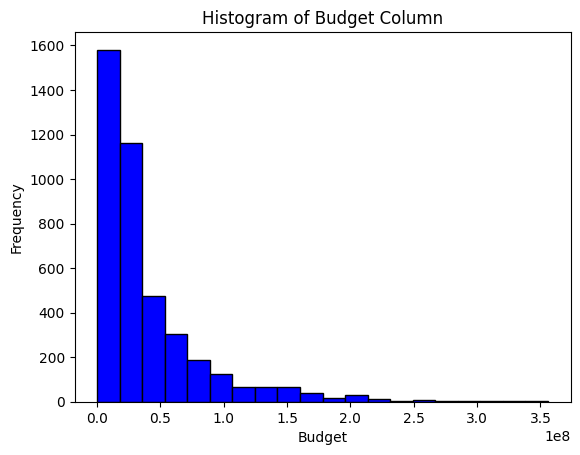

In [ ]:
# Display the budget column as a histogram
budget_data = dataset['budget']

# Plotting the histogram
plt.hist(budget_data, bins=20, color='blue', edgecolor='black')

# Adding labels and title
plt.xlabel('Budget')
plt.ylabel('Frequency')
plt.title('Histogram of Budget Column')

# Display the plot
plt.show()

In [ ]:
def impute_budget_for_genre_and_year(dataset):
    # Calculate median budget for each genre and year
    genre_year_median_budget = dataset.groupby(['genre', 'year'])['budget'].median()

    # Define a function to impute missing budget values
    def impute_budget(row):
        if pd.isna(row['budget']):
            if (row['genre'], row['year']) in genre_year_median_budget:
                return genre_year_median_budget[(row['genre'], row['year'])]
            else:
                # If no median value is found for the specific genre and year, return NaN
                return float('NaN')
        else:
            return row['budget']

    # Apply the imputation function to fill in missing 'budget' values
    dataset['budget'] = dataset.apply(impute_budget, axis=1)

    return dataset


dataset = impute_budget_for_genre_and_year(dataset)
print(dataset)

                                                name   rating      genre  \
1                                    The Blue Lagoon        R  Adventure   
2     Star Wars: Episode V - The Empire Strikes Back       PG     Action   
3                                          Airplane!       PG     Comedy   
4                                         Caddyshack        R     Comedy   
5                                    Friday the 13th        R     Horror   
...                                              ...      ...        ...   
7649                              Sonic the Hedgehog       PG     Action   
7650                                        Dolittle       PG  Adventure   
7656                                           Tulsa    PG-13     Comedy   
7658                       Black Wall Street Burning        R      Drama   
7659                                       I Am Fear  Unrated     Horror   

      year  score      votes            director                   writer  \
1     1980

In [ ]:
dataset_details(dataset)

                      Missing Values  %ge of Missing Values      Data Types  \
name                               0               0.000000          object   
rating                             0               0.000000          object   
genre                              0               0.000000          object   
year                               0               0.000000           int64   
score                              0               0.000000         float64   
votes                              0               0.000000         float64   
director                           0               0.000000          object   
writer                             0               0.000000          object   
star                               0               0.000000          object   
budget                            15               0.002956         float64   
gross                             66               0.013005         float64   
company                            0               0

In [ ]:
# Display the entries where 'budget' is NA
missing_budget_entries = dataset[dataset['budget'].isna()]
print("Entries where 'budget' is NA:")
print(missing_budget_entries)

Entries where 'budget' is NA:
                                                   name   rating      genre  \
40                             The Watcher in the Woods       PG     Family   
71    Bon Voyage, Charlie Brown (and Don't Come Back!!)        G  Animation   
262                                       The Seduction        R   Thriller   
430                             The Lords of Discipline        R   Thriller   
640                         The Adventures of Pinocchio  Unrated  Animation   
1029                                         Nutcracker        G     Family   
1150                             The Chipmunk Adventure        G  Animation   
1382                                             D.O.A.        R    Mystery   
2554                             Miracle on 34th Street       PG     Family   
2597                                             Lassie       PG     Family   
2600                                 The Puppet Masters        R     Horror   
7600                  

In [ ]:
# Display all sport genre entries
sport_entries = dataset[dataset['genre']=="Sport"]
print(sport_entries)

               name rating  genre  year  score  votes         director  \
7600  Bennett's War  PG-13  Sport  2019    5.9  691.0  Alex Ranarivelo   

               writer           star  budget      gross            company  \
7600  Alex Ranarivelo  Michael Roark     NaN  1067629.0  ESX Entertainment   

      runtime released_date released_day_of_week  released_week_number  \
7600     94.0    2019-08-30               Friday                    35   

     released_month  released_year  season  
7600         August         2019.0  Summer  


In [ ]:
# Drop the entry from the dataset
dataset = dataset[dataset['budget'].notna()]
print(dataset)

                                                name rating      genre  year  \
1                                    The Blue Lagoon      R  Adventure  1980   
2     Star Wars: Episode V - The Empire Strikes Back     PG     Action  1980   
3                                          Airplane!     PG     Comedy  1980   
4                                         Caddyshack      R     Comedy  1980   
5                                    Friday the 13th      R     Horror  1980   
...                                              ...    ...        ...   ...   
7645                                   Birds of Prey      R     Action  2020   
7648                               Bad Boys for Life      R     Action  2020   
7649                              Sonic the Hedgehog     PG     Action  2020   
7650                                        Dolittle     PG  Adventure  2020   
7658                       Black Wall Street Burning      R      Drama  2020   

      score      votes            direc

In [ ]:
dataset_details(dataset)

                      Missing Values  %ge of Missing Values      Data Types  \
name                               0               0.000000          object   
rating                             0               0.000000          object   
genre                              0               0.000000          object   
year                               0               0.000000           int64   
score                              0               0.000000         float64   
votes                              0               0.000000         float64   
director                           0               0.000000          object   
writer                             0               0.000000          object   
star                               0               0.000000          object   
budget                             0               0.000000         float64   
gross                             65               0.012846         float64   
company                            0               0

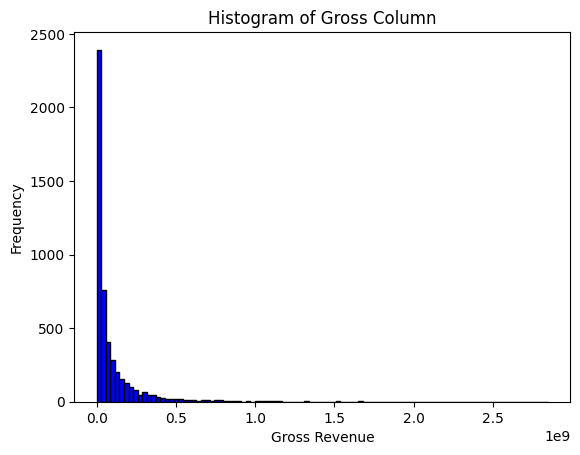

In [ ]:
# Display the gross column as a histogram
gross_data = dataset['gross']

# Plotting the histogram
plt.hist(gross_data, bins=100, color='blue', edgecolor='black')

# Adding labels and title
plt.xlabel('Gross Revenue')
plt.ylabel('Frequency')
plt.title('Histogram of Gross Column')

# Display the plot
plt.show()

In [ ]:
def impute_gross_for_genre_and_year(dataset):
    # Calculate median gross for each genre and year
    genre_year_median_gross = dataset.groupby(['genre', 'year'])['gross'].median()

    # Define a function to impute missing gross values
    def impute_gross(row):
        if pd.isna(row['gross']):
            if (row['genre'], row['year']) in genre_year_median_gross:
                return genre_year_median_gross[(row['genre'], row['year'])]
            else:
                # If no median value is found for the specific genre and year, return NaN
                return float('NaN')
        else:
            return row['gross']

    # Apply the imputation function to fill in missing 'gross' values
    dataset['gross'] = dataset.apply(impute_gross, axis=1)

    return dataset


dataset = impute_gross_for_genre_and_year(dataset)
print(dataset)

                                                name rating      genre  year  \
1                                    The Blue Lagoon      R  Adventure  1980   
2     Star Wars: Episode V - The Empire Strikes Back     PG     Action  1980   
3                                          Airplane!     PG     Comedy  1980   
4                                         Caddyshack      R     Comedy  1980   
5                                    Friday the 13th      R     Horror  1980   
...                                              ...    ...        ...   ...   
7645                                   Birds of Prey      R     Action  2020   
7648                               Bad Boys for Life      R     Action  2020   
7649                              Sonic the Hedgehog     PG     Action  2020   
7650                                        Dolittle     PG  Adventure  2020   
7658                       Black Wall Street Burning      R      Drama  2020   

      score      votes            direc

In [ ]:
# Display the entries where 'gross' is NA
missing_gross_entries = dataset[dataset['gross'].isna()]
print("Entries where 'gross' is NA:")
print(missing_gross_entries)

Entries where 'gross' is NA:
                           name rating  genre  year  score  votes  \
7658  Black Wall Street Burning      R  Drama  2020    6.6   35.0   

          director           writer         star  budget  gross       company  \
7658  Marcus Brown  Dekoven Riggins  Dan Belcher  5000.0    NaN  Notis Studio   

      runtime released_date released_day_of_week  released_week_number  \
7658     78.0    2020-02-07               Friday                     6   

     released_month  released_year  season  
7658       February         2020.0  Winter  


In [ ]:
# Drop the entries from the dataset
dataset = dataset[dataset['gross'].notna()]
print(dataset)

                                                name rating      genre  year  \
1                                    The Blue Lagoon      R  Adventure  1980   
2     Star Wars: Episode V - The Empire Strikes Back     PG     Action  1980   
3                                          Airplane!     PG     Comedy  1980   
4                                         Caddyshack      R     Comedy  1980   
5                                    Friday the 13th      R     Horror  1980   
...                                              ...    ...        ...   ...   
7644                               Wonder Woman 1984  PG-13     Action  2020   
7645                                   Birds of Prey      R     Action  2020   
7648                               Bad Boys for Life      R     Action  2020   
7649                              Sonic the Hedgehog     PG     Action  2020   
7650                                        Dolittle     PG  Adventure  2020   

      score      votes            direc

In [ ]:
dataset_details(dataset)

                      Missing Values  %ge of Missing Values      Data Types  \
name                               0                    0.0          object   
rating                             0                    0.0          object   
genre                              0                    0.0          object   
year                               0                    0.0           int64   
score                              0                    0.0         float64   
votes                              0                    0.0         float64   
director                           0                    0.0          object   
writer                             0                    0.0          object   
star                               0                    0.0          object   
budget                             0                    0.0         float64   
gross                              0                    0.0         float64   
company                            0                

## Calculating Inflation Adjusted Budget and Gross values

In [ ]:
from google.colab import files

uploaded = files.upload()

# Upload US population and CPI data 1980-2020.csv from Drive: https://drive.google.com/drive/folders/1XEyDHOgZQdbPNxKG7IlgArVjgr8cOpEe?usp=drive_link to runtime

Saving US population and CPI data 1980-2020.csv to US population and CPI data 1980-2020.csv


In [ ]:
# Bringing in US population and CPI data from 1980-2020
indices_df = pd.read_csv('US population and CPI data 1980-2020.csv')

In [ ]:
# making indices_df column names in lower case
indices_df.columns = [col.lower() for col in indices_df.columns]

In [ ]:
# Merge datasets based on the 'year' column
merged_df = pd.merge(dataset, indices_df, on='year', how='left')

# Calculate adjusted budget and adjusted gross
merged_df['adjusted_budget'] = merged_df['budget'] * merged_df['cpi_ratio']
merged_df['adjusted_gross'] = merged_df['gross'] * merged_df['cpi_ratio'] * merged_df['population_ratio']

# Display the resulting DataFrame
pd.set_option('display.max_rows', 100)
print(merged_df)

                                                name rating      genre  year  \
0                                    The Blue Lagoon      R  Adventure  1980   
1     Star Wars: Episode V - The Empire Strikes Back     PG     Action  1980   
2                                          Airplane!     PG     Comedy  1980   
3                                         Caddyshack      R     Comedy  1980   
4                                    Friday the 13th      R     Horror  1980   
...                                              ...    ...        ...   ...   
5054                               Wonder Woman 1984  PG-13     Action  2020   
5055                                   Birds of Prey      R     Action  2020   
5056                               Bad Boys for Life      R     Action  2020   
5057                              Sonic the Hedgehog     PG     Action  2020   
5058                                        Dolittle     PG  Adventure  2020   

      score      votes            direc

In [ ]:
merged_df = merged_df.drop(['budget', 'gross'], axis=1)
print(merged_df)

                                                name rating      genre  year  \
0                                    The Blue Lagoon      R  Adventure  1980   
1     Star Wars: Episode V - The Empire Strikes Back     PG     Action  1980   
2                                          Airplane!     PG     Comedy  1980   
3                                         Caddyshack      R     Comedy  1980   
4                                    Friday the 13th      R     Horror  1980   
...                                              ...    ...        ...   ...   
5054                               Wonder Woman 1984  PG-13     Action  2020   
5055                                   Birds of Prey      R     Action  2020   
5056                               Bad Boys for Life      R     Action  2020   
5057                              Sonic the Hedgehog     PG     Action  2020   
5058                                        Dolittle     PG  Adventure  2020   

      score      votes            direc

In [ ]:
merged_df = merged_df.drop(['annual_average_cpi_u','cpi_ratio', 'population_ratio'], axis=1)
print(merged_df)

                                                name rating      genre  year  \
0                                    The Blue Lagoon      R  Adventure  1980   
1     Star Wars: Episode V - The Empire Strikes Back     PG     Action  1980   
2                                          Airplane!     PG     Comedy  1980   
3                                         Caddyshack      R     Comedy  1980   
4                                    Friday the 13th      R     Horror  1980   
...                                              ...    ...        ...   ...   
5054                               Wonder Woman 1984  PG-13     Action  2020   
5055                                   Birds of Prey      R     Action  2020   
5056                               Bad Boys for Life      R     Action  2020   
5057                              Sonic the Hedgehog     PG     Action  2020   
5058                                        Dolittle     PG  Adventure  2020   

      score      votes            direc

## Calculating Net Profit and ROI

In [ ]:
merged_df['net_profit']=merged_df['adjusted_gross']-merged_df['adjusted_budget']
merged_df['roi_in_%']=(merged_df['net_profit']/merged_df['adjusted_budget'])*100
print(merged_df)

                                                name rating      genre  year  \
0                                    The Blue Lagoon      R  Adventure  1980   
1     Star Wars: Episode V - The Empire Strikes Back     PG     Action  1980   
2                                          Airplane!     PG     Comedy  1980   
3                                         Caddyshack      R     Comedy  1980   
4                                    Friday the 13th      R     Horror  1980   
...                                              ...    ...        ...   ...   
5054                               Wonder Woman 1984  PG-13     Action  2020   
5055                                   Birds of Prey      R     Action  2020   
5056                               Bad Boys for Life      R     Action  2020   
5057                              Sonic the Hedgehog     PG     Action  2020   
5058                                        Dolittle     PG  Adventure  2020   

      score      votes            direc

## Arriving at the Frequency Counts per year and genre respectively and dropping low frequencies for 2020 year and Western genre

In [ ]:
#Movies count over years

movie_count_by_year = merged_df['year'].value_counts().sort_index()
print(movie_count_by_year)

# as 2020 has only 6 movies and looks like an outlier to better to remove them

year
1980     72
1981     77
1982     87
1983     88
1984    119
1985    131
1986    139
1987    136
1988    143
1989    152
1990    147
1991    140
1992    131
1993    147
1994    143
1995    148
1996    161
1997    145
1998    137
1999    132
2000    125
2001    126
2002    128
2003    129
2004    125
2005    128
2006    130
2007    140
2008    126
2009    126
2010    121
2011    114
2012    125
2013    124
2014    130
2015    124
2016    126
2017    122
2018    113
2019     96
2020      6
Name: count, dtype: int64


In [ ]:
# Drop movies with the year 2020
merged_df = merged_df[merged_df['year'] != 2020]
print(merged_df.shape)

(5053, 22)


In [ ]:
#Movies count by Genre

movie_count_by_genre = merged_df['genre'].value_counts().sort_index()
print(movie_count_by_genre)

genre
Action       1253
Adventure     262
Animation     232
Biography     230
Comedy       1674
Crime         333
Drama         781
Family          4
Fantasy        33
Horror        225
Mystery        13
Romance         2
Sci-Fi          5
Thriller        5
Western         1
Name: count, dtype: int64


In [ ]:
# Drop Western genre
merged_df = merged_df[merged_df['genre'] != 'Western']
merged_df.shape

(5052, 22)

## Fate Tagging for each movie

In [ ]:
# Fate of movie:
#Movie that earned more than 2.5x budget - is a BLOCKBUSTER.

#Movie that earned more than 1.5x budget - would be a HIT.

#Movie that earned as much as the budget - would be a AVERAGE.

#Movie that earned less than budget - would be a FLOP.

#Movie that earned less than 3/4 of budget - would be a box office BOMB.

# Calculate the fate category based on the rules
merged_df['fate'] = pd.cut(
    merged_df['adjusted_gross'] / merged_df['adjusted_budget'],
    bins=[0, 0.75, 1, 1.5, 2.5, float('inf')],
    labels=['Bomb', 'Flop', 'Average', 'Hit', 'Blockbuster']
)

# Display the DataFrame with the new 'fate' column
print(merged_df[['adjusted_gross', 'adjusted_budget', 'fate']])

      adjusted_gross  adjusted_budget         fate
0       2.821104e+07     1.432767e+06  Blockbuster
1       2.580683e+08     5.731066e+06  Blockbuster
2       4.000318e+07     1.114374e+06  Blockbuster
3       1.910022e+07     1.910355e+06  Blockbuster
4       1.905624e+07     1.751159e+05  Blockbuster
...              ...              ...          ...
5048    5.086197e+03     2.025444e+07         Bomb
5049    4.536773e+04     1.185626e+06         Bomb
5050    9.477830e+05     1.976043e+07         Bomb
5051    1.794233e+06     3.655680e+07         Bomb
5052    1.093557e+06     8.526627e+07         Bomb

[5052 rows x 3 columns]


## Exploratory Data Analysis

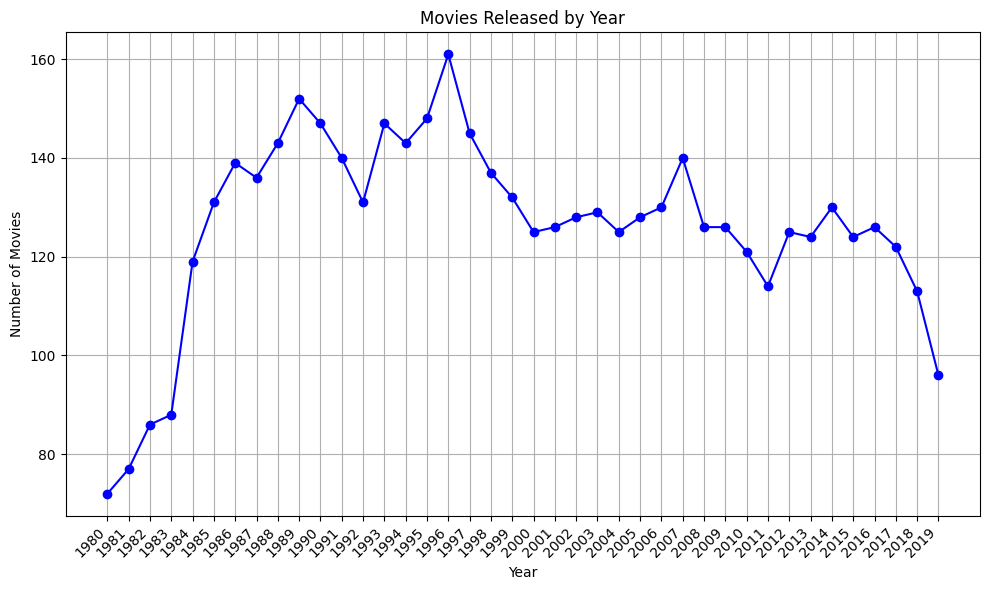

In [ ]:
# COUNT OF MOVIES BY YEAR
movies_by_year = merged_df['year'].value_counts().sort_index()

# Plotting the line graph
plt.figure(figsize=(10, 6))
plt.plot(movies_by_year.index, movies_by_year.values, marker='o', color='b', linestyle='-')
plt.title('Movies Released by Year')
plt.xlabel('Year')
plt.ylabel('Number of Movies')
plt.xticks(rotation=45, ha='right')
plt.grid(True)
plt.xticks(movies_by_year.index)
plt.tight_layout()
plt.show()

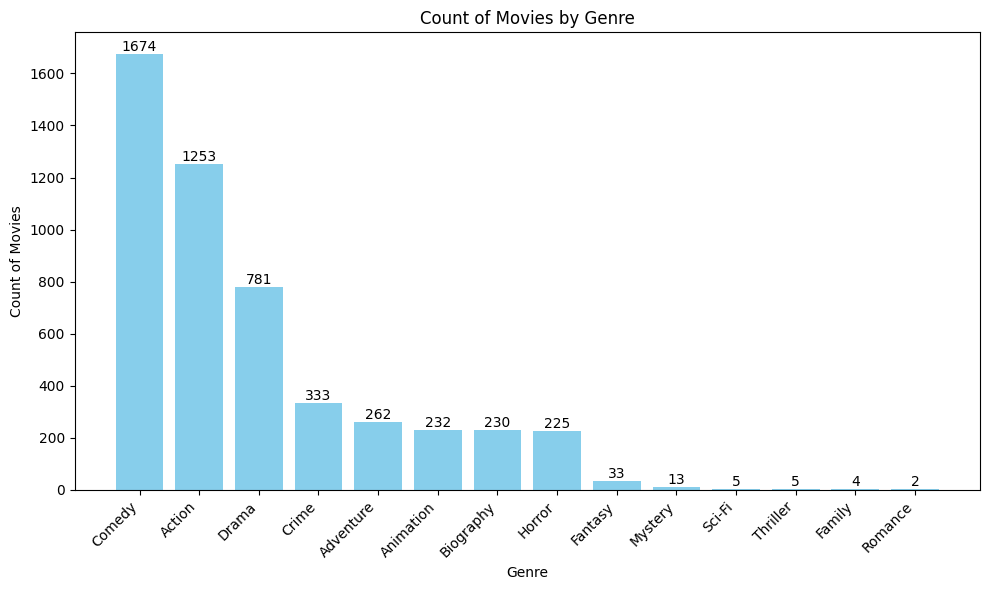

In [ ]:
# COUNT OF MOVIES BY GENRE
movie_count_by_genre = merged_df['genre'].value_counts()

# Plotting the bar graph
plt.figure(figsize=(10, 6))

# Creating the bar plot
bar_plot = plt.bar(movie_count_by_genre.index, movie_count_by_genre.values, color='skyblue')

# Rotating x-axis labels
plt.xticks(rotation=45, ha='right')

# Adding labels and title
plt.title('Count of Movies by Genre')
plt.xlabel('Genre')
plt.ylabel('Count of Movies')

# Adding counts on top of each bar
for bar in bar_plot:
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height(), str(int(bar.get_height())), ha='center', va='bottom')

plt.tight_layout()
plt.show()

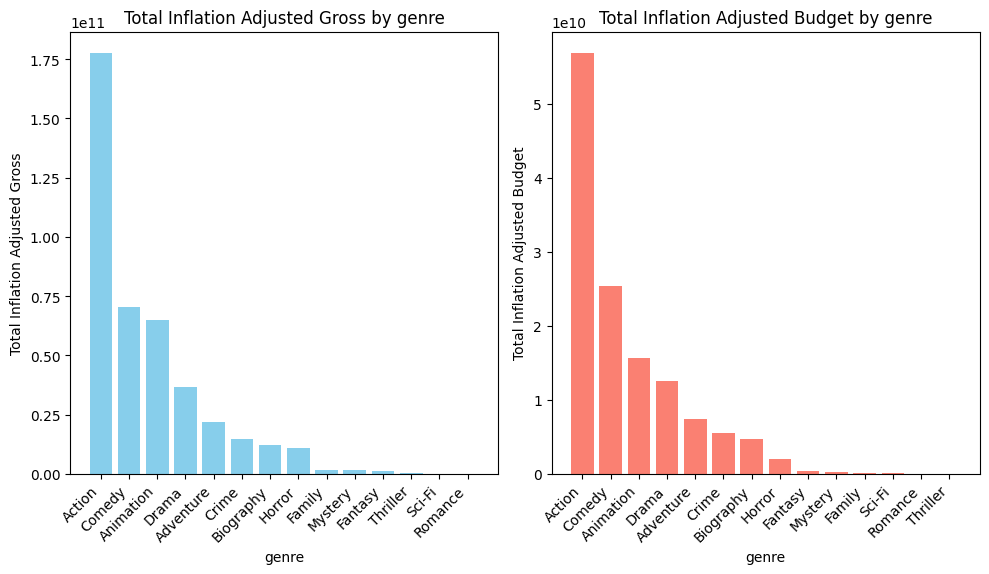

In [ ]:
#TOTAL GROSS AND BUDGET BY GENERE

# Group the dataset by genre and calculate total budget and gross for each genre
genre_budget_totals = merged_df.groupby('genre')['adjusted_budget'].sum().reset_index()
genre_gross_totals = merged_df.groupby('genre')['adjusted_gross'].sum().reset_index()

# Sort the genre_totals DataFrame by either gross or budget in descending order
genre_gross_totals = genre_gross_totals.sort_values(by='adjusted_gross', ascending=False)

# Plotting the bar chart
plt.figure(figsize=(10, 6))

# Plot total gross by genre
plt.subplot(1, 2, 1)
plt.bar(genre_gross_totals['genre'], genre_gross_totals['adjusted_gross'], color='skyblue')
plt.title('Total Inflation Adjusted Gross by genre')
plt.xlabel('genre')
plt.ylabel('Total Inflation Adjusted Gross')
plt.xticks(rotation=45, ha='right')  # Rotate labels by 45 degrees

# Sort the genre_totals DataFrame by budget in descending order
genre_budget_totals = genre_budget_totals.sort_values(by='adjusted_budget', ascending=False)

# Plot total budget by genre
plt.subplot(1, 2, 2)
plt.bar(genre_budget_totals['genre'], genre_budget_totals['adjusted_budget'], color='salmon')
plt.title('Total Inflation Adjusted Budget by genre')
plt.xlabel('genre')
plt.ylabel('Total Inflation Adjusted Budget')
plt.xticks(rotation=45, ha='right')  # Rotate labels by 45 degrees
plt.tight_layout()
plt.show()

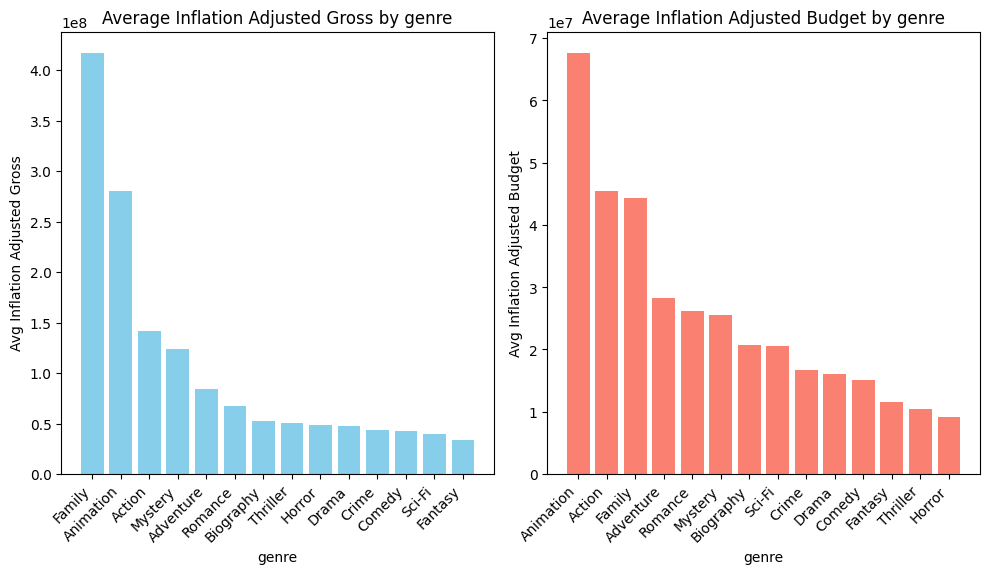

In [ ]:
#Average gross and Budget by genre and drill down
# Group by genre and calculate the mean for gross and budget
genre_budget_mean = merged_df.groupby('genre')['adjusted_budget'].mean().reset_index()
genre_gross_mean = merged_df.groupby('genre')['adjusted_gross'].mean().reset_index()

# Sort the genre_totals DataFrame by either gross or budget in descending order
genre_gross_mean = genre_gross_mean.sort_values(by='adjusted_gross', ascending=False)

# Plotting the bar chart
plt.figure(figsize=(10, 6))

# Plot total gross by genre
plt.subplot(1, 2, 1)
plt.bar(genre_gross_mean['genre'], genre_gross_mean['adjusted_gross'], color='skyblue')
plt.title('Average Inflation Adjusted Gross by genre')
plt.xlabel('genre')
plt.ylabel('Avg Inflation Adjusted Gross')
plt.xticks(rotation=45, ha='right')  # Rotate labels by 45 degrees

# Sort the genre_totals DataFrame by budget in descending order
genre_budget_mean = genre_budget_mean.sort_values(by='adjusted_budget', ascending=False)

# Plot total budget by genre
plt.subplot(1, 2, 2)
plt.bar(genre_budget_mean['genre'], genre_budget_mean['adjusted_budget'], color='salmon')
plt.title('Average Inflation Adjusted Budget by genre')
plt.xlabel('genre')
plt.ylabel('Avg Inflation Adjusted Budget')
plt.xticks(rotation=45, ha='right')  # Rotate labels by 45 degrees
plt.tight_layout()
plt.show()

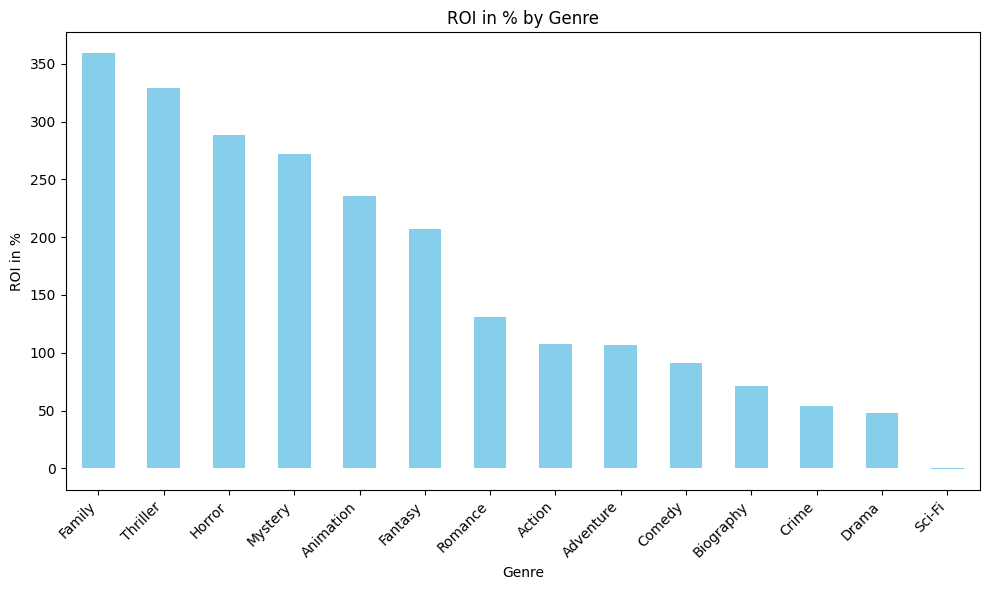

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# ROI by genre

# Group by genre and calculate the average roi for each genre
median_roi_by_genre = merged_df.groupby('genre')['roi_in_%'].median().sort_values(ascending=False)

# Plotting the bar graph
plt.figure(figsize=(10, 6))
median_roi_by_genre.plot(kind='bar', color='skyblue')
plt.title('ROI in % by Genre')
plt.xlabel('Genre')
plt.ylabel('ROI in %')
plt.xticks(rotation=45, ha='right')

plt.tight_layout()
plt.show()

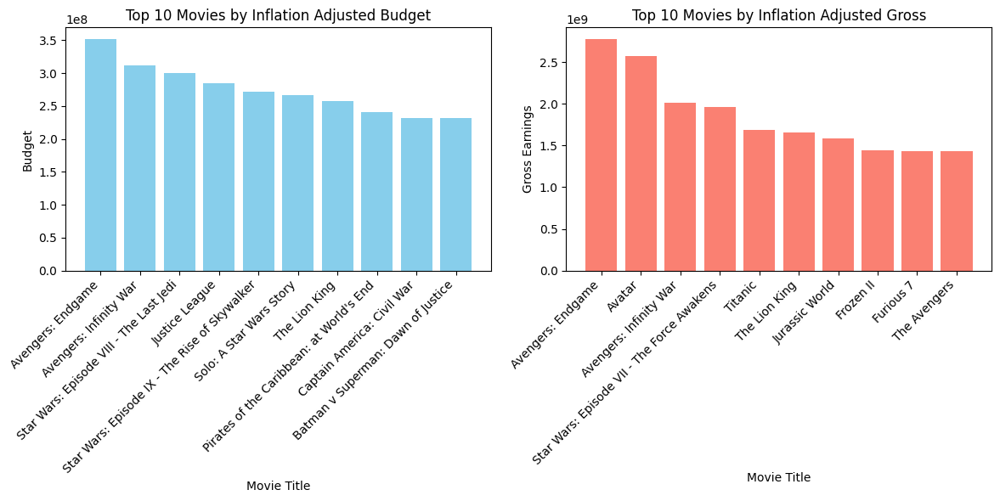

In [ ]:
# TOP 10 MOVIES BY BUDGET AND GROSS
# Sort the dataset by Inflation Adjusted budget and gross
top_10_by_budget = merged_df.nlargest(10, 'adjusted_budget')
top_10_by_gross = merged_df.nlargest(10, 'adjusted_gross')

# Plotting the bar graphs
plt.figure(figsize=(12, 6))

# Bar graph for top 10 movies by budget
plt.subplot(1, 2, 1)
plt.bar(top_10_by_budget['name'], top_10_by_budget['adjusted_budget'], color='skyblue')
plt.title('Top 10 Movies by Inflation Adjusted Budget')
plt.xlabel('Movie Title')
plt.ylabel('Budget')
plt.xticks(rotation=45, ha='right')

# Bar graph for top 10 movies by gross
plt.subplot(1, 2, 2)
plt.bar(top_10_by_gross['name'], top_10_by_gross['adjusted_gross'], color='salmon')
plt.title('Top 10 Movies by Inflation Adjusted Gross')
plt.xlabel('Movie Title')
plt.ylabel('Gross Earnings')
plt.xticks(rotation=45, ha='right')

plt.tight_layout()
plt.show()

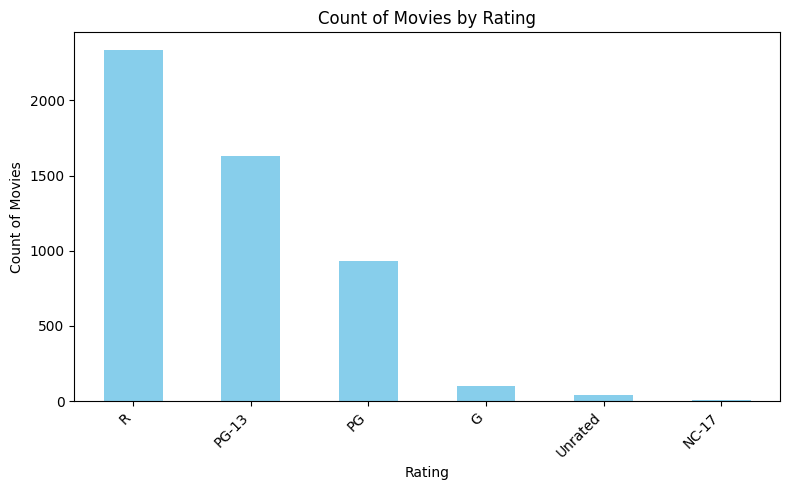

In [ ]:
# Count of movies by ratings
movie_count_by_genre = merged_df['rating'].value_counts()

# Plotting the bar chart
plt.figure(figsize=(8, 5))
movie_count_by_genre.plot(kind='bar', color='skyblue')
plt.title('Count of Movies by Rating')
plt.xlabel('Rating')
plt.ylabel('Count of Movies')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

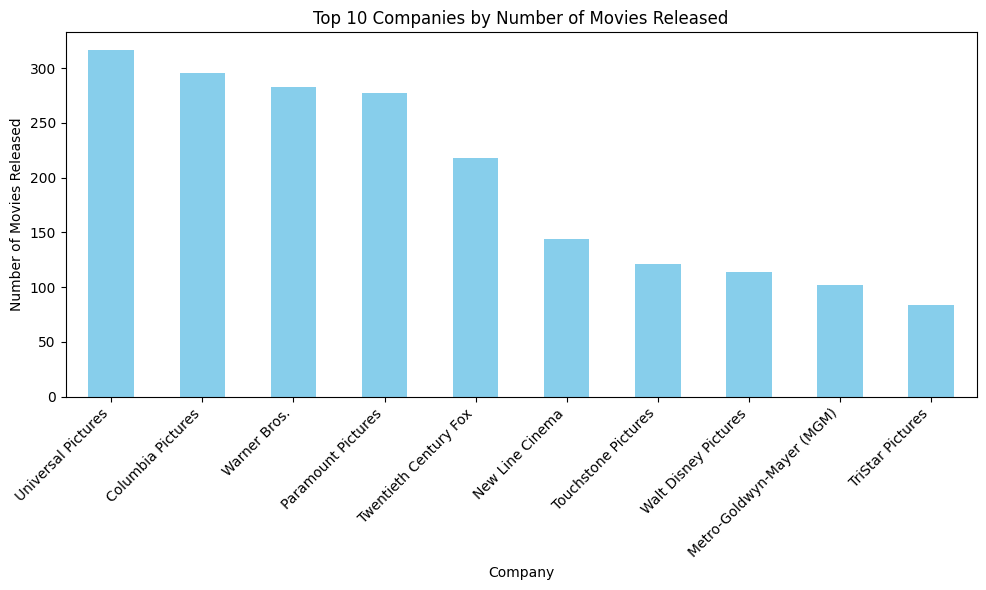

In [ ]:
# Count the number of movies released by each company
company_counts = merged_df['company'].value_counts()

# Select the top 10 companies
top_10_companies = company_counts.head(10)

# Plotting the bar graph
plt.figure(figsize=(10, 6))
top_10_companies.plot(kind='bar', color='skyblue')
plt.title('Top 10 Companies by Number of Movies Released')
plt.xlabel('Company')
plt.ylabel('Number of Movies Released')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

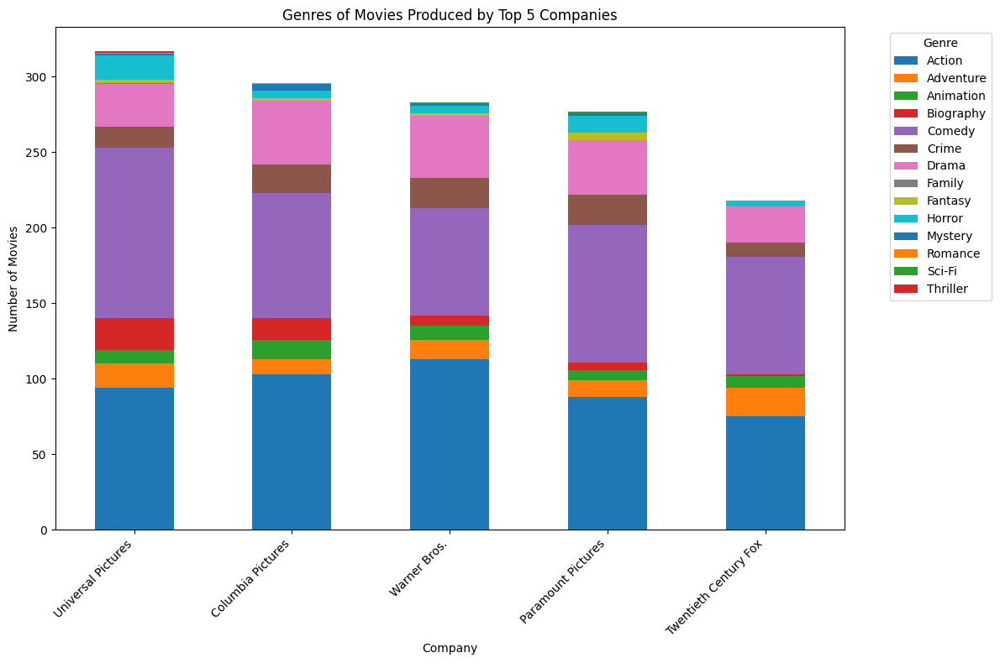

In [ ]:
# Distriution of Genre amongst Top5 Production Houses
# Calculate the count of movies produced by each company
movie_counts_by_company = merged_df['company'].value_counts()

# Filter top 5 companies with the maximum number of movies
top_5_companies = movie_counts_by_company.nlargest(5).index

# Filter DataFrame to include only movies from top 5 companies
top_5_df = merged_df[merged_df['company'].isin(top_5_companies)]

# Count the number of movies for each genre produced by each of the top 5 companies
genre_counts_by_company = top_5_df.groupby(['company', 'genre']).size().unstack(fill_value=0)

# Sort companies by the total number of movies produced in descending order
genre_counts_by_company = genre_counts_by_company.loc[top_5_companies]

# Plotting the graph
genre_counts_by_company.plot(kind='bar', stacked=True, figsize=(12, 8))

# Adding labels and title
plt.title('Genres of Movies Produced by Top 5 Companies')
plt.xlabel('Company')
plt.ylabel('Number of Movies')
plt.xticks(rotation=45, ha='right')

plt.legend(title='Genre', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

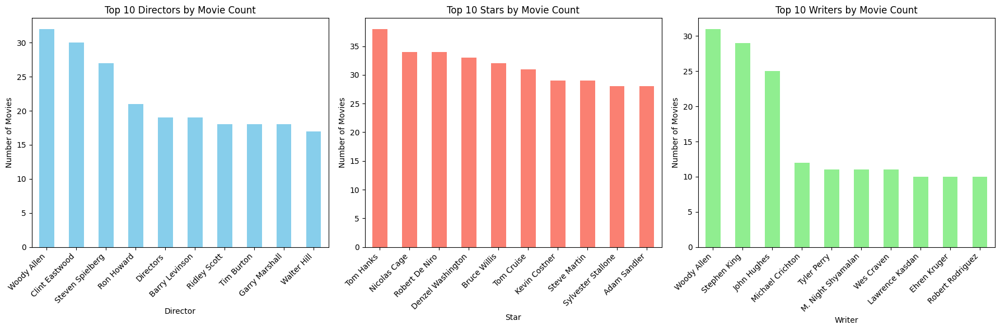

In [ ]:
# Count the number of movies for each director, star, and writer
director_counts = merged_df['director'].value_counts().head(10)
star_counts = merged_df['star'].value_counts().head(10)
writer_counts = merged_df['writer'].value_counts().head(10)

# Plotting the bar graphs
plt.figure(figsize=(18, 6))

# Plot for directors
plt.subplot(1, 3, 1)
director_counts.plot(kind='bar', color='skyblue')
plt.title('Top 10 Directors by Movie Count')
plt.xlabel('Director')
plt.ylabel('Number of Movies')
plt.xticks(rotation=45, ha='right')

# Plot for stars
plt.subplot(1, 3, 2)
star_counts.plot(kind='bar', color='salmon')
plt.title('Top 10 Stars by Movie Count')
plt.xlabel('Star')
plt.ylabel('Number of Movies')
plt.xticks(rotation=45, ha='right')

# Plot for writers
plt.subplot(1, 3, 3)
writer_counts.plot(kind='bar', color='lightgreen')
plt.title('Top 10 Writers by Movie Count')
plt.xlabel('Writer')
plt.ylabel('Number of Movies')
plt.xticks(rotation=45, ha='right')

plt.tight_layout()
plt.show()

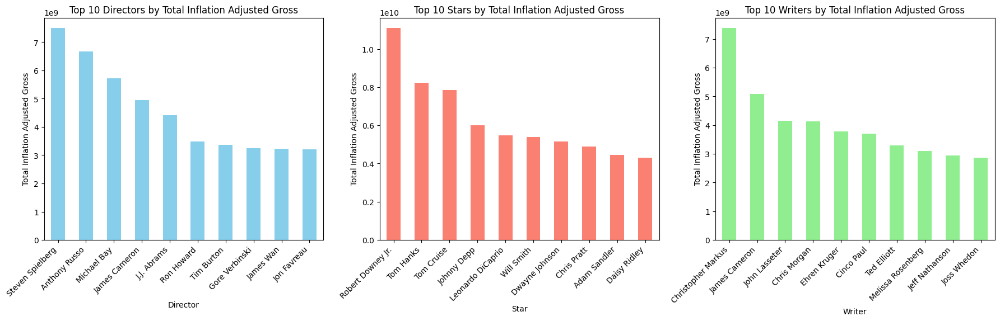

In [ ]:
# Calculate total gross for each director, star, and writer
director_gross = merged_df.groupby('director')['adjusted_gross'].sum().nlargest(10)
star_gross = merged_df.groupby('star')['adjusted_gross'].sum().nlargest(10)
writer_gross = merged_df.groupby('writer')['adjusted_gross'].sum().nlargest(10)

# Plotting the bar graphs
plt.figure(figsize=(18, 6))

# Plot for directors
plt.subplot(1, 3, 1)
director_gross.plot(kind='bar', color='skyblue')
plt.title('Top 10 Directors by Total Inflation Adjusted Gross')
plt.xlabel('Director')
plt.ylabel('Total Inflation Adjusted Gross')
plt.xticks(rotation=45, ha='right')

# Plot for stars
plt.subplot(1, 3, 2)
star_gross.plot(kind='bar', color='salmon')
plt.title('Top 10 Stars by Total Inflation Adjusted Gross')
plt.xlabel('Star')
plt.ylabel('Total Inflation Adjusted Gross')
plt.xticks(rotation=45, ha='right')

# Plot for writers
plt.subplot(1, 3, 3)
writer_gross.plot(kind='bar', color='lightgreen')
plt.title('Top 10 Writers by Total Inflation Adjusted Gross')
plt.xlabel('Writer')
plt.ylabel('Total Inflation Adjusted Gross')
plt.xticks(rotation=45, ha='right')

plt.tight_layout()
plt.show()

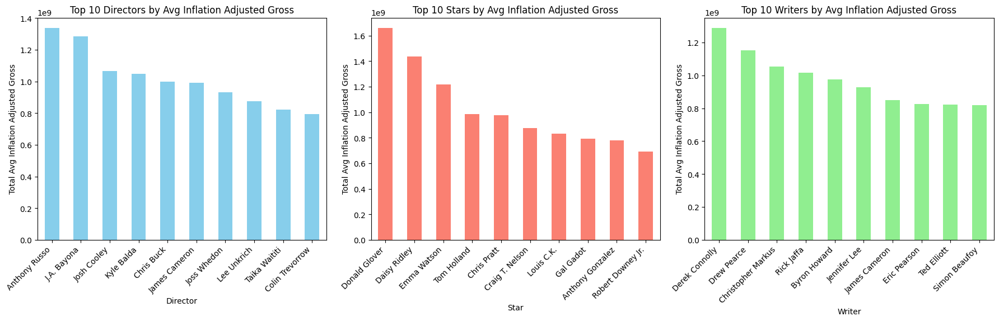

In [ ]:
# Can we add a mean also for above data?
# Calculate total gross for each director, star, and writer
director_gross = merged_df.groupby('director')['adjusted_gross'].mean().nlargest(10)
star_gross = merged_df.groupby('star')['adjusted_gross'].mean().nlargest(10)
writer_gross = merged_df.groupby('writer')['adjusted_gross'].mean().nlargest(10)

# Plotting the bar graphs
plt.figure(figsize=(18, 6))

# Plot for directors
plt.subplot(1, 3, 1)
director_gross.plot(kind='bar', color='skyblue')
plt.title('Top 10 Directors by Avg Inflation Adjusted Gross')
plt.xlabel('Director')
plt.ylabel('Total Avg Inflation Adjusted Gross')
plt.xticks(rotation=45, ha='right')

# Plot for stars
plt.subplot(1, 3, 2)
star_gross.plot(kind='bar', color='salmon')
plt.title('Top 10 Stars by Avg Inflation Adjusted Gross')
plt.xlabel('Star')
plt.ylabel('Total Avg Inflation Adjusted Gross')
plt.xticks(rotation=45, ha='right')

# Plot for writers
plt.subplot(1, 3, 3)
writer_gross.plot(kind='bar', color='lightgreen')
plt.title('Top 10 Writers by Avg Inflation Adjusted Gross')
plt.xlabel('Writer')
plt.ylabel('Total Avg Inflation Adjusted Gross')
plt.xticks(rotation=45, ha='right')

plt.tight_layout()
plt.show()

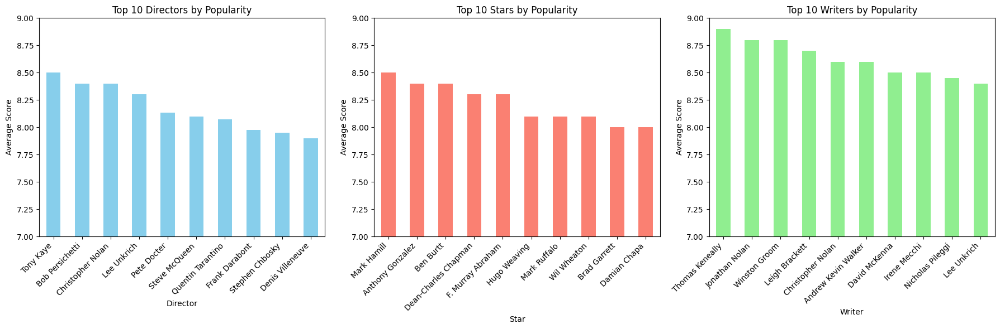

In [ ]:
# Calculate Popularity for each director, star, and writer
director_score = merged_df.groupby('director')['score'].mean().nlargest(10)
star_score = merged_df.groupby('star')['score'].mean().nlargest(10)
writer_score = merged_df.groupby('writer')['score'].mean().nlargest(10)

# Plotting the bar graphs
plt.figure(figsize=(18, 6))

# Plot for directors
plt.subplot(1, 3, 1)
director_score.plot(kind='bar', color='skyblue')
plt.title('Top 10 Directors by Popularity')
plt.xlabel('Director')
plt.ylabel('Average Score')
# Set y-axis range from 7 to 9
plt.ylim(7, 9)
plt.xticks(rotation=45, ha='right')

# Plot for stars
plt.subplot(1, 3, 2)
star_score.plot(kind='bar', color='salmon')
plt.title('Top 10 Stars by Popularity')
plt.xlabel('Star')
plt.ylabel('Average Score')
# Set y-axis range from 7 to 9
plt.ylim(7, 9)
plt.xticks(rotation=45, ha='right')

# Plot for writers
plt.subplot(1, 3, 3)
writer_score.plot(kind='bar', color='lightgreen')
plt.title('Top 10 Writers by Popularity')
plt.xlabel('Writer')
plt.ylabel('Average Score')
# Set y-axis range from 7 to 9
plt.ylim(7, 9)
plt.xticks(rotation=45, ha='right')

plt.tight_layout()
plt.show()

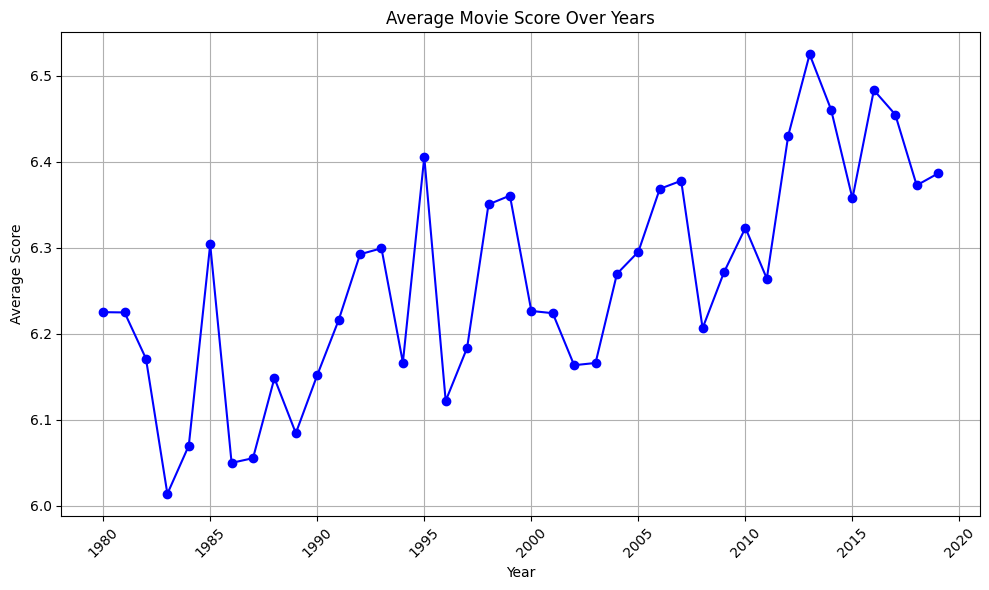

In [ ]:
# How average movie score fluctuated over years?
# Calculate average movie score for each year
avg_score_by_year = merged_df.groupby('year')['score'].mean()

# Plotting the line graph
plt.figure(figsize=(10, 6))

plt.plot(avg_score_by_year.index, avg_score_by_year.values, marker='o', color='b')

plt.title('Average Movie Score Over Years')
plt.xlabel('Year')
plt.ylabel('Average Score')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

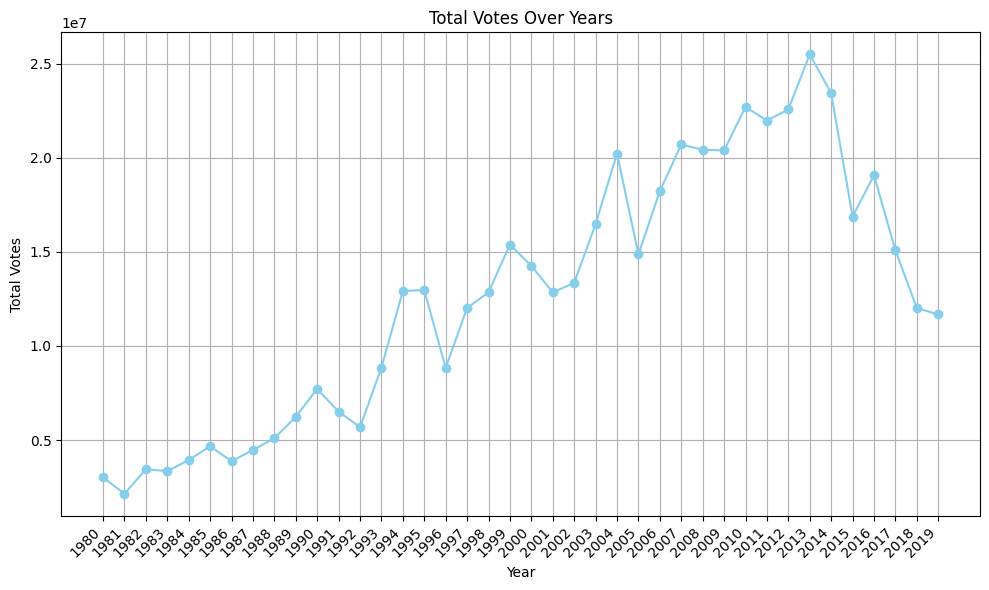

In [ ]:
# Aggregate total votes by year
total_votes_by_year = merged_df.groupby('year')['votes'].sum()

# Plotting the graph
plt.figure(figsize=(10, 6))
plt.plot(total_votes_by_year.index, total_votes_by_year.values, marker='o', color='skyblue', linestyle='-')
plt.title('Total Votes Over Years')
plt.xlabel('Year')
plt.ylabel('Total Votes')
plt.grid(True)
# plt.xticks(total_votes_by_year.index)  # Ensure all years are displayed
# Rotate x-axis labels by 45 degrees
plt.xticks(total_votes_by_year.index, rotation=45, ha='right')

plt.tight_layout()
plt.show()

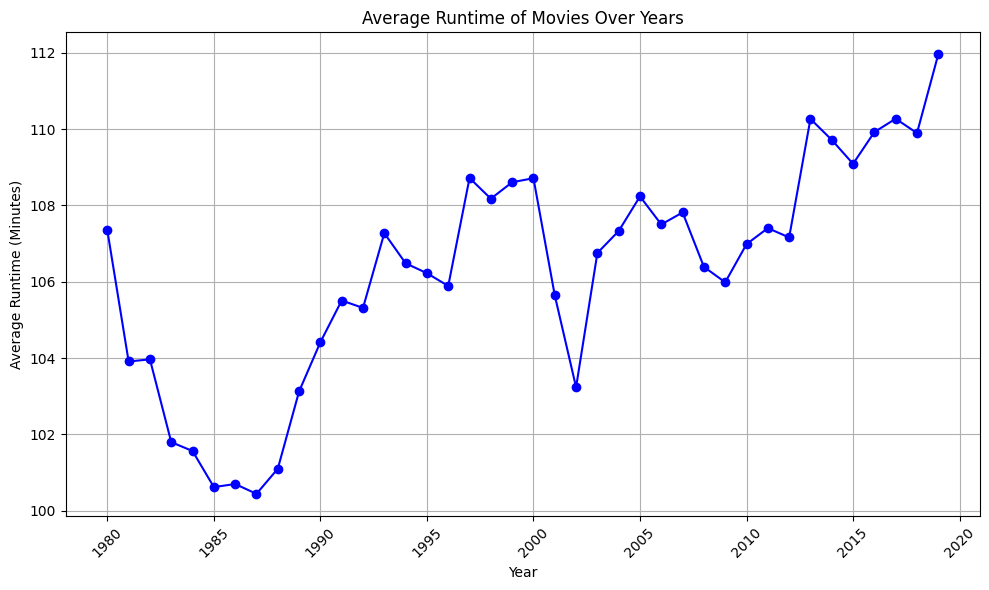

In [ ]:
# How runtime of movies changed over years?
# Calculate average runtime of movies for each year
avg_runtime_by_year = merged_df.groupby('year')['runtime'].mean()

# Plotting the line graph
plt.figure(figsize=(10, 6))

plt.plot(avg_runtime_by_year.index, avg_runtime_by_year.values, marker='o', color='b')

plt.title('Average Runtime of Movies Over Years')
plt.xlabel('Year')
plt.ylabel('Average Runtime (Minutes)')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

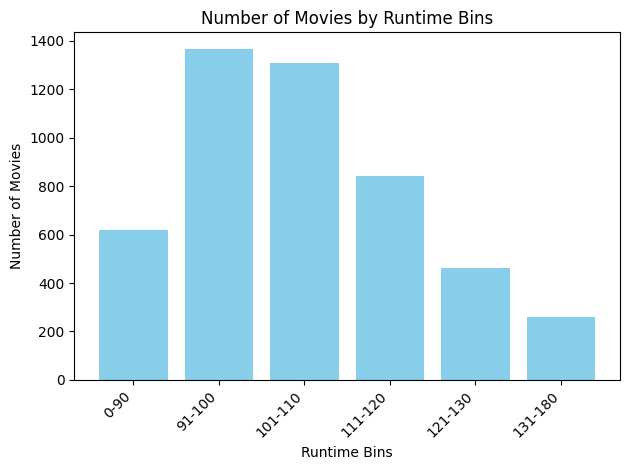

In [ ]:
# Bucketing of movies by runtime range

# Define the bins and labels for runtime
bins = [0, 90, 100, 110, 120, 130, 140]  # Define the bin edges
labels = ['0-90', '91-100', '101-110', '111-120', '121-130', '131-180']  # Define the labels for each bin category

# Create a new column 'Runtime_Category' with bin labels
merged_df['runtime_Category'] = pd.cut(merged_df['runtime'], bins=bins, labels=labels, right=False)

# Count the number of movies in each bin
bin_counts = merged_df['runtime_Category'].value_counts().sort_index()

# Plotting the graph
plt.bar(bin_counts.index, bin_counts.values, color='skyblue')
plt.title('Number of Movies by Runtime Bins')
plt.xlabel('Runtime Bins')
plt.ylabel('Number of Movies')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

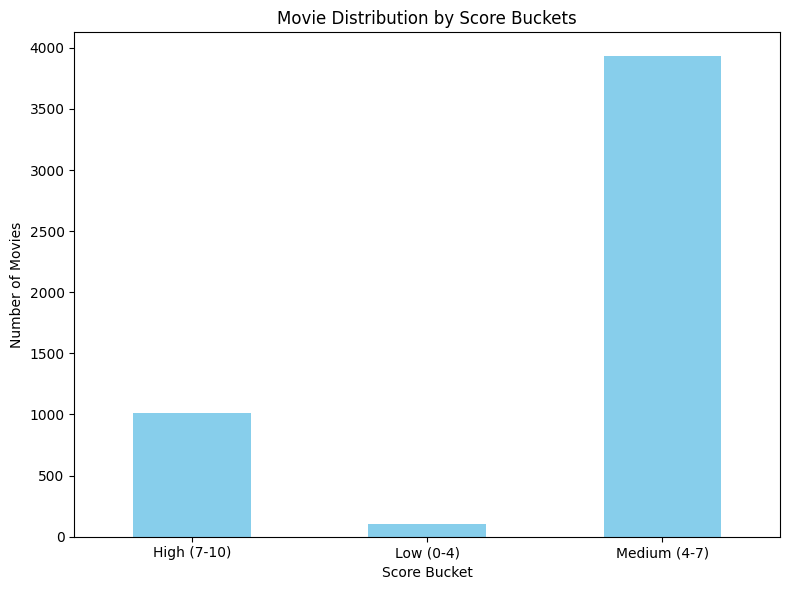

In [ ]:
# Bucketing of movies by Score

# Define score ranges and corresponding bucket names
score_buckets = {
    (0, 4): 'Low (0-4)',
    (4, 7): 'Medium (4-7)',
    (7, 10): 'High (7-10)'
}

# Create a function to assign bucket names based on score
def assign_bucket(score):
    for score_range, bucket_name in score_buckets.items():
        if score_range[0] < score <= score_range[1]:
            return bucket_name

# Apply the function to create a new 'Bucket' column
merged_df['score_bucket'] = merged_df['score'].apply(assign_bucket)

# Count the number of movies in each bucket
bucket_counts = merged_df['score_bucket'].value_counts().sort_index()

# Plotting the bar graph
plt.figure(figsize=(8, 6))
bucket_counts.plot(kind='bar', color='skyblue')
plt.title('Movie Distribution by Score Buckets')
plt.xlabel('Score Bucket')
plt.ylabel('Number of Movies')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

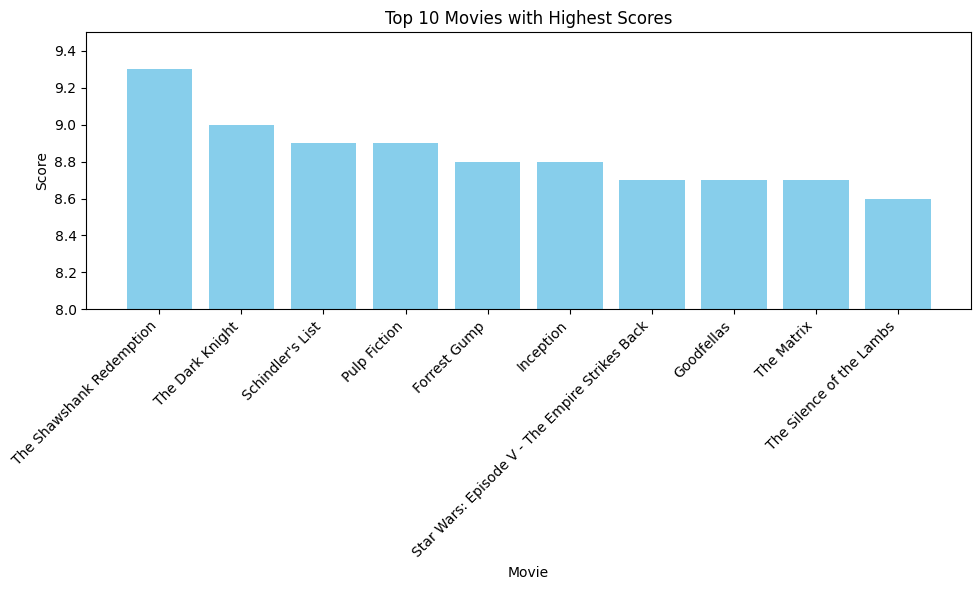

In [ ]:
# Top 10 movies with highest scores
# Sort the DataFrame by score and select the top 10 movies
top_10_movies = merged_df.nlargest(10, 'score')

# Plotting the graph
plt.figure(figsize=(10, 6))
plt.bar(top_10_movies['name'], top_10_movies['score'], color='skyblue')
plt.title('Top 10 Movies with Highest Scores')
plt.xlabel('Movie')
plt.ylabel('Score')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels by 45 degrees
plt.ylim(8, 9.5)  # Set y-axis range from 8 to 9.5
plt.tight_layout()
plt.show()

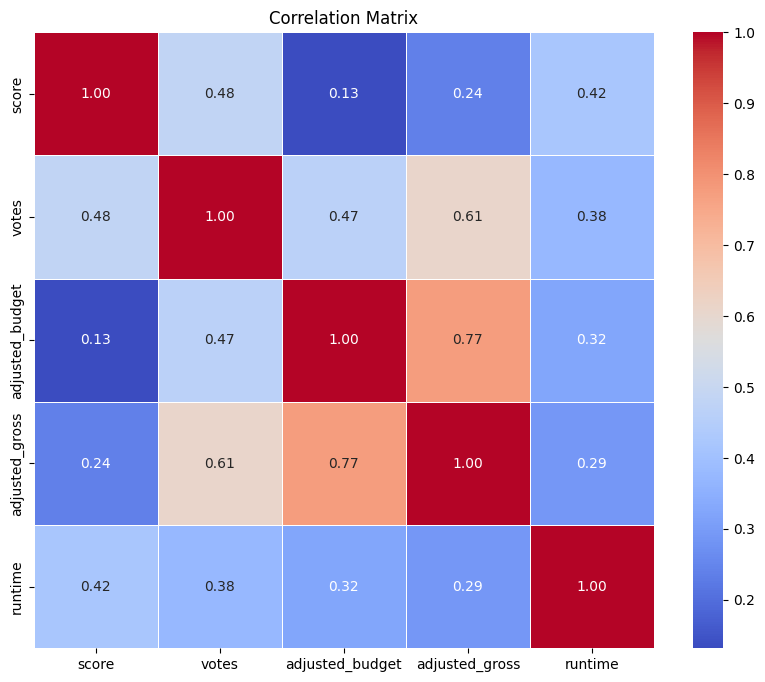

In [ ]:
# Was there any correlation between different variables?

# Calculate the correlation matrix between continous variables
correlation_matrix = merged_df[['score', 'votes', 'adjusted_budget', 'adjusted_gross', 'runtime']].corr()

# Create a heatmap using seaborn
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)

# Set the title
plt.title('Correlation Matrix')

# Display the plot
plt.show()

<Figure size 1200x800 with 0 Axes>

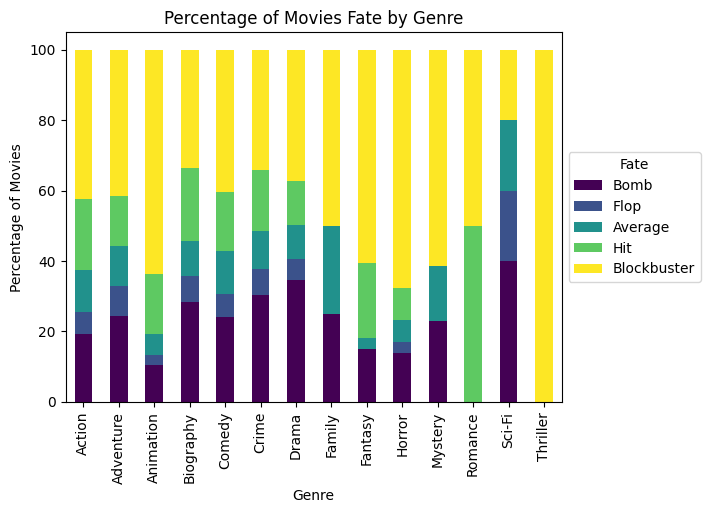

In [ ]:
# Fate of movies by genre

# Create a DataFrame with the percentage of movies by fate category for each genre
percentage_by_fate_genre = merged_df.groupby(['genre', 'fate']).size().unstack(fill_value=0)
percentage_by_fate_genre = percentage_by_fate_genre.div(percentage_by_fate_genre.sum(axis=1), axis=0) * 100

# Create the bar plot
plt.figure(figsize=(12, 8))
ax = percentage_by_fate_genre.plot(kind='bar', stacked=True, colormap='viridis')

# Set labels and title
plt.xlabel('Genre')
plt.ylabel('Percentage of Movies')
plt.title('Percentage of Movies Fate by Genre')
plt.legend(title='Fate', bbox_to_anchor=(1, 0.5), loc='center left')

# Display the plot
plt.show()

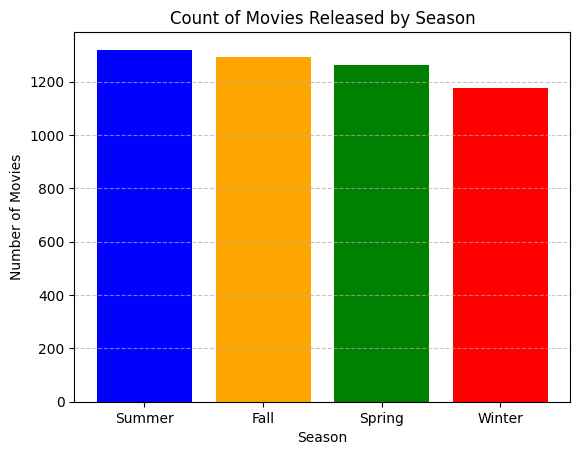

In [ ]:
# Count of movies releaed by Season

# Count of movies released by season
movie_count_by_season = merged_df['season'].value_counts()

# Plotting the bar graph
plt.bar(movie_count_by_season.index, movie_count_by_season.values, color=['blue', 'orange', 'green', 'red'])
plt.title('Count of Movies Released by Season')
plt.xlabel('Season')
plt.ylabel('Number of Movies')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

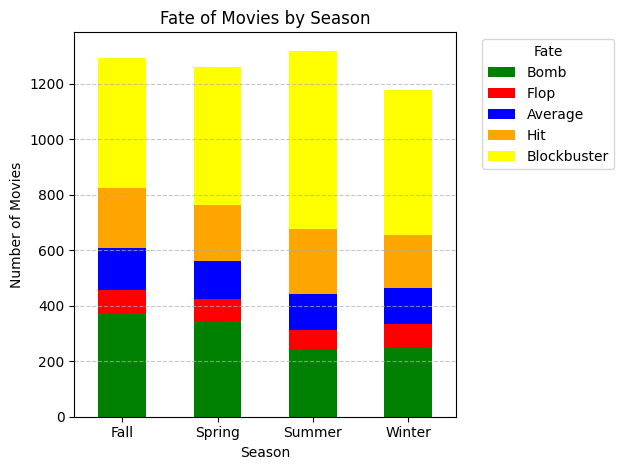

In [ ]:
# Fate of movies by Season
# Count of movies by season and fate
movie_count_by_season_fate = merged_df.groupby(['season', 'fate']).size().unstack(fill_value=0)

# Plotting the bar graph
movie_count_by_season_fate.plot(kind='bar', stacked=True, color=['green', 'red', 'blue', 'orange','yellow'])
plt.title('Fate of Movies by Season')
plt.xlabel('Season')
plt.ylabel('Number of Movies')
plt.xticks(rotation=0)
plt.legend(title='Fate', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

In [ ]:
# Update Bomb, Flop mark as "Loss" and Hit, Superhit and Blockbuster as "Profit"

# Define a function to update values based on conditions
def update_outcome(fate):
    if fate in ['Bomb', 'Flop']:
        return 'Loss'
    elif fate in ['Hit', 'Average', 'Blockbuster']:
        return 'Profit'
    else:
        return 'Unknown'

# Apply the function to create a new column
merged_df['profit_loss'] = merged_df['fate'].apply(update_outcome)

merged_df.head()

,name,rating,genre,year,score,votes,director,writer,star,company,runtime,released_date,released_day_of_week,released_week_number,released_month,released_year,season,population,adjusted_budget,adjusted_gross,net_profit,roi_in_%,fate,runtime_Category,score_bucket,profit_loss
0,The Blue Lagoon,R,Adventure,1980,5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,Columbia Pictures,104.0,1980-07-02,Wednesday,27,July,1980.0,Summer,223140018,1.432767e+06,2.821104e+07,2.677828e+07,1868.990939,Blockbuster,101-110,Medium (4-7),Profit
1,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,Lucasfilm,124.0,1980-06-20,Friday,25,June,1980.0,Summer,223140018,5.731066e+06,2.580683e+08,2.523373e+08,4402.972318,Blockbuster,121-130,High (7-10),Profit
2,Airplane!,PG,Comedy,1980,7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,Paramount Pictures,88.0,1980-07-02,Wednesday,27,July,1980.0,Summer,223140018,1.114374e+06,4.000318e+07,3.888881e+07,3489.744655,Blockbuster,0-90,High (7-10),Profit
3,Caddyshack,R,Comedy,1980,7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,Orion Pictures,98.0,1980-07-25,Friday,30,July,1980.0,Summer,223140018,1.910355e+06,1.910022e+07,1.718986e+07,899.825187,Blockbuster,91-100,High (7-10),Profit
4,Friday the 13th,R,Horror,1980,6.4,123000.0,Sean S. Cunningham,Victor Miller,Betsy Palmer,Paramount Pictures,95.0,1980-05-09,Friday,19,May,1980.0,Spring,223140018,1.751159e+05,1.905624e+07,1.888112e+07,10782.070944,Blockbuster,91-100,Medium (4-7),Profit


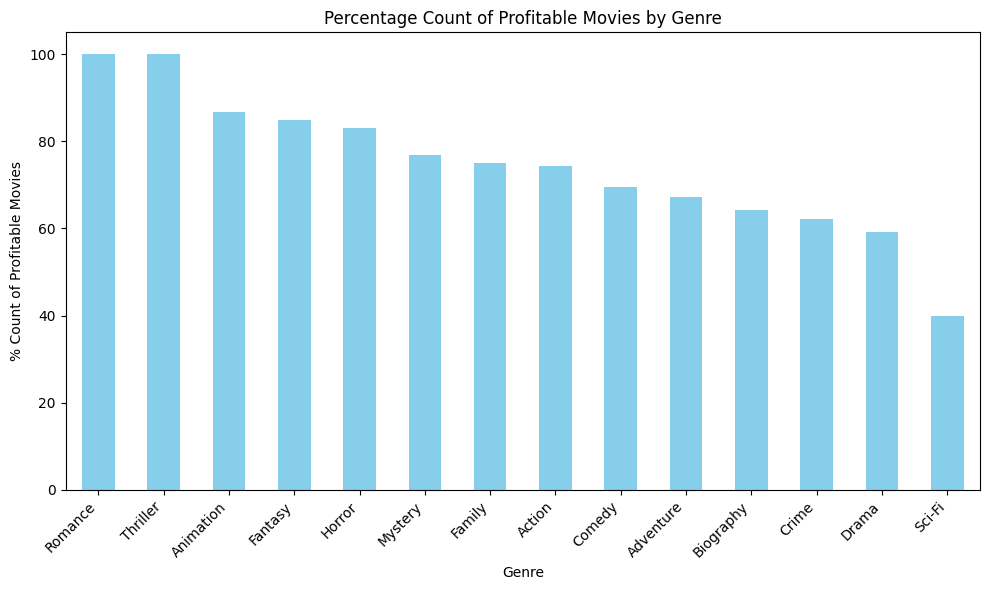

In [ ]:
# % of profitable movies by Writer, Director, Actor
# Filter the DataFrame to select only the rows where profit_loss is 'Profit'
profitable_movies_df = merged_df[merged_df['profit_loss'] == 'Profit']

# Count the occurrences of profitable movies by genre
genre_profit_count = profitable_movies_df.groupby('genre').size()

# Calculate the percentage count of profitable movies for each genre
total_movies_per_genre = merged_df.groupby('genre').size()
percentage_profitable_per_genre = (genre_profit_count / total_movies_per_genre) * 100

# Sort the genres in decreasing order of percentage count of profitable movies
percentage_profitable_per_genre_sorted = percentage_profitable_per_genre.sort_values(ascending=False)

# Plotting the graph
plt.figure(figsize=(10, 6))
percentage_profitable_per_genre_sorted.plot(kind='bar', color='skyblue')
plt.title('Percentage Count of Profitable Movies by Genre')
plt.xlabel('Genre')
plt.ylabel('% Count of Profitable Movies')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

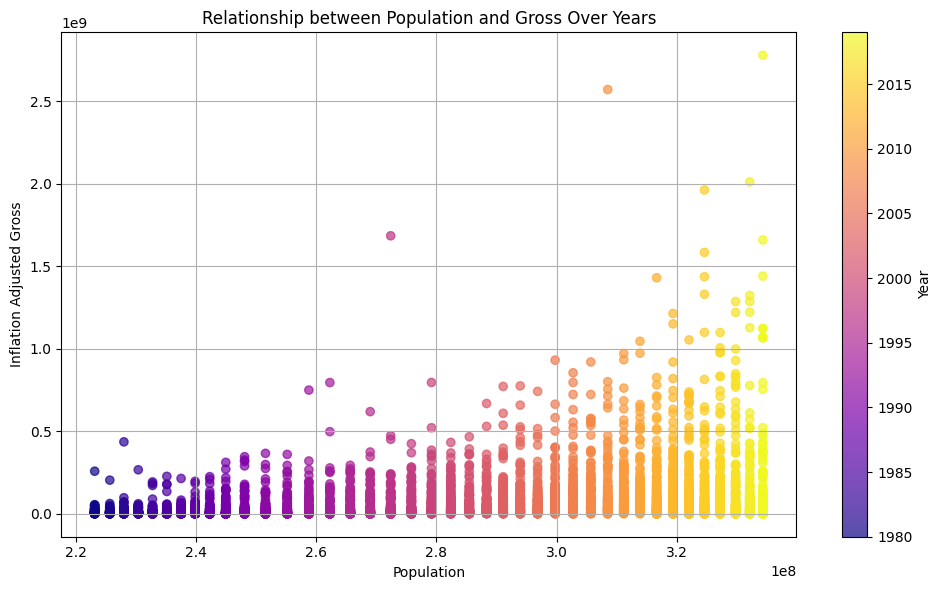

In [ ]:
# Scatter Plot Population and Movies Gross
years = merged_df['year']
population = merged_df['population']
gross = merged_df['adjusted_gross']

# Plotting the scatter plot
plt.figure(figsize=(10, 6))

plt.scatter(population, gross, c=years, cmap='plasma', alpha=0.7)
plt.title('Relationship between Population and Gross Over Years')
plt.xlabel('Population')
plt.ylabel('Inflation Adjusted Gross')
plt.colorbar(label='Year')
plt.grid(True)

# Display the plot
plt.tight_layout()
plt.show()

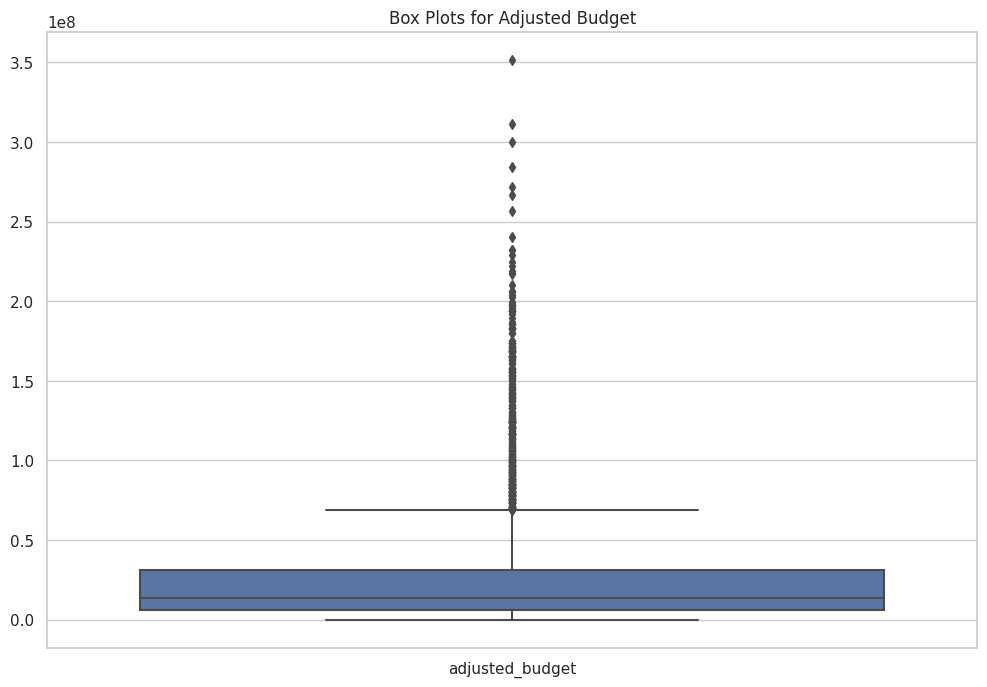

In [ ]:
# BOX PLOTS

# BUDGET
box_budget = ['adjusted_budget']

# Set the style of seaborn
sns.set(style="whitegrid")

# Create box plots
plt.figure(figsize=(12, 8))
sns.boxplot(data=merged_df[box_budget])
plt.title('Box Plots for Adjusted Budget')
plt.show()

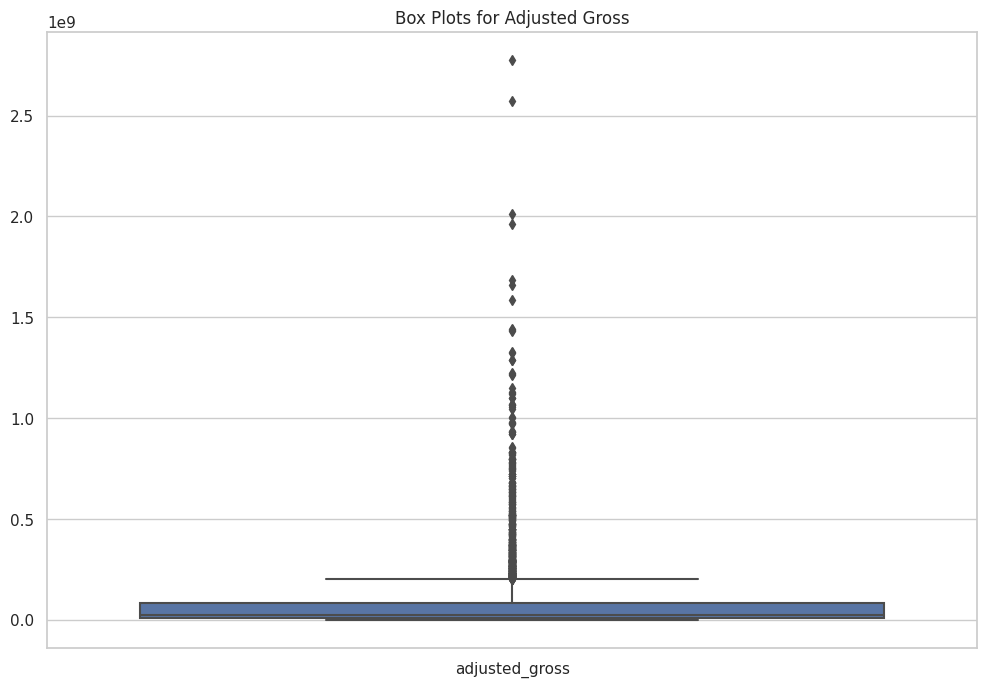

In [ ]:
# BUDGET
box_gross = ['adjusted_gross']

# Set the style of seaborn
sns.set(style="whitegrid")

# Create box plots
plt.figure(figsize=(12, 8))
sns.boxplot(data=merged_df[box_gross])
plt.title('Box Plots for Adjusted Gross')
plt.show()

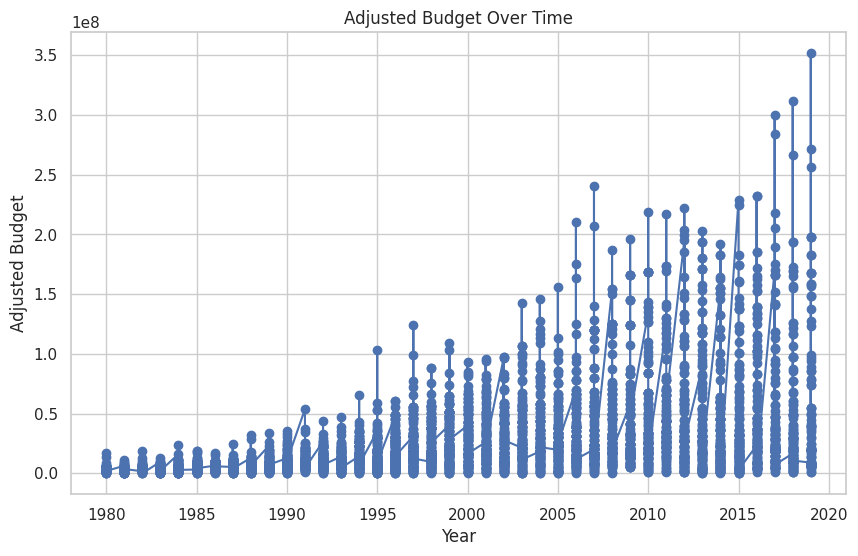

In [ ]:
# Plotting adjusted budget over time
plt.figure(figsize=(10, 6))
plt.plot(merged_df['year'], merged_df['adjusted_budget'], marker='o', linestyle='-')
plt.title('Adjusted Budget Over Time')
plt.xlabel('Year')
plt.ylabel('Adjusted Budget')
plt.grid(True)
plt.show()

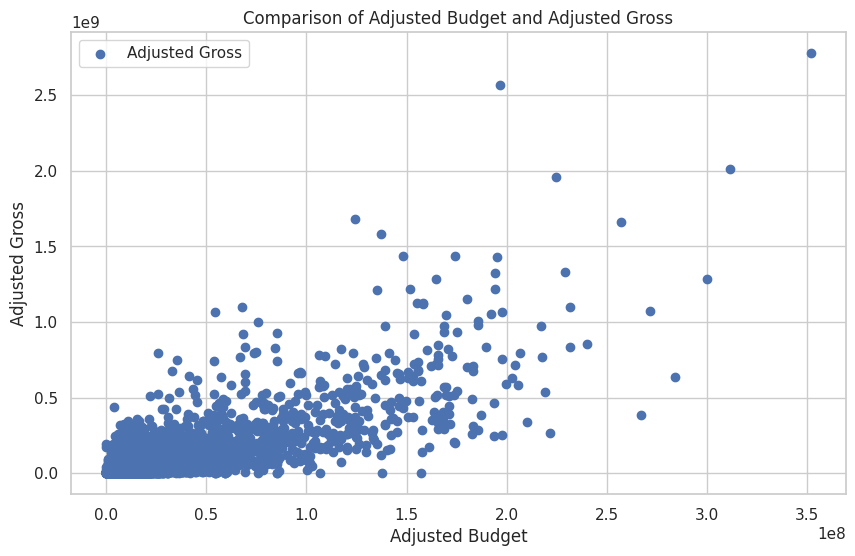

In [ ]:
# Scatter plot to compare adjusted budget against adjusted gross
plt.figure(figsize=(10, 6))
plt.scatter(merged_df['adjusted_budget'], merged_df['adjusted_gross'], marker='o', label='Adjusted Gross')

plt.title('Comparison of Adjusted Budget and Adjusted Gross')
plt.xlabel('Adjusted Budget')
plt.ylabel('Adjusted Gross')
plt.legend()
plt.grid(True)
plt.show()

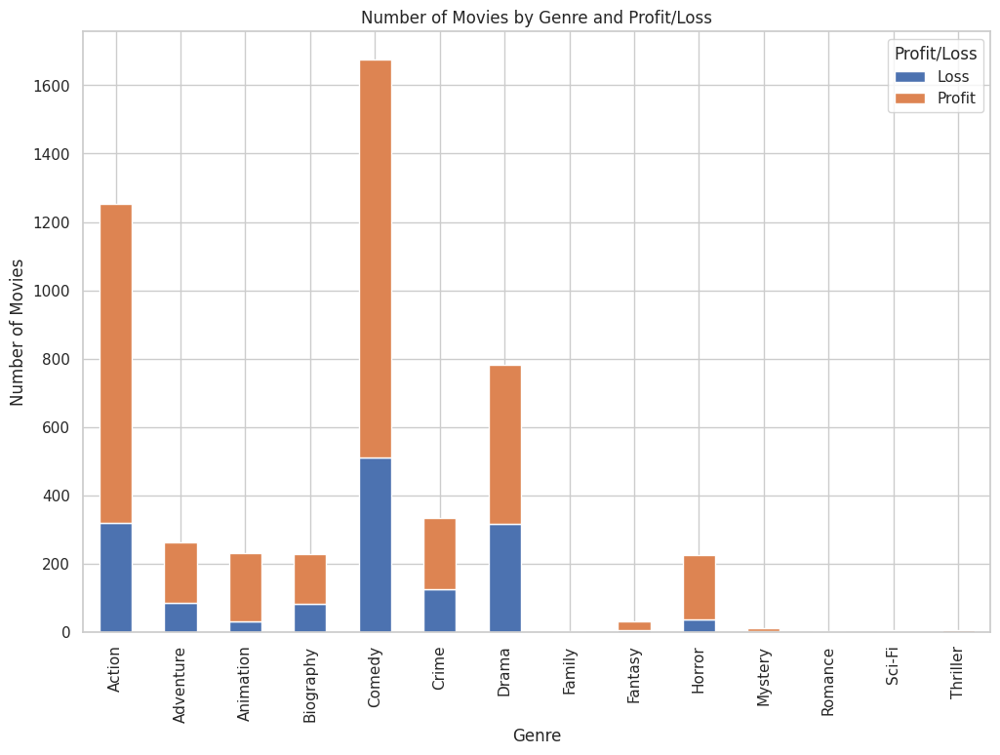

In [ ]:
# Group by 'genre' and 'profit_loss', then count the number of movies in each group
genre_profit_loss_counts = merged_df.groupby(['genre', 'profit_loss']).size().unstack(fill_value=0)

# Plot a stacked bar chart
ax = genre_profit_loss_counts.plot(kind='bar', stacked=True, figsize=(12, 8))
ax.set_title('Number of Movies by Genre and Profit/Loss')
ax.set_xlabel('Genre')
ax.set_ylabel('Number of Movies')
plt.legend(title='Profit/Loss', loc='upper right')
plt.show()

**Interpretation:**

* Based on visual representation, Animation and Horror category have a highest ratio of profit against loss.
* Maximum movies are made in the genres of comedy, action and drama
* The data set is biased towards some genres of movie due to people's choice and genre popularity

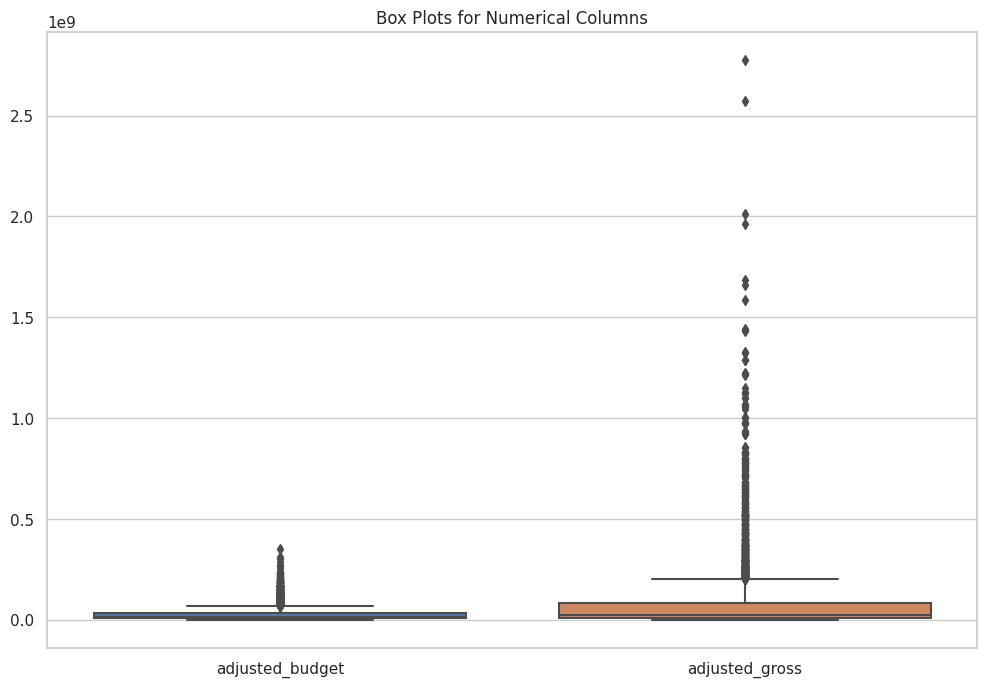

In [ ]:
# Select numerical columns for box plots
numerical_columns = ['adjusted_budget','adjusted_gross']

# Set the style of seaborn
sns.set(style="whitegrid")

# Create box plots
plt.figure(figsize=(12, 8))
sns.boxplot(data=merged_df[numerical_columns])
plt.title('Box Plots for Numerical Columns')
plt.show()

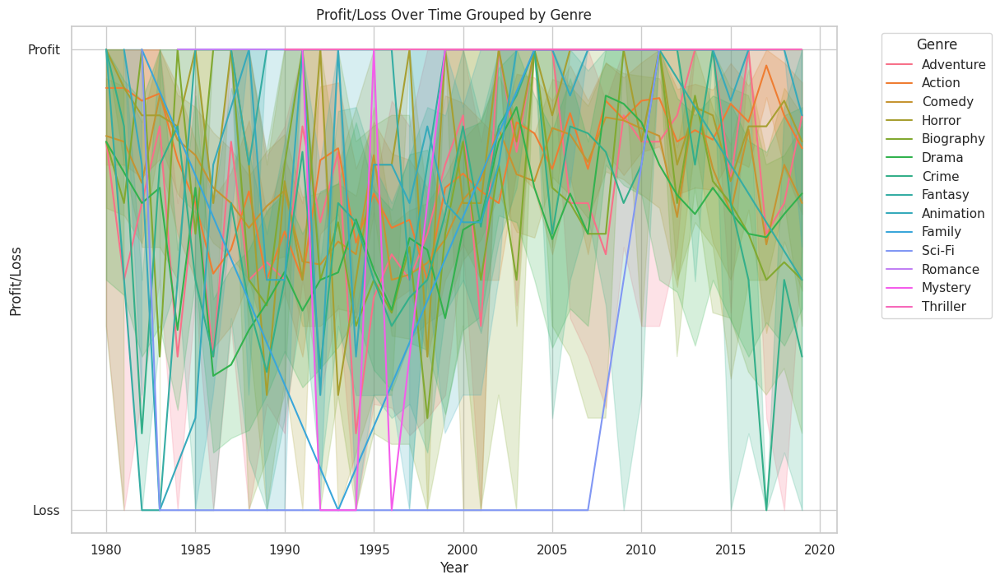

In [ ]:
#Plot profit_loss column grouped by genre over time
# Set the style of seaborn
sns.set(style="whitegrid")

# Create a line plot
plt.figure(figsize=(12, 8))
sns.lineplot(x='year', y='profit_loss', hue='genre', data=merged_df)
plt.title('Profit/Loss Over Time Grouped by Genre')
plt.xlabel('Year')
plt.ylabel('Profit/Loss')
plt.legend(title='Genre', bbox_to_anchor=(1.05, 1), loc='upper left')  # Place legend outside the plot
plt.show()

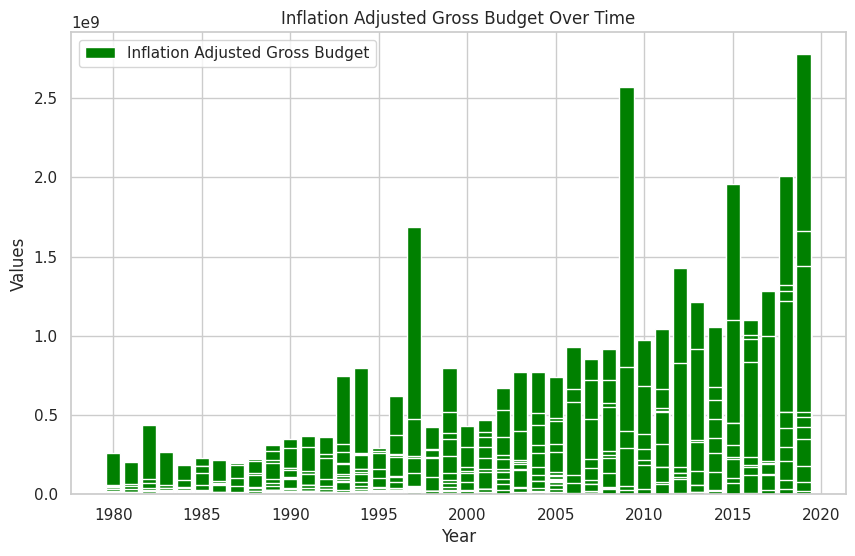

In [ ]:
plt.figure(figsize=(10, 6))

# Bar plot for Gross
plt.bar(merged_df['year'], merged_df['adjusted_gross'], label='Inflation Adjusted Gross Budget', color='green')

plt.xlabel('Year')
plt.ylabel('Values')
plt.title('Inflation Adjusted Gross Budget Over Time')

# Add legend
plt.legend()

plt.grid(True)
plt.show()

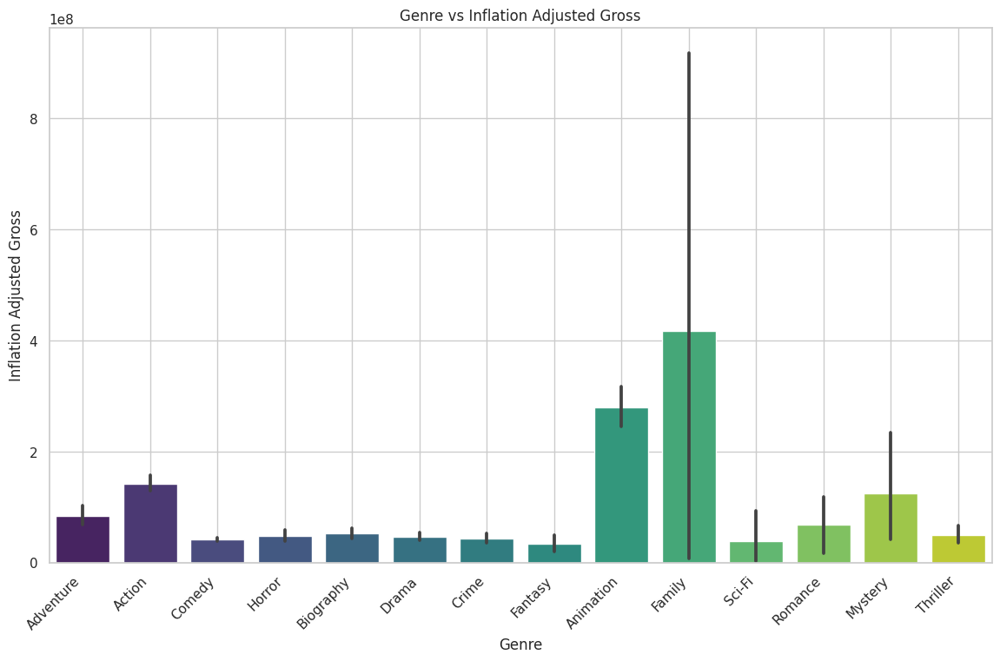

In [ ]:
plt.figure(figsize=(14, 8))

# Bar plot for Genre vs Inflation Adjusted Gross
sns.barplot(x='genre', y='adjusted_gross', data=merged_df, palette='viridis')

plt.xlabel('Genre')
plt.ylabel('Inflation Adjusted Gross')
plt.title('Genre vs Inflation Adjusted Gross')

# Rotate x-axis labels
plt.xticks(rotation=45, ha='right')

plt.grid(True)
plt.show()

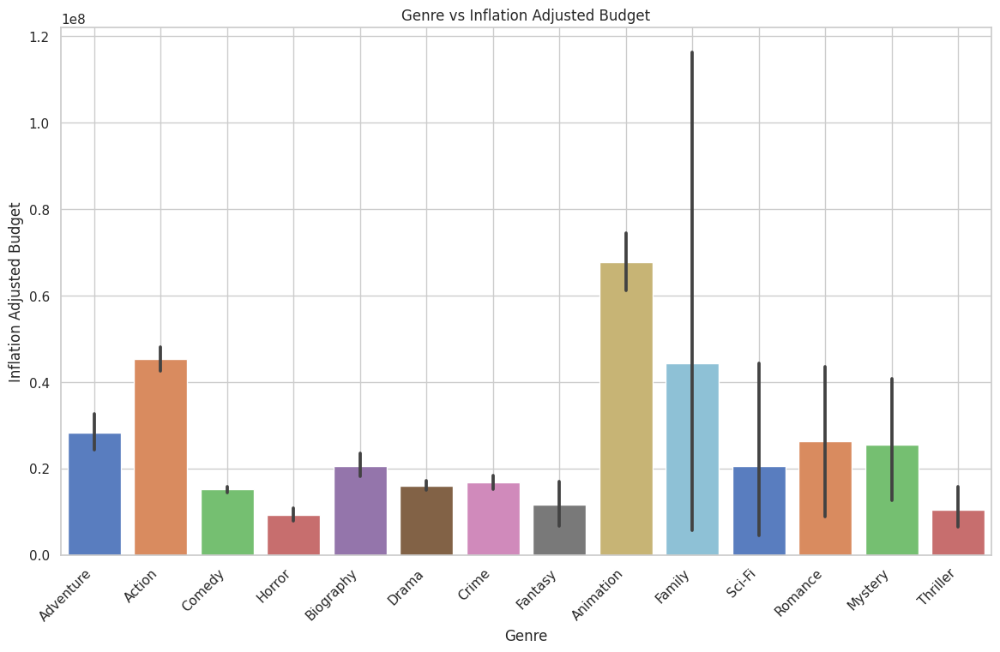

In [ ]:
plt.figure(figsize=(14, 8))

# Bar plot for Genre vs Inflation Adjusted Budget
sns.barplot(x='genre', y='adjusted_budget', data=merged_df, palette='muted')

plt.xlabel('Genre')
plt.ylabel('Inflation Adjusted Budget')
plt.title('Genre vs Inflation Adjusted Budget')

# Rotate x-axis labels
plt.xticks(rotation=45, ha='right')

plt.grid(True)
plt.show()

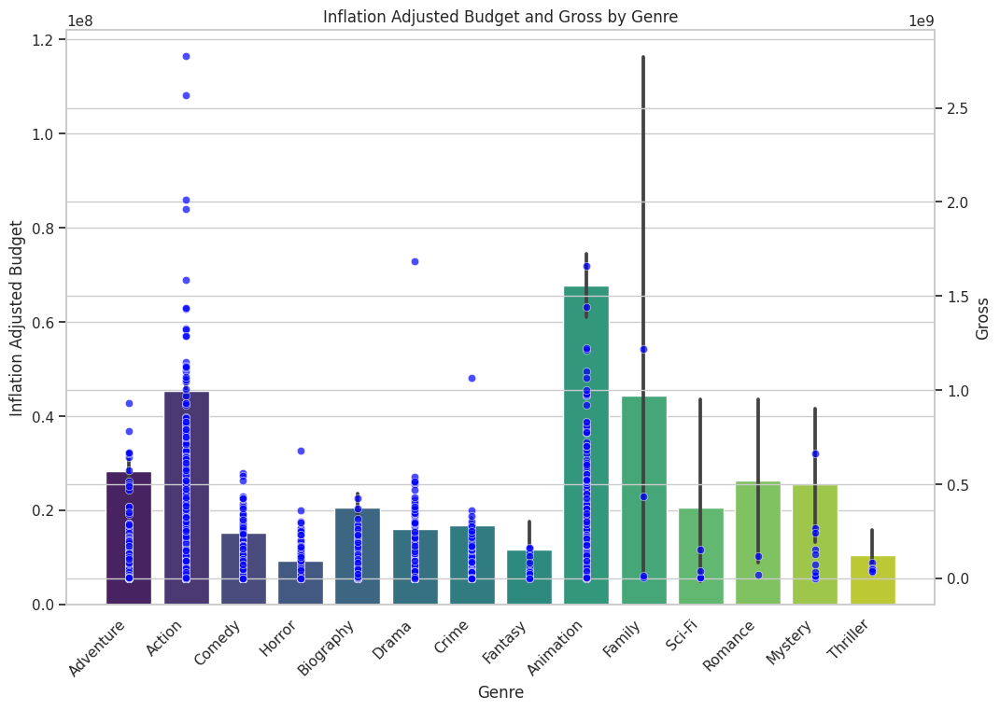

In [ ]:
#converting datatypr from float to int
#dataframe['gross'] = dataframe['gross'].round().astype('int64')


sns.set(style="whitegrid")
fig, ax1 = plt.subplots(figsize=(12, 8))

# Bar plot for Inflation Adjusted Budget by Genre
sns.barplot(x='genre', y='adjusted_budget', data=merged_df, ax=ax1, palette='viridis')
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=45, ha='right')
ax1.set_xlabel('Genre')
ax1.set_ylabel('Inflation Adjusted Budget')
ax1.set_title('Inflation Adjusted Budget and Gross by Genre')

# Create a twin axis sharing the x-axis
ax2 = ax1.twinx()

# Scatter plot for Gross by Inflation Adjusted Genre
sns.scatterplot(x='genre', y='adjusted_gross', data=merged_df, ax=ax2, alpha=0.7, color='blue')
ax2.set_ylabel('Gross')

plt.show()

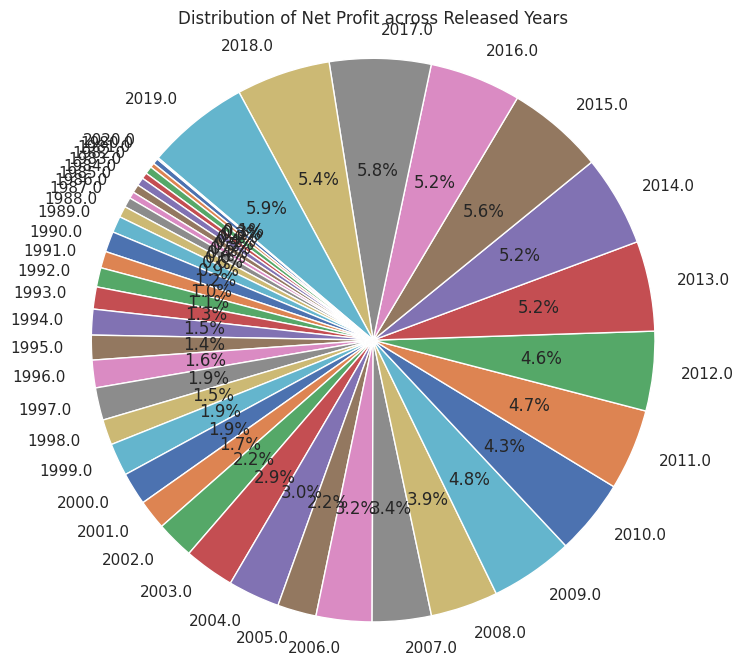

In [ ]:
# total net profit for each year
total_net_profit_per_year = merged_df.groupby('released_year')['net_profit'].sum()

#  pie chart
plt.figure(figsize=(8, 8))
plt.pie(total_net_profit_per_year, labels=total_net_profit_per_year.index, autopct='%1.1f%%', startangle=140)

plt.axis('equal')
plt.title('Distribution of Net Profit across Released Years')
plt.show()

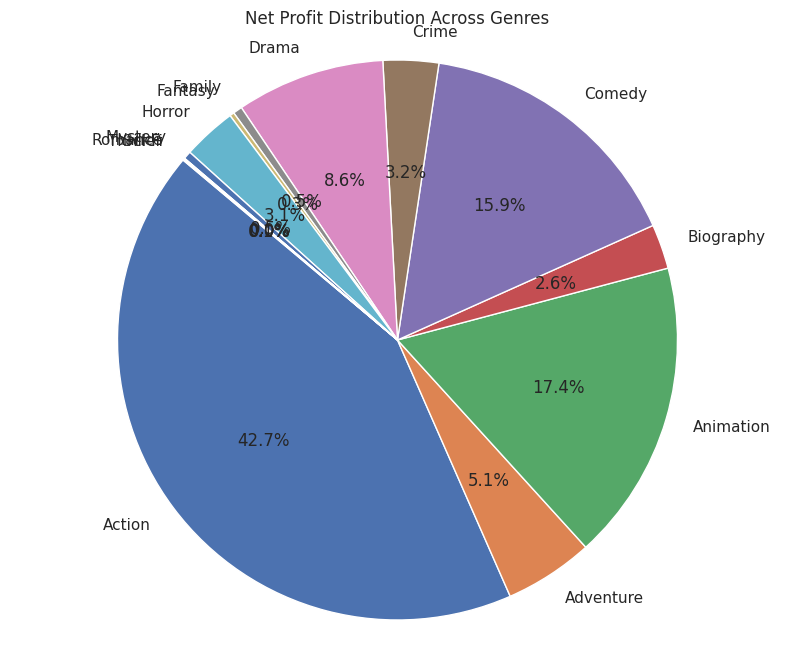

In [ ]:
plt.figure(figsize=(10, 8))

# Grouping by genre and calculating the sum of net_profit for each genre
grouped_data = merged_df.groupby('genre')['net_profit'].sum().reset_index()

# Plotting a pie chart
plt.pie(grouped_data['net_profit'], labels=grouped_data['genre'], autopct='%1.1f%%', startangle=140)

plt.axis('equal')
plt.title('Net Profit Distribution Across Genres')
plt.show()

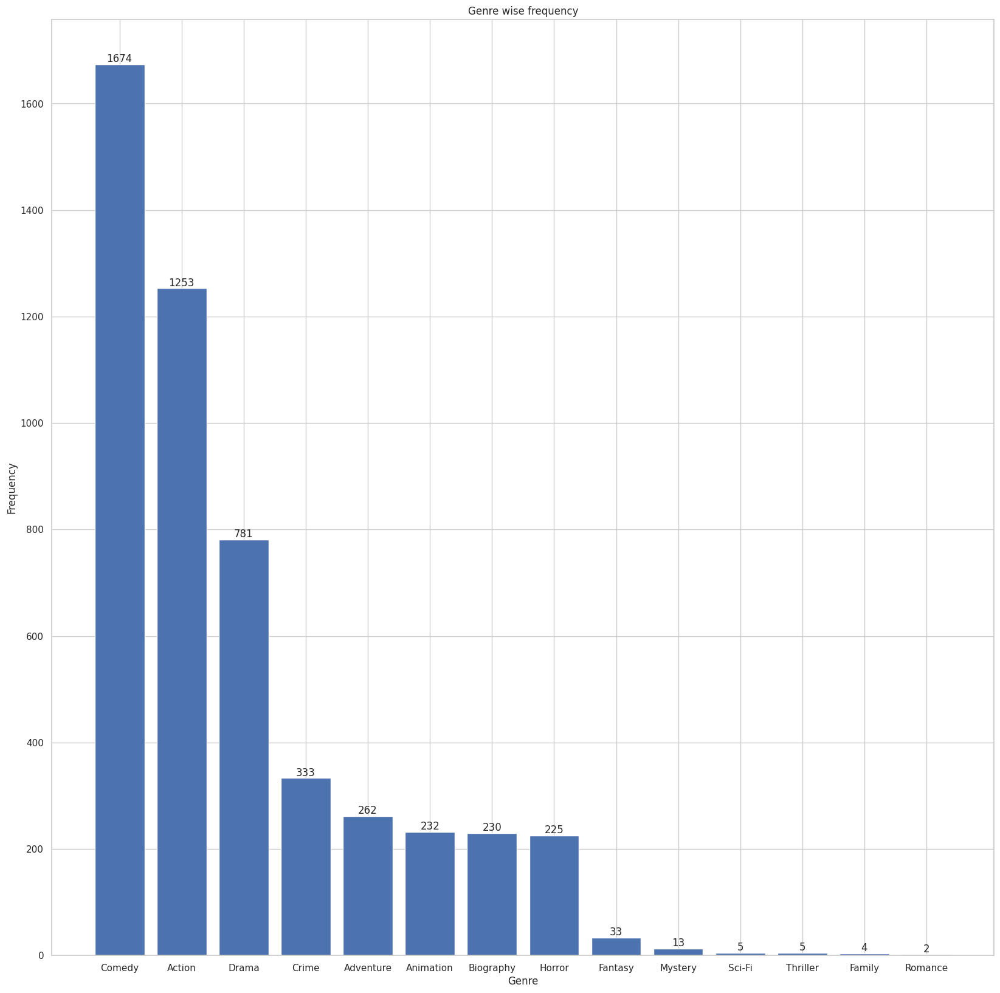

In [ ]:
# Plotting genre freq distribution
genre_counts = merged_df['genre'].value_counts()

plt.figure(figsize=(20, 20))
bars = plt.bar(genre_counts.index, genre_counts.values)

plt.title("Genre wise frequency")
plt.xlabel("Genre")
plt.ylabel("Frequency")

# Display frequency values on top of each bar
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, yval, round(yval, 2), ha='center', va='bottom')

plt.show()

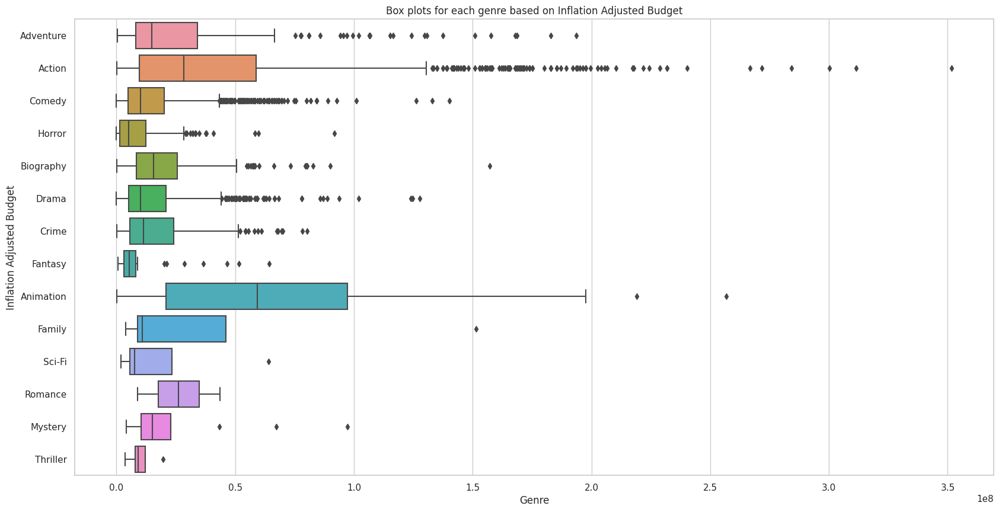

In [ ]:
# Box Plots for inflation adjusted budget for each genre
plt.figure(figsize=(20, 10))

# Using seaborn for better aesthetics (optional)
sns.boxplot(y='genre', x='adjusted_budget', data=merged_df)

plt.title("Box plots for each genre based on Inflation Adjusted Budget")
plt.xlabel("Genre")
plt.ylabel("Inflation Adjusted Budget")
plt.show()

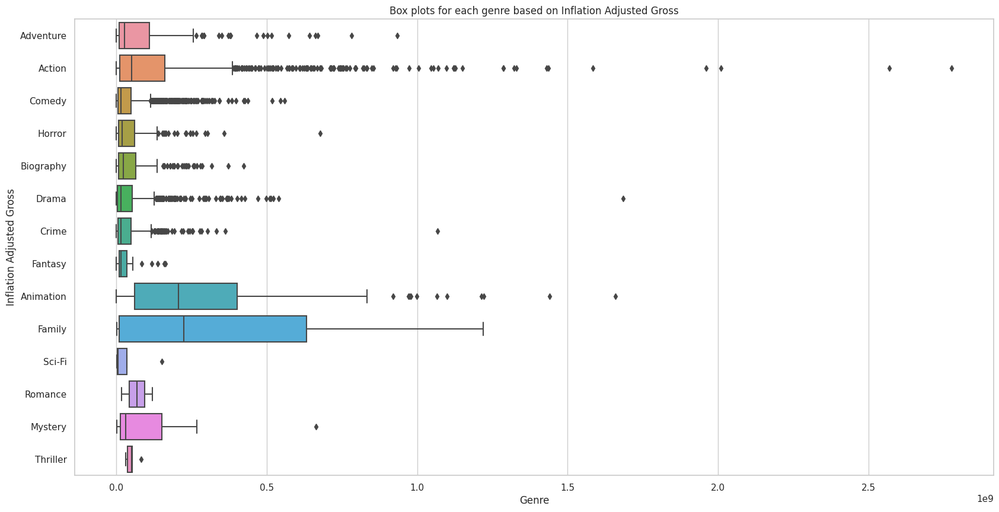

In [ ]:
# Box Plots for inflation adjusted gross for each genre
plt.figure(figsize=(20, 10))

# Using seaborn for better aesthetics (optional)
sns.boxplot(y='genre', x='adjusted_gross', data=merged_df)

plt.title("Box plots for each genre based on Inflation Adjusted Gross")
plt.xlabel("Genre")
plt.ylabel("Inflation Adjusted Gross")
plt.show()

In [ ]:
merged_df.columns

Index(['name', 'rating', 'genre', 'year', 'score', 'votes', 'director',
       'writer', 'star', 'company', 'runtime', 'released_date',
       'released_day_of_week', 'released_week_number', 'released_month',
       'released_year', 'season', 'population', 'adjusted_budget',
       'adjusted_gross', 'net_profit', 'roi_in_%', 'fate', 'runtime_Category',
       'score_bucket', 'profit_loss'],
      dtype='object')

In [ ]:
# Group by 'company' and count occurrences of 'name'
company_counts = merged_df.groupby('company')['name'].count()

# Sort the counts in descending order and get the top 10
top_10_companies = company_counts.sort_values(ascending=False).head(10)

top_10_companies

company
Universal Pictures           317
Columbia Pictures            296
Warner Bros.                 283
Paramount Pictures           277
Twentieth Century Fox        218
New Line Cinema              144
Touchstone Pictures          121
Walt Disney Pictures         114
Metro-Goldwyn-Mayer (MGM)    102
TriStar Pictures              84
Name: name, dtype: int64

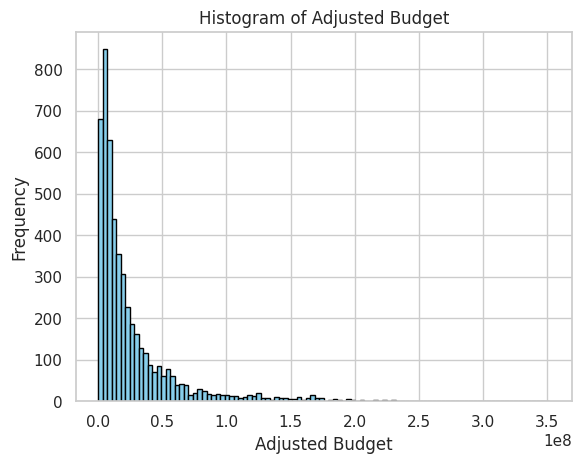

In [ ]:
plt.hist(merged_df['adjusted_budget'], bins=100, color='skyblue', edgecolor='black')
plt.xlabel('Adjusted Budget')
plt.ylabel('Frequency')
plt.title('Histogram of Adjusted Budget')
plt.show()

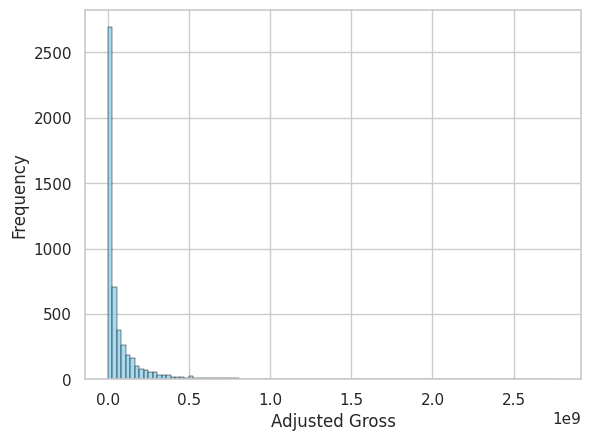

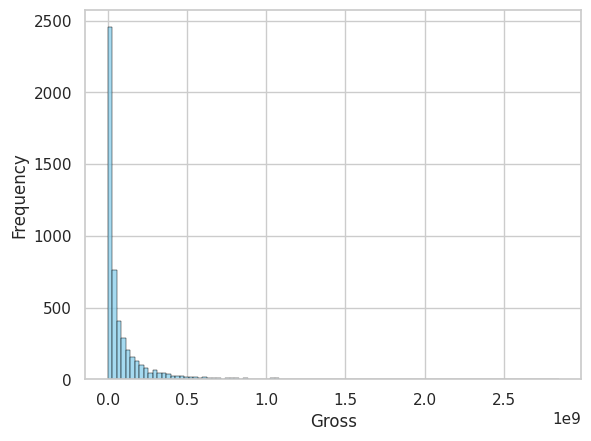

In [ ]:
# Display the adjusted_gross column as a histogram
sns.histplot(x='adjusted_gross', data=merged_df, color='skyblue', edgecolor='black', bins=100)
plt.xlabel('Adjusted Gross')
plt.ylabel('Frequency')
plt.show()

# Display the gross column as a histogram
sns.histplot(x='gross', data=dataset, color='skyblue', edgecolor='black', bins=100)
plt.xlabel('Gross')
plt.ylabel('Frequency')
plt.show()

### Creation of a Single Dataframe for per company per year record

In [ ]:
# Define a custom aggregation function to extract information of the top movie by adjusted gross and adjusted budget
def get_top_movie_info(group, column):
    if group.empty:
        return pd.Series({
            f'top_movie_{column}': None,
            f'top_director_{column}': None,
            f'top_writer_{column}': None,
            f'top_star_{column}': None
        })
    else:
        top_movie_idx = group[column].idxmax()
        top_movie = group.loc[top_movie_idx]
        return pd.Series({
            f'top_movie_{column}': top_movie['name'],
            f'top_director_{column}': top_movie['director'],
            f'top_writer_{column}': top_movie['writer'],
            f'top_star_{column}': top_movie['star']
        })

# Group merged_df by company and year to get count of movies, average scores, etc.
company_year_summary = merged_df.groupby(['company', 'year']).agg(
    count_of_movies=('name', 'count'),
    avg_score=('score', 'mean'),
    min_score=('score', 'min'),
    max_score=('score', 'max'),
    avg_votes=('votes', 'mean'),
    min_votes=('votes', 'min'),
    max_votes=('votes', 'max'),
    avg_runtime=('runtime', 'mean'),
    min_runtime=('runtime', 'min'),
    max_runtime=('runtime', 'max'),
    avg_adjusted_budget=('adjusted_budget', 'mean'),
    total_adjusted_budget=('adjusted_budget', 'sum'),
    avg_adjusted_gross=('adjusted_gross', 'mean'),
    total_adjusted_gross=('adjusted_gross', 'sum'),
    avg_net_profit=('net_profit', 'mean'),
    total_net_profit=('net_profit', 'sum'),
    total_roi_pct=('roi_in_%', 'sum'),
    freq_season_spring=('season', lambda x: (x == 'Spring').sum()),
    freq_season_summer=('season', lambda x: (x == 'Summer').sum()),
    freq_season_fall=('season', lambda x: (x == 'Fall').sum()),
    freq_season_winter=('season', lambda x: (x == 'Winter').sum()),
    freq_month_Jan=('released_month', lambda x: (x == 'January').sum()),
    freq_month_Feb=('released_month', lambda x: (x == 'February').sum()),
    freq_month_Mar=('released_month', lambda x: (x == 'March').sum()),
    freq_month_Apr=('released_month', lambda x: (x == 'April').sum()),
    freq_month_May=('released_month', lambda x: (x == 'May').sum()),
    freq_month_Jun=('released_month', lambda x: (x == 'June').sum()),
    freq_month_Jul=('released_month', lambda x: (x == 'July').sum()),
    freq_month_Aug=('released_month', lambda x: (x == 'August').sum()),
    freq_month_Sep=('released_month', lambda x: (x == 'September').sum()),
    freq_month_Oct=('released_month', lambda x: (x == 'October').sum()),
    freq_month_Nov=('released_month', lambda x: (x == 'November').sum()),
    freq_month_Dec=('released_month', lambda x: (x == 'December').sum()),
    freq_day_Mon=('released_day_of_week', lambda x: (x == 'Monday').sum()),
    freq_day_Tue=('released_day_of_week', lambda x: (x == 'Tuesday').sum()),
    freq_day_Wed=('released_day_of_week', lambda x: (x == 'Wednesday').sum()),
    freq_day_Thu=('released_day_of_week', lambda x: (x == 'Thursday').sum()),
    freq_day_Fri=('released_day_of_week', lambda x: (x == 'Friday').sum()),
    freq_day_Sat=('released_day_of_week', lambda x: (x == 'Saturday').sum()),
    freq_day_Sun=('released_day_of_week', lambda x: (x == 'Sunday').sum()),
    freq_genre_Adventure=('genre', lambda x: (x == 'Adventure').sum()),
    freq_genre_Action=('genre', lambda x: (x == 'Action').sum()),
    freq_genre_Comedy=('genre', lambda x: (x == 'Comedy').sum()),
    freq_genre_Horror=('genre', lambda x: (x == 'Horror').sum()),
    freq_genre_Biography=('genre', lambda x: (x == 'Biography').sum()),
    freq_genre_Drama=('genre', lambda x: (x == 'Drama').sum()),
    freq_genre_Crime=('genre', lambda x: (x == 'Crime').sum()),
    freq_genre_Fantasy=('genre', lambda x: (x == 'Fantasy').sum()),
    freq_genre_Animation=('genre', lambda x: (x == 'Animation').sum()),
    freq_genre_Sci_Fi=('genre', lambda x: (x == 'Sci-Fi').sum()),
    freq_genre_Romance=('genre', lambda x: (x == 'Romance').sum()),
    freq_genre_Thriller=('genre', lambda x: (x == 'Thriller').sum()),
    freq_genre_Mystery=('genre', lambda x: (x == 'Mystery').sum()),
    freq_fate_Blockbuster=('fate', lambda x: (x == 'Blockbuster').sum()),
    freq_fate_Superhit=('fate', lambda x: (x == 'Superhit').sum()),
    freq_fate_Hit=('fate', lambda x: (x == 'Hit').sum()),
    freq_fate_Flop=('fate', lambda x: (x == 'Flop').sum()),
    freq_fate_Bomb=('fate', lambda x: (x == 'Bomb').sum()),
    freq_sc_bucket_Low=('score_bucket', lambda x: (x == 'Low (0-4)').sum()),
    freq_sc_bucket_Medium=('score_bucket', lambda x: (x == 'Medium (4-7)').sum()),
    freq_sc_bucket_High=('score_bucket', lambda x: (x == 'High (7-10)').sum()),
    freq_profit_loss_Profit=('profit_loss', lambda x: (x == 'Profit').sum()),
    freq_profit_loss_Loss=('profit_loss', lambda x: (x == 'Loss').sum()),
    freq_profit_loss_Unknown=('profit_loss', lambda x: (x == 'Unknown').sum()),
    top_movie_gross=('adjusted_gross', lambda x: x.nlargest(1)),
    top_movie_budget=('adjusted_budget', lambda x: x.nlargest(1)),
    top_movie_profit=('net_profit', lambda x: x.nlargest(1))
).reset_index()

# Add information of the top movie for each group by adjusted gross to the company_year_summary DataFrame
top_movie_info_by_gross = merged_df.groupby(['company', 'year']).apply(get_top_movie_info, column='adjusted_gross').reset_index()

# Add information of the top movie for each group by adjusted budget to the company_year_summary DataFrame
top_movie_info_by_budget = merged_df.groupby(['company', 'year']).apply(get_top_movie_info, column='adjusted_budget').reset_index()

# Add information of the top movie for each group by net profit to the company_year_summary DataFrame
top_movie_info_by_profit = merged_df.groupby(['company', 'year']).apply(get_top_movie_info, column='net_profit').reset_index()

# Merge the top_movie_info DataFrames with company_year_summary on the 'company' and 'year' columns
company_year_summary = pd.merge(company_year_summary, top_movie_info_by_gross, on=['company', 'year'], how='left')
company_year_summary = pd.merge(company_year_summary, top_movie_info_by_budget, on=['company', 'year'], how='left')
company_year_summary = pd.merge(company_year_summary, top_movie_info_by_profit, on=['company', 'year'], how='left')

# Display the resulting DataFrame
company_year_summary

,company,year,count_of_movies,avg_score,min_score,max_score,avg_votes,min_votes,max_votes,avg_runtime,min_runtime,max_runtime,avg_adjusted_budget,total_adjusted_budget,avg_adjusted_gross,total_adjusted_gross,avg_net_profit,total_net_profit,total_roi_pct,freq_season_spring,freq_season_summer,freq_season_fall,freq_season_winter,freq_month_Jan,freq_month_Feb,freq_month_Mar,freq_month_Apr,freq_month_May,freq_month_Jun,freq_month_Jul,freq_month_Aug,freq_month_Sep,freq_month_Oct,freq_month_Nov,freq_month_Dec,freq_day_Mon,freq_day_Tue,freq_day_Wed,freq_day_Thu,freq_day_Fri,freq_day_Sat,freq_day_Sun,freq_genre_Adventure,freq_genre_Action,freq_genre_Comedy,freq_genre_Horror,freq_genre_Biography,freq_genre_Drama,freq_genre_Crime,freq_genre_Fantasy,freq_genre_Animation,freq_genre_Sci_Fi,freq_genre_Romance,freq_genre_Thriller,freq_genre_Mystery,freq_fate_Blockbuster,freq_fate_Superhit,freq_fate_Hit,freq_fate_Flop,freq_fate_Bomb,freq_sc_bucket_Low,freq_sc_bucket_Medium,freq_sc_bucket_High,freq_profit_loss_Profit,freq_profit_loss_Loss,freq_profit_loss_Unknown,top_movie_gross,top_movie_budget,top_movie_profit,top_movie_adjusted_gross,top_director_adjusted_gross,top_writer_adjusted_gross,top_star_adjusted_gross,top_movie_adjusted_budget,top_director_adjusted_budget,top_writer_adjusted_budget,top_star_adjusted_budget,top_movie_net_profit,top_director_net_profit,top_writer_net_profit,top_star_net_profit
0,"""DIA"" Productions GmbH & Co. KG",2003,1,6.1,6.1,6.1,46000.0,46000.0,46000.0,109.0,109.0,109.0,2.559505e+07,2.559505e+07,3.638846e+07,3.638846e+07,1.079341e+07,1.079341e+07,42.169895,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,3.638846e+07,2.559505e+07,1.079341e+07,A Man Apart,F. Gary Gray,Christian Gudegast,Vin Diesel,A Man Apart,F. Gary Gray,Christian Gudegast,Vin Diesel,A Man Apart,F. Gary Gray,Christian Gudegast,Vin Diesel
1,.406 Production,1996,1,6.8,6.8,6.8,5300.0,5300.0,5300.0,96.0,96.0,96.0,1.515649e+05,1.515649e+05,8.010906e+03,8.010906e+03,-1.435540e+05,-1.435540e+05,-94.714538,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,1,0,8.010906e+03,1.515649e+05,-1.435540e+05,Schizopolis,Steven Soderbergh,Steven Soderbergh,Steven Soderbergh,Schizopolis,Steven Soderbergh,Steven Soderbergh,Steven Soderbergh,Schizopolis,Steven Soderbergh,Steven Soderbergh,Steven Soderbergh
2,1492 Pictures,1996,1,5.6,5.6,5.6,95000.0,95000.0,95000.0,89.0,89.0,89.0,3.637558e+07,3.637558e+07,9.830577e+07,9.830577e+07,6.193019e+07,6.193019e+07,170.252112,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,9.830577e+07,3.637558e+07,6.193019e+07,Jingle All the Way,Brian Levant,Randy Kornfield,Arnold Schwarzenegger,Jingle All the Way,Brian Levant,Randy Kornfield,Arnold Schwarzenegger,Jingle All the Way,Brian Levant,Randy Kornfield,Arnold Schwarzenegger
3,1492 Pictures,1999,1,6.9,6.9,6.9,112000.0,112000.0,112000.0,132.0,132.0,132.0,6.437403e+07,6.437403e+07,6.772020e+07,6.772020e+07,3.346169e+06,3.346169e+06,5.198011,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,6.772020e+07,6.437403e+07,3.346169e+06,Bicentennial Man,Chris Columbus,Isaac Asimov,Robin Williams,Bicentennial Man,Chris Columbus,Isaac Asimov,Robin Williams,Bicentennial Man,Chris Columbus,Isaac Asimov,Robin Williams
4,1818 Productions,1983,1,6.3,6.3,6.3,11000.0,11000.0,11000.0,107.0,107.0,107.0,1.924266e+06,1.924266e+06,6.864606e+06,6.864606e+06,4.940340e+06,4.940340e+06,256.738938,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,6.864606e+06,1.924266e+06,4.940340e+06,Lone Wolf McQuade,Steve Carver,B.J. Nelson,Chuck Norris,Lone Wolf McQuade,Steve Carver,B.J. Nelson,Chuck Norris,Lone Wolf McQuade,Steve Carver,B.J. Nelson,Chuck Norris
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,..

### Creation of a Company-wise dashboard

In [ ]:
def create_dashboard(company_year_summary, company_name):
    company_data = company_year_summary[company_year_summary['company'] == company_name]

    # Create a grid of plots
    fig, axes = plt.subplots(7, 3, figsize=(18, 45))

    # Year on Year count of movies
    axes[0, 0].plot(company_data['year'], company_data['count_of_movies'], marker='o')
    axes[0, 0].set_title(f'Year on Year Count of Movies')
    axes[0, 0].set_xlabel('Year')
    axes[0, 0].set_ylabel('Count of Movies')
    axes[0, 0].grid(True)

    # Movement of average score
    axes[0, 1].plot(company_data['year'], company_data['avg_score'], marker='o', color='orange')
    axes[0, 1].set_title(f'Movement of Average Score')
    axes[0, 1].set_xlabel('Year')
    axes[0, 1].set_ylabel('Average Score')
    axes[0, 1].grid(True)

    # Movement of average votes
    axes[0, 2].plot(company_data['year'], company_data['avg_votes'], marker='o', color='green')
    axes[0, 2].set_title(f'Movement of Average Votes')
    axes[0, 2].set_xlabel('Year')
    axes[0, 2].set_ylabel('Average Votes')
    axes[0, 2].grid(True)

    # Movement of average runtime
    axes[1, 0].plot(company_data['year'], company_data['avg_runtime'], marker='o', color='red')
    axes[1, 0].set_title(f'Movement of Average Runtime')
    axes[1, 0].set_xlabel('Year')
    axes[1, 0].set_ylabel('Average Runtime')
    axes[1, 0].grid(True)

    # Year on Year total adjusted budget vs average adjusted budget
    axes[1, 1].plot(company_data['year'], company_data['total_adjusted_budget'], marker='o', label='Total Adjusted Budget')
    axes[1, 1].plot(company_data['year'], company_data['avg_adjusted_budget'], marker='o', color='orange', label='Average Adjusted Budget')
    axes[1, 1].set_title(f'Year on Year Total vs Average Adjusted Budget')
    axes[1, 1].set_xlabel('Year')
    axes[1, 1].set_ylabel('Adjusted Budget')
    axes[1, 1].legend()
    axes[1, 1].grid(True)

    # Year on Year total adjusted gross vs average adjusted gross
    axes[1, 2].plot(company_data['year'], company_data['total_adjusted_gross'], marker='o', label='Total Adjusted Gross')
    axes[1, 2].plot(company_data['year'], company_data['avg_adjusted_gross'], marker='o', color='orange', label='Average Adjusted Gross')
    axes[1, 2].set_title(f'Year on Year Total vs Average Adjusted Gross')
    axes[1, 2].set_xlabel('Year')
    axes[1, 2].set_ylabel('Adjusted Gross')
    axes[1, 2].legend()
    axes[1, 2].grid(True)

    # Year on Year total net profit vs average net profit
    axes[2, 0].plot(company_data['year'], company_data['total_net_profit'], marker='o', label='Total Net Profit')
    axes[2, 0].plot(company_data['year'], company_data['avg_net_profit'], marker='o', color='orange', label='Average Net Profit')
    axes[2, 0].set_title(f'Year on Year Total vs Average Net Profit')
    axes[2, 0].set_xlabel('Year')
    axes[2, 0].set_ylabel('Net Profit')
    axes[2, 0].legend()
    axes[2, 0].grid(True)

    # Year on Year ROI in %
    axes[2, 1].plot(company_data['year'], company_data['total_roi_pct'], marker='o')
    axes[2, 1].set_title(f'Year on Year ROI in %')
    axes[2, 1].set_xlabel('Year')
    axes[2, 1].set_ylabel('ROI (%)')
    axes[2, 1].grid(True)

    # Frequency of seasons
    season_cols = ['freq_season_spring', 'freq_season_summer', 'freq_season_fall', 'freq_season_winter']
    season_counts = company_data[season_cols].sum()
    axes[2, 2].bar(['Spring', 'Summer', 'Fall', 'Winter'], season_counts.values)
    axes[2, 2].set_title(f'Frequency of Seasons')
    axes[2, 2].set_xlabel('Season')
    axes[2, 2].set_ylabel('Frequency')
    axes[2, 2].grid(True)

    # Frequency of months
    month_cols = ['freq_month_Jan', 'freq_month_Feb', 'freq_month_Mar', 'freq_month_Apr', 'freq_month_May', 'freq_month_Jun', 'freq_month_Jul', 'freq_month_Aug', 'freq_month_Sep', 'freq_month_Oct', 'freq_month_Nov', 'freq_month_Dec']
    month_labels = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
    month_counts = company_data[month_cols].sum()
    axes[3, 0].bar(month_labels, month_counts.values)
    axes[3, 0].set_title(f'Frequency of Months')
    axes[3, 0].set_xlabel('Month')
    axes[3, 0].set_ylabel('Frequency')
    axes[3, 0].grid(True)

    # Frequency of day
    day_cols = ['freq_day_Mon', 'freq_day_Tue', 'freq_day_Wed', 'freq_day_Thu', 'freq_day_Fri', 'freq_day_Sat', 'freq_day_Sun']
    day_labels = ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']
    day_counts = company_data[day_cols].sum()
    axes[3, 1].bar(day_labels, day_counts.values)
    axes[3, 1].set_title(f'Frequency of Day')
    axes[3, 1].set_xlabel('Day')
    axes[3, 1].set_ylabel('Frequency')
    axes[3, 1].grid(True)

    # Frequency of profit loss
    profit_loss_cols = ['freq_profit_loss_Profit', 'freq_profit_loss_Loss', 'freq_profit_loss_Unknown']
    profit_loss_labels = ['Profit', 'Loss', 'Unknown']
    profit_loss_counts = company_data[profit_loss_cols].sum()
    axes[3, 2].bar(profit_loss_labels, profit_loss_counts.values)
    axes[3, 2].set_title(f'Frequency of Profit Loss')
    axes[3, 2].set_xlabel('Profit Loss')
    axes[3, 2].set_ylabel('Frequency')
    axes[3, 2].grid(True)

    # Top 10 movies by adjusted budget
    top_10_budget = company_data.nlargest(10, 'top_movie_budget')
    axes[4, 0].barh(top_10_budget['top_movie_adjusted_budget'], top_10_budget['top_movie_budget'])
    axes[4, 0].set_title(f'Top 10 Movies by Adjusted Budget')
    axes[4, 0].set_xlabel('Adjusted Budget')
    axes[4, 0].set_ylabel('Movie')
    axes[4, 0].invert_yaxis()
    axes[4, 0].grid(True)

    # Top 10 movies by adjusted gross
    top_10_gross = company_data.nlargest(10, 'top_movie_gross')
    axes[4, 1].barh(top_10_gross['top_movie_adjusted_gross'], top_10_gross['top_movie_gross'])
    axes[4, 1].set_title(f'Top 10 Movies by Adjusted Gross')
    axes[4, 1].set_xlabel('Adjusted Gross')
    axes[4, 1].set_ylabel('Movie')
    axes[4, 1].invert_yaxis()
    axes[4, 1].grid(True)

    # Top 10 movies by net profit
    top_10_profit = company_data.nlargest(10, 'top_movie_profit')
    axes[4, 2].barh(top_10_profit['top_movie_net_profit'], top_10_profit['top_movie_profit'])
    axes[4, 2].set_title(f'Top 10 Movies by Net Profit')
    axes[4, 2].set_xlabel('Net Profit')
    axes[4, 2].set_ylabel('Movie')
    axes[4, 2].invert_yaxis()
    axes[4, 2].grid(True)

    # Top 10 directors by mean adjusted gross
    top_10_directors = company_data.groupby('top_director_adjusted_gross')['top_movie_gross'].mean().nlargest(10)
    axes[5, 0].barh(top_10_directors.index, top_10_directors.values)
    axes[5, 0].set_title('Top 10 Directors by Mean Adjusted Gross')
    axes[5, 0].set_xlabel('Mean Adjusted Gross')
    axes[5, 0].set_ylabel('Director')
    axes[5, 0].invert_yaxis()
    axes[5, 0].grid(True)

    # Top 10 writers by mean adjusted gross
    top_10_writers = company_data.groupby('top_writer_adjusted_gross')['top_movie_gross'].mean().nlargest(10)
    axes[5, 1].barh(top_10_writers.index, top_10_writers.values)
    axes[5, 1].set_title(f'Top 10 Writers by Mean Adjusted Gross')
    axes[5, 1].set_xlabel('Mean Adjusted Gross')
    axes[5, 1].set_ylabel('Writer')
    axes[5, 1].invert_yaxis()
    axes[5, 1].grid(True)

    # Top 10 stars by mean adjusted gross
    top_10_stars = company_data.groupby('top_star_adjusted_gross')['top_movie_gross'].mean().nlargest(10)
    axes[5, 2].barh(top_10_stars.index, top_10_stars.values)
    axes[5, 2].set_title(f'Top 10 Stars by Mean Adjusted Gross')
    axes[5, 2].set_xlabel('Mean Adjusted Gross')
    axes[5, 2].set_ylabel('Star')
    axes[5, 2].invert_yaxis()
    axes[5, 2].grid(True)

    # Genre distribution pie chart
    genre_counts = company_data.filter(like='freq_genre_').sum().sort_values(ascending=False)
    top_genres = genre_counts.head(7)
    other_genres_count = genre_counts[7:].sum()
    top_genres['Others'] = other_genres_count

    genre_labels = [genre.split('_')[-1].capitalize() for genre in top_genres.index]

    axes[6, 0].pie(top_genres, labels=genre_labels, autopct='%1.1f%%', startangle=140)
    axes[6, 0].set_title(f'Genre Distribution')
    axes[6, 0].axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

    # Remove empty subplot(s)
    fig.delaxes(axes[6, 1])
    fig.delaxes(axes[6, 2])

    # Adjust layout
    plt.tight_layout()
    plt.show()

#### Universal Pictures Dashboard

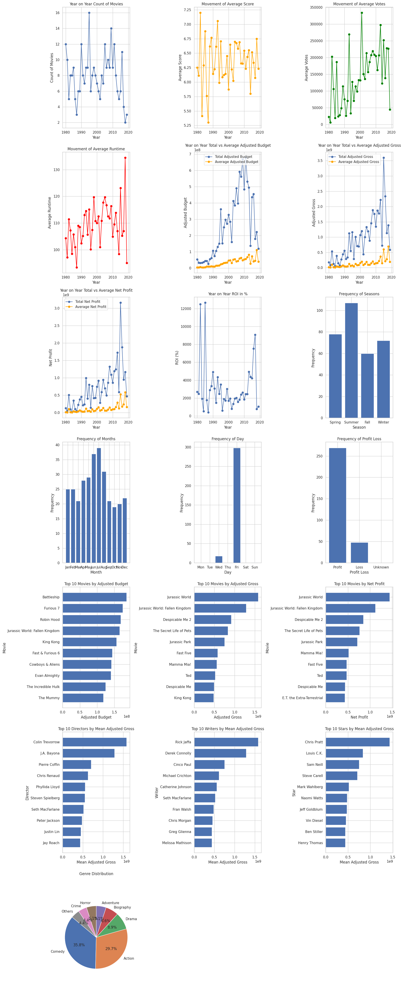

In [ ]:
create_dashboard(company_year_summary, 'Universal Pictures')

#### Columbia Pictures Dashboard

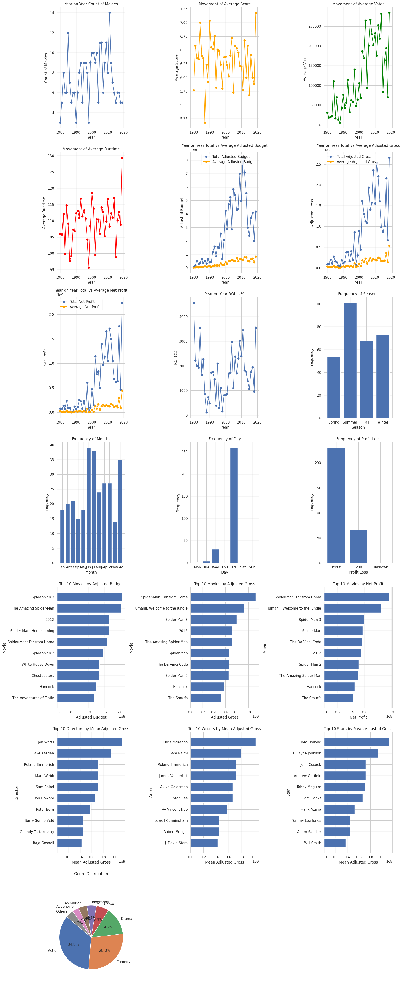

In [ ]:
create_dashboard(company_year_summary, 'Columbia Pictures')

#### Warner Bros. Dashboard

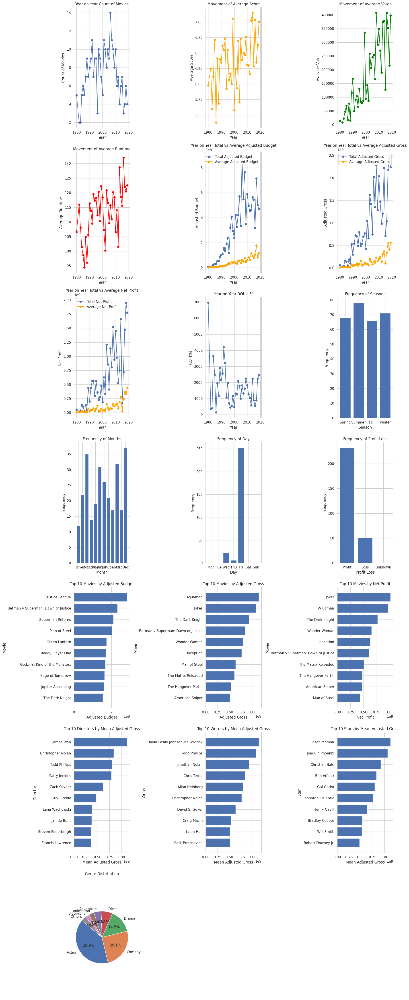

In [ ]:
create_dashboard(company_year_summary, 'Warner Bros.')

#### Paramount Pictures Dashboard

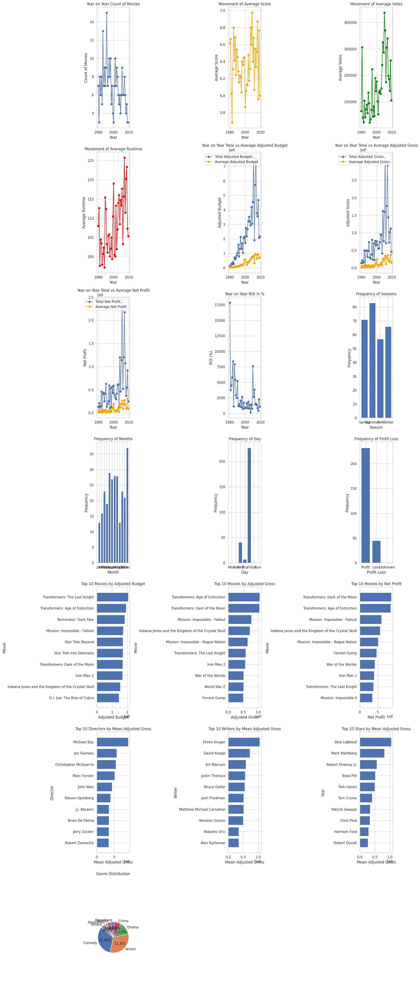

In [ ]:
create_dashboard(company_year_summary, 'Paramount Pictures')

#### Twentieth Century Fox Dashboard

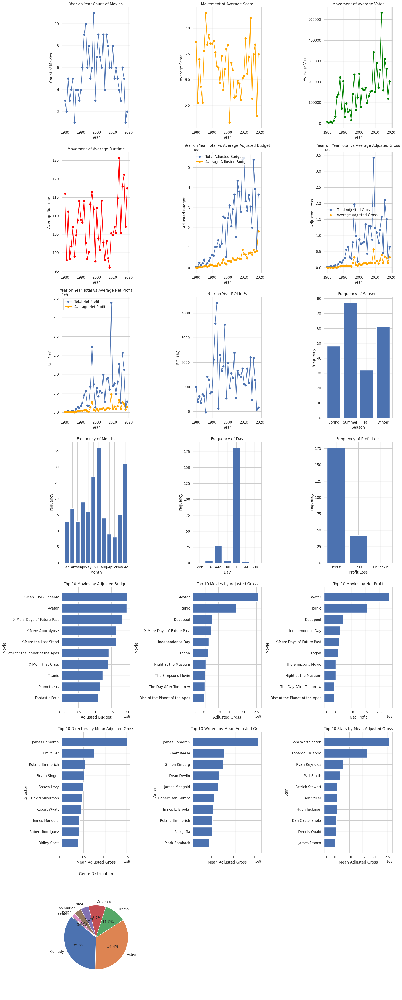

In [ ]:
create_dashboard(company_year_summary, 'Twentieth Century Fox')

#### New Line Cinema Dashboard

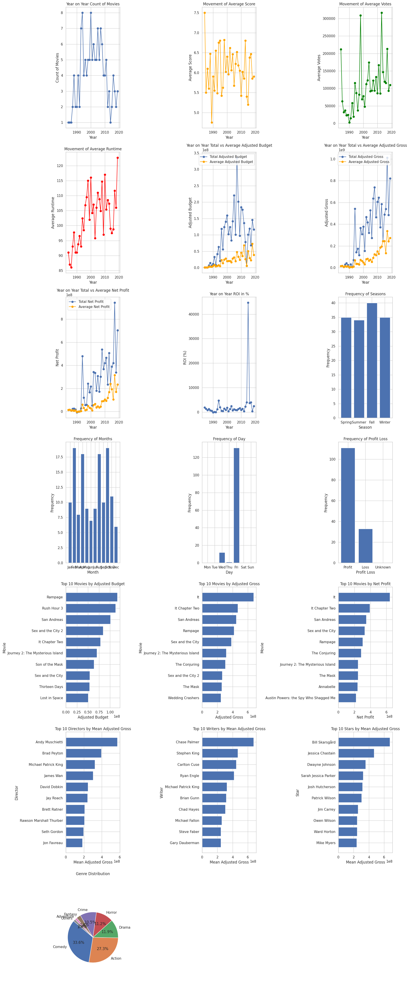

In [ ]:
create_dashboard(company_year_summary, 'New Line Cinema')

#### Touchstone Pictures Dashboard

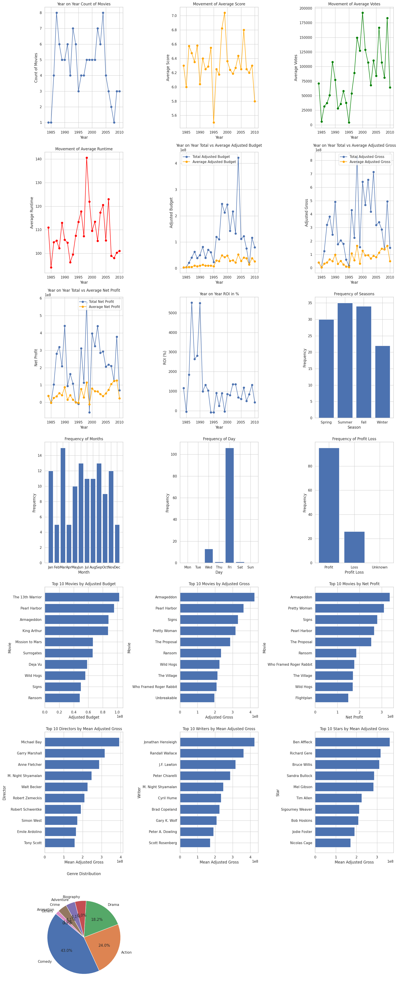

In [ ]:
create_dashboard(company_year_summary, 'Touchstone Pictures')

#### Walt Disney Pictures Dashboard

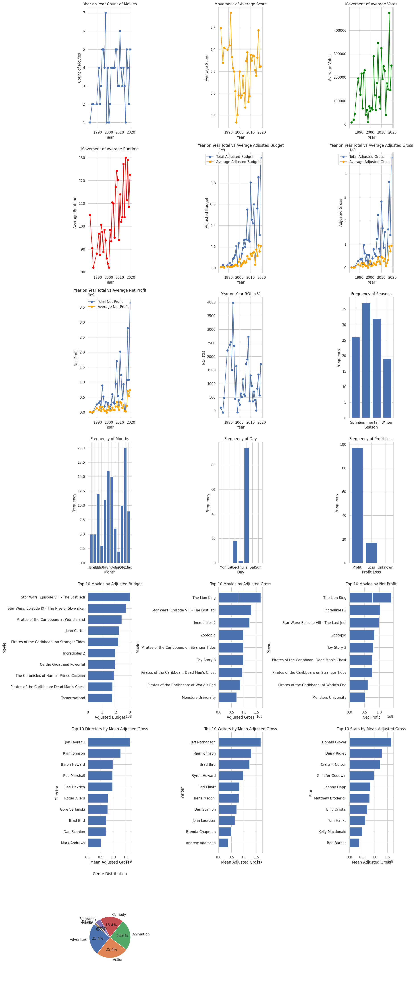

In [ ]:
create_dashboard(company_year_summary, 'Walt Disney Pictures')

#### MGM Dashboard

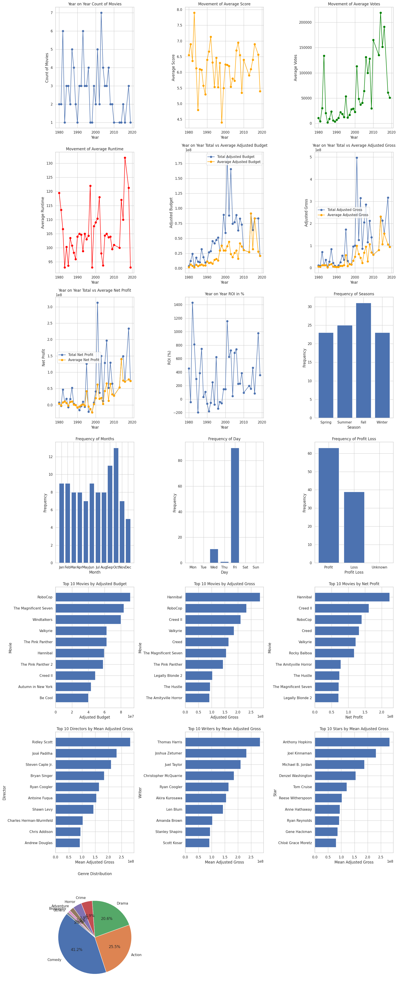

In [ ]:
create_dashboard(company_year_summary, 'Metro-Goldwyn-Mayer (MGM)')

#### TriStar Pictures Dashboard

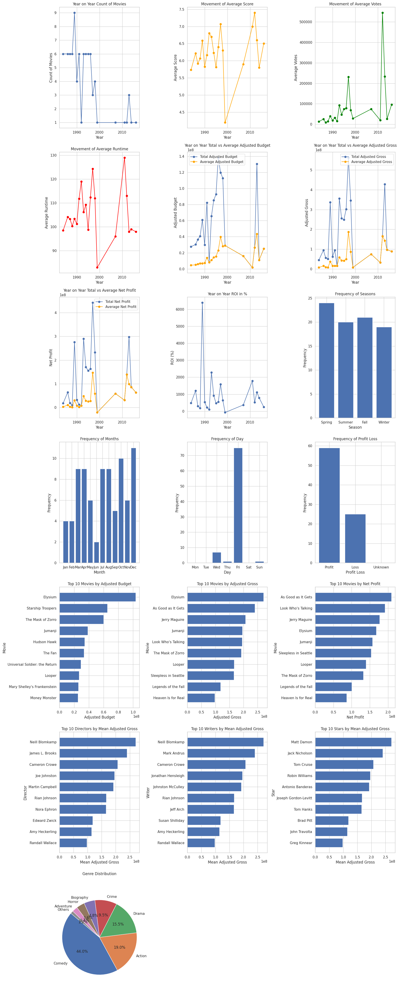

In [ ]:
create_dashboard(company_year_summary, 'TriStar Pictures')

### Total Movie Count and Adjusted Budget and Mean Adjusted Budget for Top 10 companies

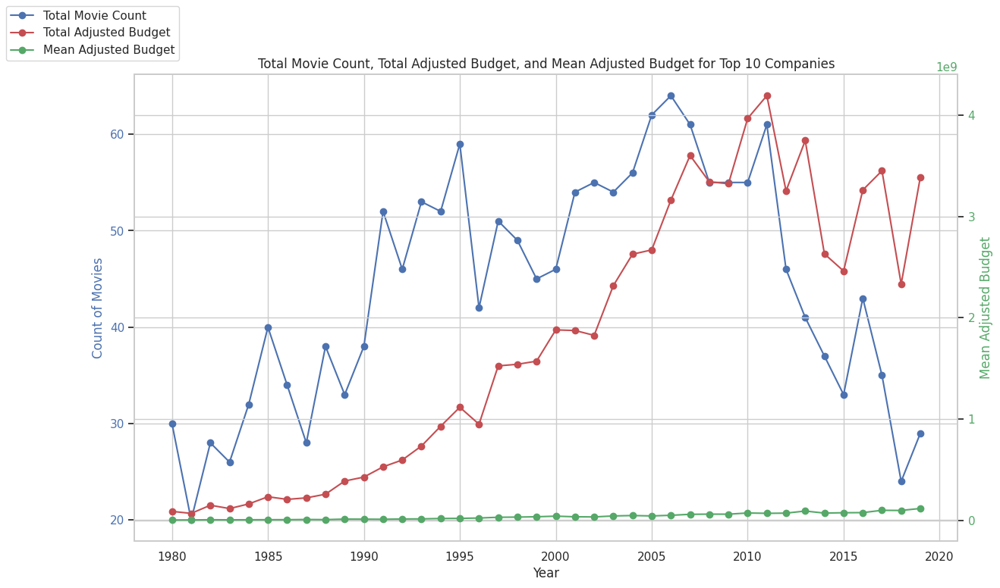

In [ ]:
# Step 1: Identify the top 10 companies by gross
top_10_companies_by_gross = company_year_summary.groupby('company')['total_adjusted_gross'].sum().nlargest(10).index

# Step 2: Extract relevant data for these companies
top_10_company_data = company_year_summary[company_year_summary['company'].isin(top_10_companies_by_gross)]

# Step 3: Aggregate the data for the top 10 companies
sum_movie_count = top_10_company_data.groupby('year')['count_of_movies'].sum()
sum_total_adjusted_budget = top_10_company_data.groupby('year')['total_adjusted_budget'].sum()

# Calculate mean adjusted budget
mean_adjusted_budget = sum_total_adjusted_budget / sum_movie_count

# Plotting the sum of movie count, total adjusted budget, and mean adjusted budget over the years for the top 10 companies
fig, ax1 = plt.subplots(figsize=(14, 8))

# Plot total movie count on primary y-axis
ax1.plot(sum_movie_count.index, sum_movie_count.values, label='Total Movie Count', marker='o', color='b')
ax1.set_xlabel('Year')
ax1.set_ylabel('Count of Movies', color='b')
ax1.tick_params(axis='y', labelcolor='b')

# Create secondary y-axis for total adjusted budget
ax2 = ax1.twinx()
ax2.plot(sum_total_adjusted_budget.index, sum_total_adjusted_budget.values, label='Total Adjusted Budget', marker='o', color='r')
ax2.set_ylabel('Total Adjusted Budget', color='r')
ax2.tick_params(axis='y', labelcolor='r')

# Plot mean adjusted budget on secondary y-axis
ax2.plot(mean_adjusted_budget.index, mean_adjusted_budget.values, label='Mean Adjusted Budget', marker='o', color='g')
ax2.set_ylabel('Mean Adjusted Budget', color='g')
ax2.tick_params(axis='y', labelcolor='g')

# Display the legend
fig.legend(loc="upper left")

plt.title('Total Movie Count, Total Adjusted Budget, and Mean Adjusted Budget for Top 10 Companies')
plt.grid(True)
plt.show()


### Count of movies by Fate Frequency for the Top 10 Companies combined

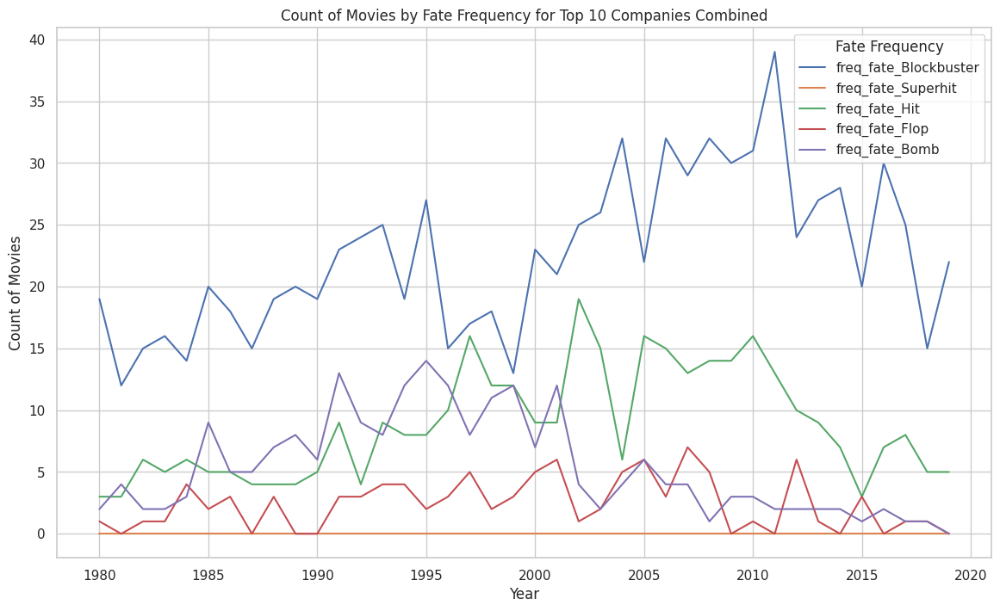

In [ ]:
# Step 1: Aggregate the data for the count of movies by fate frequency for the top 10 companies combined
fate_frequency_data = top_10_company_data.groupby('year')[['freq_fate_Blockbuster', 'freq_fate_Superhit', 'freq_fate_Hit', 'freq_fate_Flop', 'freq_fate_Bomb']].sum()

# Step 2: Plot line charts for count of movies by fate frequency over the years
plt.figure(figsize=(14, 8))

# Plotting line charts for each fate frequency
for column in fate_frequency_data.columns:
    plt.plot(fate_frequency_data.index, fate_frequency_data[column], label=column)

plt.title('Count of Movies by Fate Frequency for Top 10 Companies Combined')
plt.xlabel('Year')
plt.ylabel('Count of Movies')
plt.legend(title='Fate Frequency')
plt.grid(True)
plt.show()

### Count of Movies by Genre Type for the Top 10 Companies combined

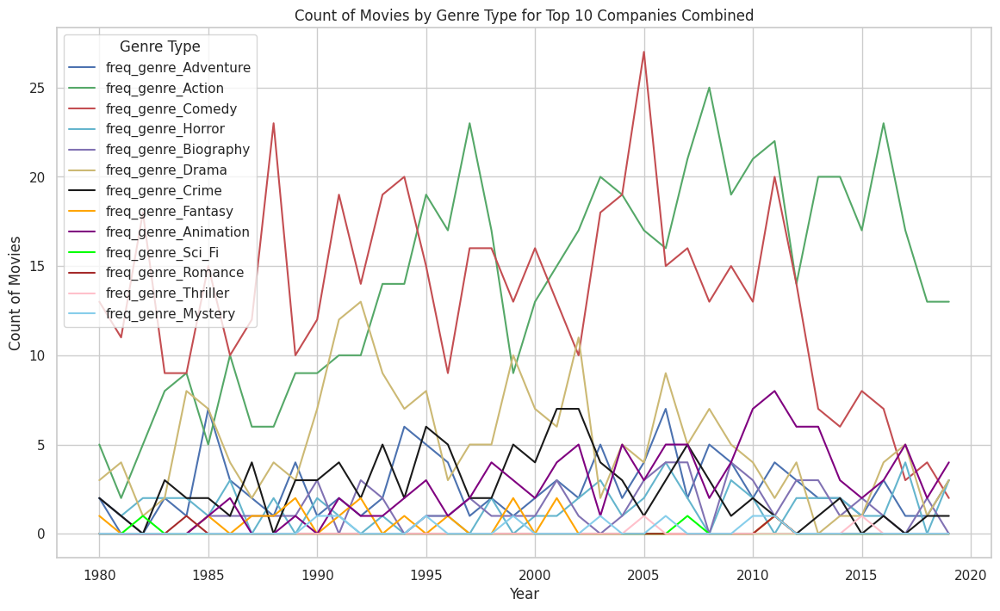

In [ ]:
# Step 1: Aggregate the data for the count of movies by genre type for the top 10 companies combined
genre_frequency_data = top_10_company_data.groupby('year')[['freq_genre_Adventure', 'freq_genre_Action', 'freq_genre_Comedy', 'freq_genre_Horror', 'freq_genre_Biography', 'freq_genre_Drama', 'freq_genre_Crime', 'freq_genre_Fantasy', 'freq_genre_Animation', 'freq_genre_Sci_Fi', 'freq_genre_Romance', 'freq_genre_Thriller', 'freq_genre_Mystery']].sum()

# Step 2: Plot line charts for count of movies by genre type over the years
plt.figure(figsize=(14, 8))

# Define a list of colors for each genre type
colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k', 'orange', 'purple', 'lime', 'brown', 'pink', 'skyblue']

# Plotting line charts for each genre type with different colors
for i, column in enumerate(genre_frequency_data.columns):
    plt.plot(genre_frequency_data.index, genre_frequency_data[column], label=column, color=colors[i])

plt.title('Count of Movies by Genre Type for Top 10 Companies Combined')
plt.xlabel('Year')
plt.ylabel('Count of Movies')
plt.legend(title='Genre Type')
plt.grid(True)
plt.show()

Netflix introduced as streaming service in 2007. We see a direct immpact of it on the genre being released post 2010- mostly action and big screen impact films. Hulu launched in 2007. Amazon Prime in 2006. Disney+ in 2019.

### Genre-wise count of movies and total adjusted budget and mean adjusted budget

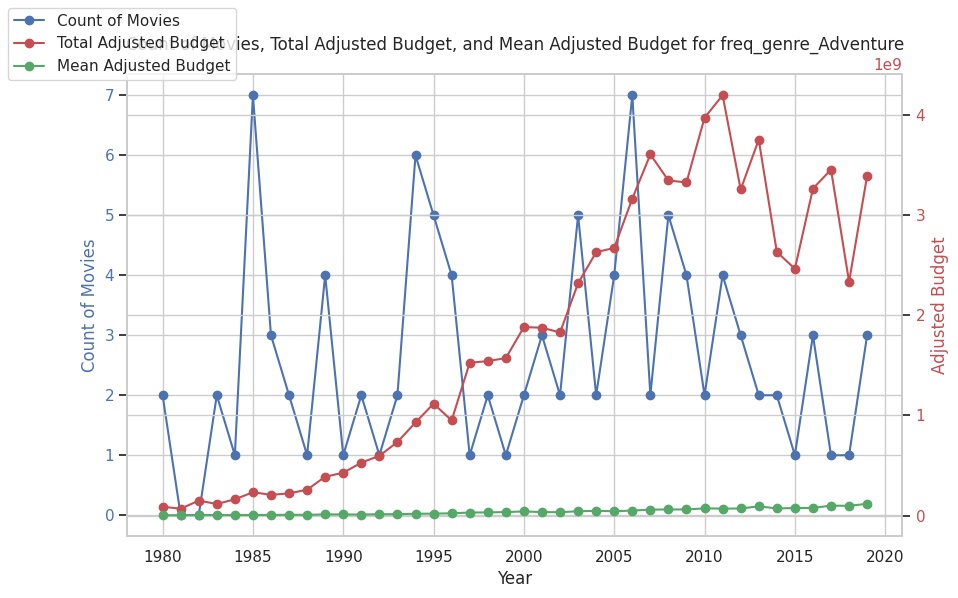

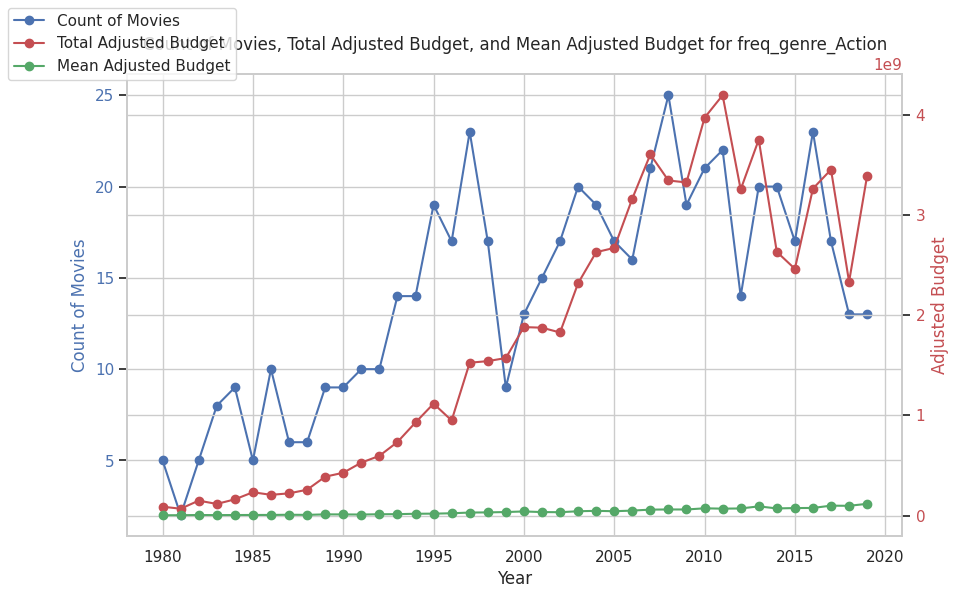

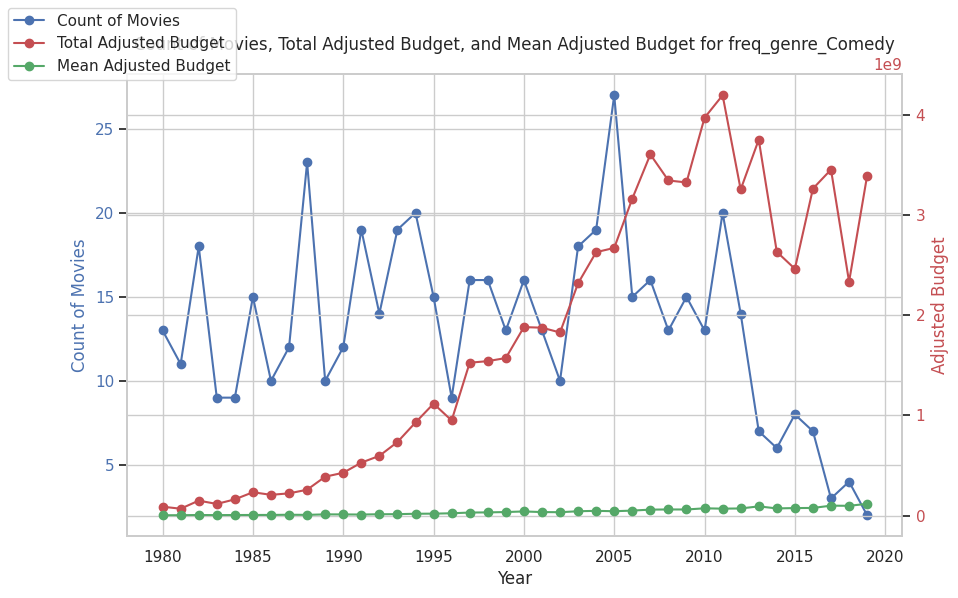

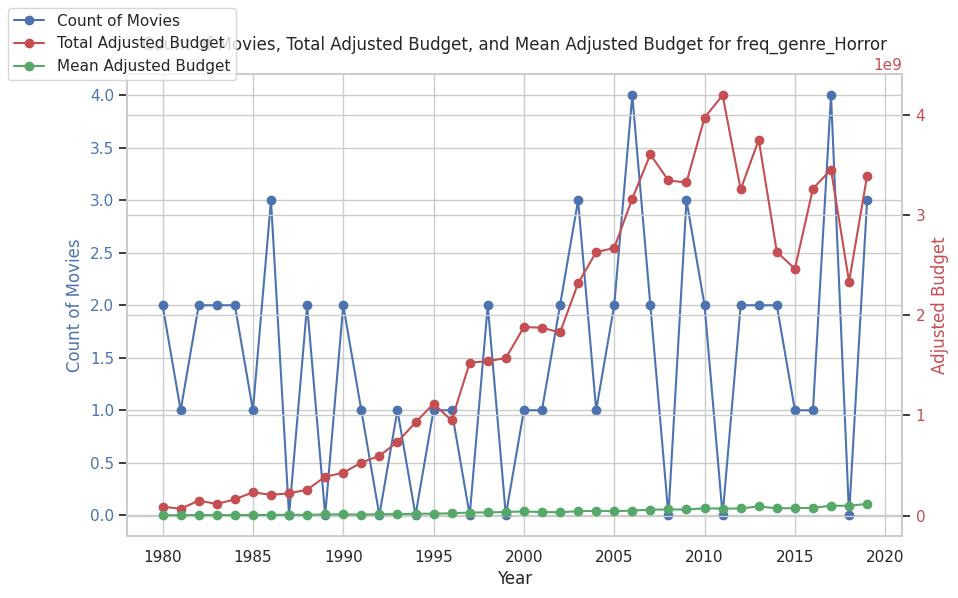

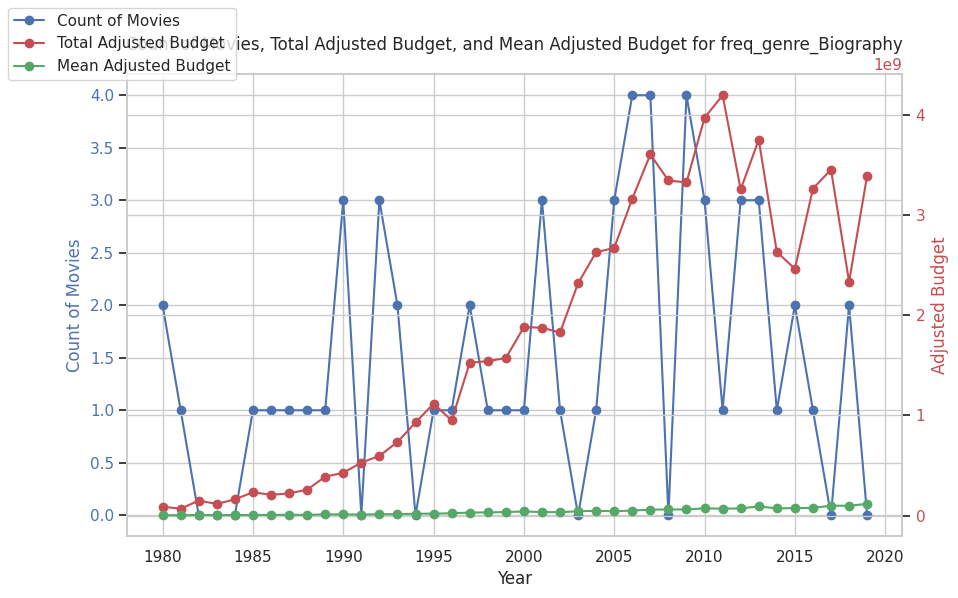

...

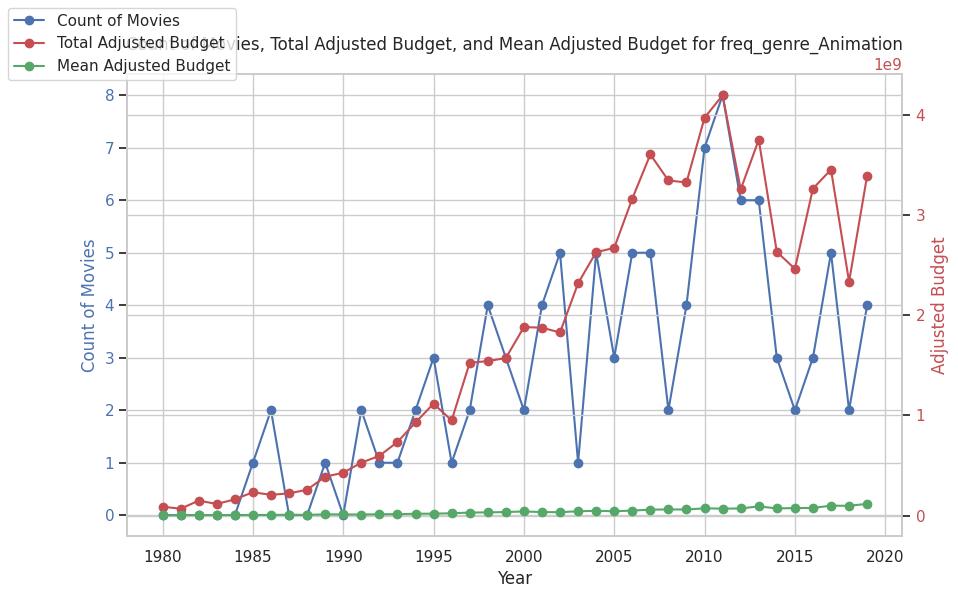

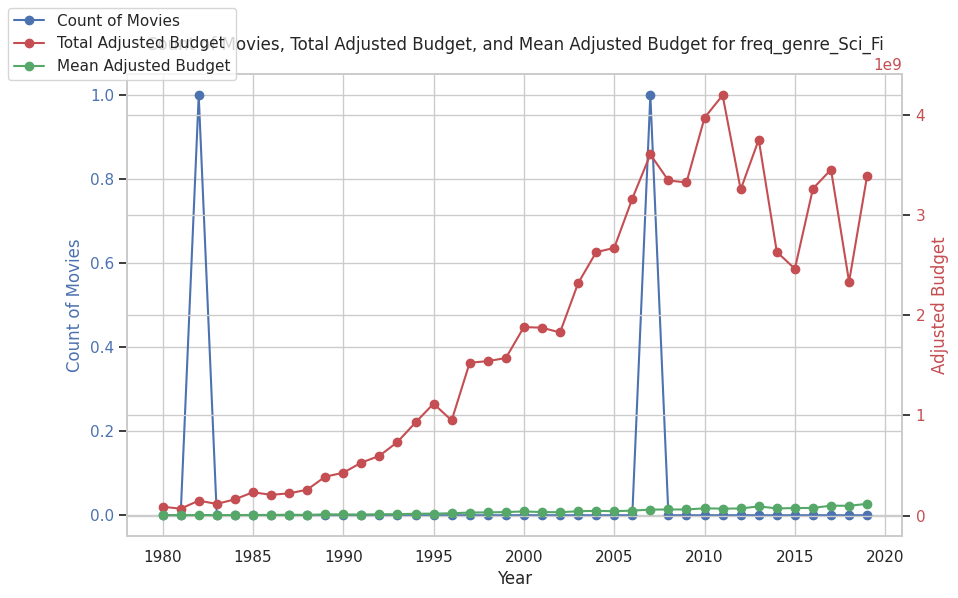

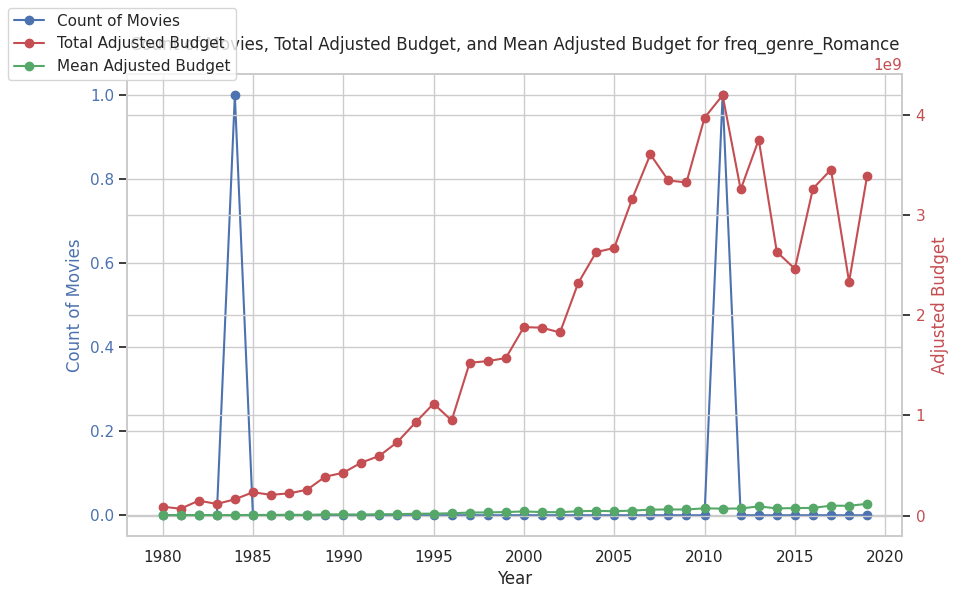

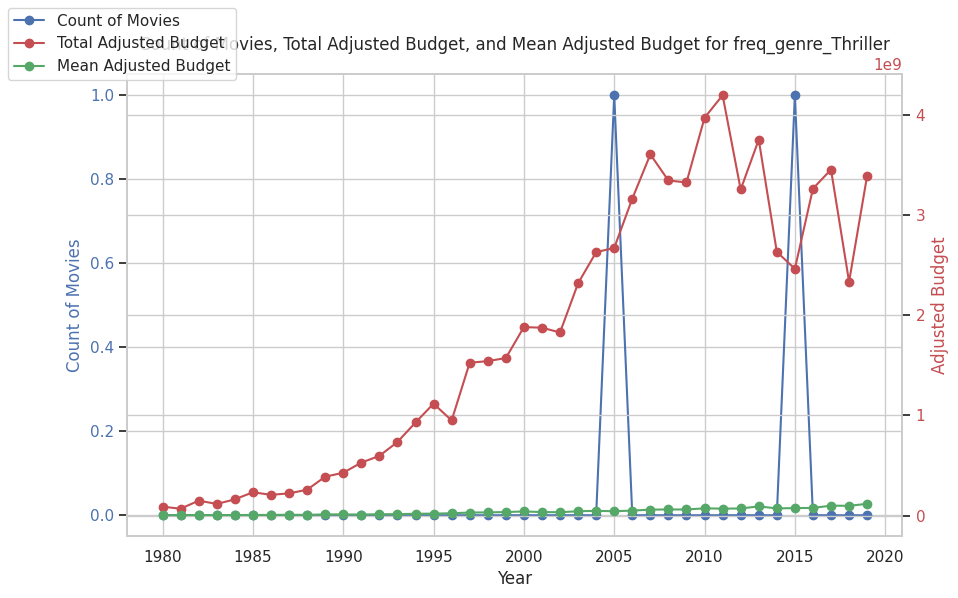

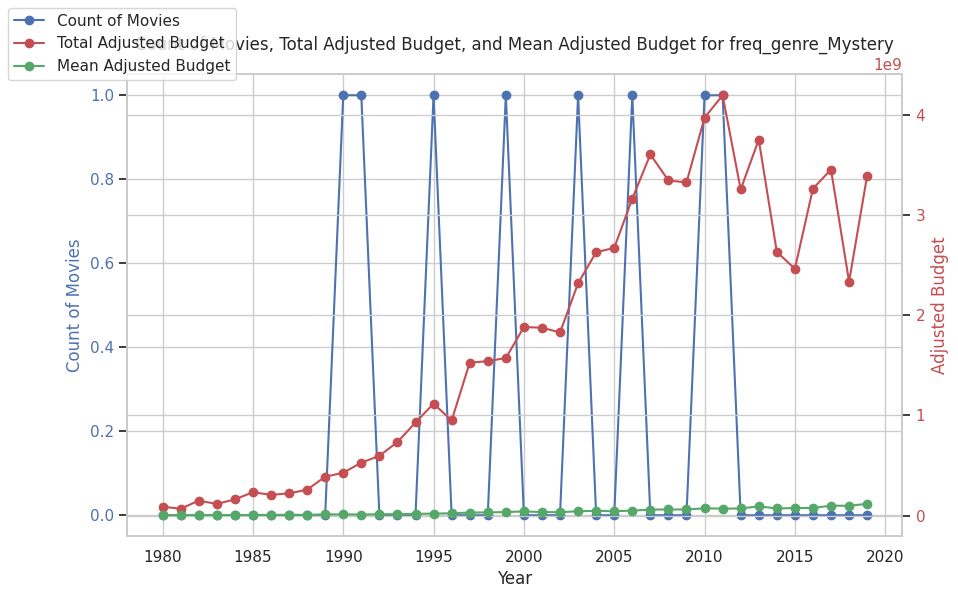

In [ ]:
# Iterate through each genre type
for column in genre_frequency_data.columns:
    # Create a new figure for each genre type
    fig, ax1 = plt.subplots(figsize=(10, 6))

    # Plot count of movies on primary y-axis
    ax1.plot(genre_frequency_data.index, genre_frequency_data[column], label='Count of Movies', color='b', marker='o')
    ax1.set_xlabel('Year')
    ax1.set_ylabel('Count of Movies', color='b')
    ax1.tick_params(axis='y', labelcolor='b')

    # Create secondary y-axis for adjusted budget
    ax2 = ax1.twinx()
    ax2.plot(sum_total_adjusted_budget.index, sum_total_adjusted_budget.values, label='Total Adjusted Budget', color='r', marker='o')
    ax2.plot(mean_adjusted_budget.index, mean_adjusted_budget.values, label='Mean Adjusted Budget', color='g', marker='o')
    ax2.set_ylabel('Adjusted Budget', color='r')
    ax2.tick_params(axis='y', labelcolor='r')

    # Set plot title and legend
    plt.title(f'Count of Movies, Total Adjusted Budget, and Mean Adjusted Budget for {column}')
    fig.legend(loc="upper left")
    plt.grid(True)
    plt.show()

### Genre-mix distribution for Top 10 companies over years

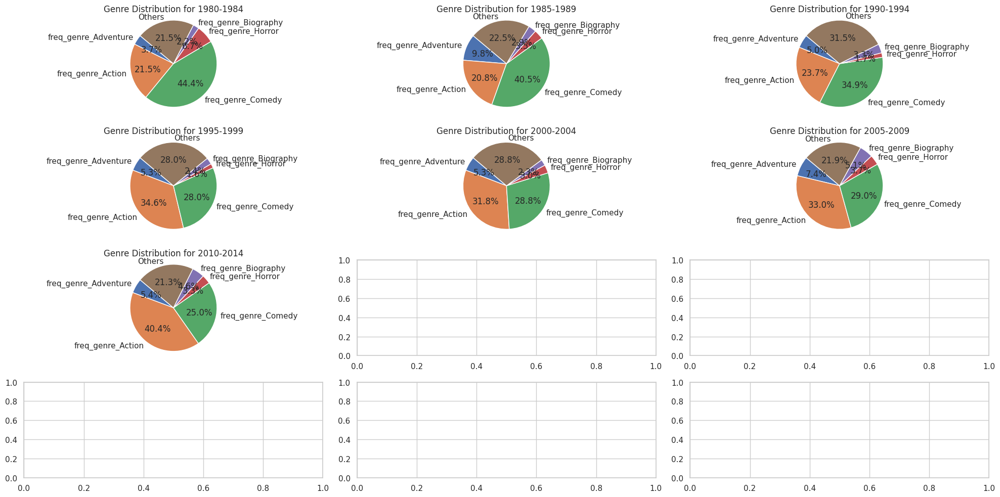

In [ ]:
## Genre distribution for Top 10 companies movement by year

# Step 1: Bin the data into 5-year periods
top_10_company_data['year_bin'] = pd.cut(top_10_company_data['year'], bins=np.arange(1980, 2020, 5), right=False)

# Step 2: Calculate the genre distribution for each 5-year period
genre_distribution = top_10_company_data.groupby('year_bin')[['freq_genre_Adventure', 'freq_genre_Action', 'freq_genre_Comedy', 'freq_genre_Horror', 'freq_genre_Biography', 'freq_genre_Drama', 'freq_genre_Crime', 'freq_genre_Fantasy', 'freq_genre_Animation', 'freq_genre_Sci_Fi', 'freq_genre_Romance', 'freq_genre_Thriller', 'freq_genre_Mystery']].sum()

# Step 3: Calculate the sum of frequencies for genres other than the top 5
genre_distribution['Others'] = genre_distribution.sum(axis=1) - genre_distribution[['freq_genre_Adventure', 'freq_genre_Action', 'freq_genre_Comedy', 'freq_genre_Horror', 'freq_genre_Biography']].sum(axis=1)

# Keep only the top 5 genres
genre_distribution = genre_distribution[['freq_genre_Adventure', 'freq_genre_Action', 'freq_genre_Comedy', 'freq_genre_Horror', 'freq_genre_Biography', 'Others']]

# Create subplots for each 5-year period
fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(20, 10))

# Iterate through each 5-year period
for i, (index, row) in enumerate(genre_distribution.iterrows()):
    # Calculate the position of the subplot in the grid
    row_idx = i // 3
    col_idx = i % 3

    # Plot the pie chart for the current period
    ax = axes[row_idx, col_idx]
    ax.pie(row, labels=row.index, autopct='%1.1f%%', startangle=140)
    ax.set_title(f'Genre Distribution for {index.left}-{index.right - 1}')
    ax.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

In [ ]:
merged_df.columns

Index(['name', 'rating', 'genre', 'year', 'score', 'votes', 'director',
       'writer', 'star', 'company', 'runtime', 'released_date',
       'released_day_of_week', 'released_week_number', 'released_month',
       'released_year', 'season', 'population', 'adjusted_budget',
       'adjusted_gross', 'net_profit', 'roi_in_%', 'fate', 'runtime_Category',
       'score_bucket', 'profit_loss'],
      dtype='object')

### Genre-wise profit and loss effect on budget allocated

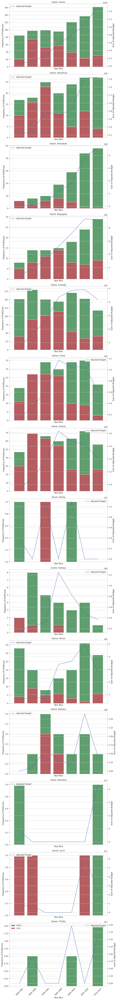

In [ ]:
# Create 5-year bins from 1980 to 2019
bins = range(1980, 2020, 5)
labels = [f'{start}-{start+4}' for start in bins[:-1]]

# Assign each year to its corresponding bin
merged_df['year_bin'] = pd.cut(merged_df['year'], bins=bins, labels=labels)

# Group by genre and year_bin, and calculate frequency of profit and loss and sum of adjusted_budget
genre_year_summary = merged_df.groupby(['genre', 'year_bin']).agg(
    freq_profit_loss_Profit=('profit_loss', lambda x: (x == 'Profit').sum()),
    freq_profit_loss_Loss=('profit_loss', lambda x: (x == 'Loss').sum()),
    sum_adjusted_budget=('adjusted_budget', 'sum')
).reset_index()

# Create a grid of subplots
genres = genre_year_summary['genre'].unique()
num_genres = len(genres)

fig, axes = plt.subplots(nrows=num_genres, ncols=1, figsize=(10, 6*num_genres), sharex=True)

# Iterate over each genre and create the subplot
for i, genre in enumerate(genres):
    genre_data = genre_year_summary[genre_year_summary['genre'] == genre]
    ax = axes[i]

    sns.barplot(x='year_bin', y='freq_profit_loss_Profit', data=genre_data, color='g', ax=ax, label='Profit')
    sns.barplot(x='year_bin', y='freq_profit_loss_Loss', data=genre_data, color='r', ax=ax, label='Loss')

    # Add secondary y-axis for sum of adjusted_budget
    ax2 = ax.twinx()
    sns.lineplot(x='year_bin', y='sum_adjusted_budget', data=genre_data, color='b', ax=ax2, label='Adjusted Budget')
    ax.set_ylabel('Frequency of Profit/Loss')
    ax2.set_ylabel('Sum of Adjusted Budget')
    ax.set_xlabel('Year Bins')

    ax.set_title(f'Genre: {genre}')

    # Set x-axis labels and tick positions
    ax.set_xticks(range(len(labels)))
    ax.set_xticklabels(labels, rotation=45)

# Add legend to the last subplot
axes[num_genres-1].legend(loc='upper left')

plt.tight_layout()
plt.show()

### Genre-wise score effect on budget allocated

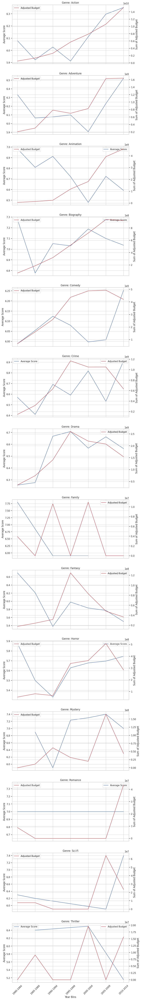

In [ ]:
# Create 5-year bins from 1980 to 2019
bins = range(1980, 2020, 5)
labels = [f'{start}-{start+4}' for start in bins[:-1]]

# Assign each year to its corresponding bin
merged_df['year_bin'] = pd.cut(merged_df['year'], bins=bins, labels=labels)

# Group by genre and year_bin, and calculate score and sum of adjusted_budget
genre_year_summary = merged_df.groupby(['genre', 'year_bin']).agg(
    avg_score=('score', 'mean'),
    sum_adjusted_budget=('adjusted_budget', 'sum')
).reset_index()

# Create a grid of subplots
genres = genre_year_summary['genre'].unique()
num_genres = len(genres)

fig, axes = plt.subplots(nrows=num_genres, ncols=1, figsize=(10, 6*num_genres), sharex=True)

# Iterate over each genre and create the subplot
for i, genre in enumerate(genres):
    genre_data = genre_year_summary[genre_year_summary['genre'] == genre]
    ax = axes[i]

    sns.lineplot(x='year_bin', y='avg_score', data=genre_data, color='b', ax=ax, label='Average Score')

    # Add secondary y-axis for sum of adjusted_budget
    ax2 = ax.twinx()
    sns.lineplot(x='year_bin', y='sum_adjusted_budget', data=genre_data, color='r', ax=ax2, label='Adjusted Budget')
    ax.set_ylabel('Average Score')
    ax2.set_ylabel('Sum of Adjusted Budget')
    ax.set_xlabel('Year Bins')

    ax.set_title(f'Genre: {genre}')

    # Set x-axis labels and tick positions
    ax.set_xticks(range(len(labels)))
    ax.set_xticklabels(labels, rotation=45)

# Add legend to the last subplot
axes[num_genres-1].legend(loc='upper left')

plt.show()

### Genre-wise votes effect on budget allocated

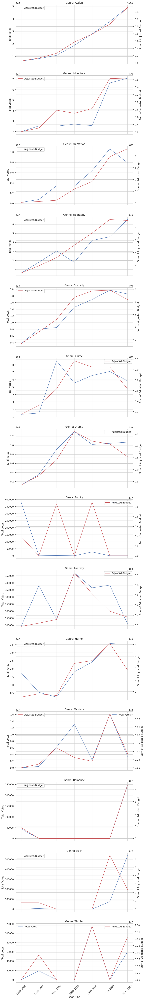

In [ ]:
# Create 5-year bins from 1980 to 2019
bins = range(1980, 2020, 5)
labels = [f'{start}-{start+4}' for start in bins[:-1]]

# Assign each year to its corresponding bin
merged_df['year_bin'] = pd.cut(merged_df['year'], bins=bins, labels=labels)

# Group by genre and year_bin, and calculate total votes and sum of adjusted_budget
genre_year_summary = merged_df.groupby(['genre', 'year_bin']).agg(
    total_votes=('votes', 'sum'),
    sum_adjusted_budget=('adjusted_budget', 'sum')
).reset_index()

# Create a grid of subplots
genres = genre_year_summary['genre'].unique()
num_genres = len(genres)

fig, axes = plt.subplots(nrows=num_genres, ncols=1, figsize=(10, 6*num_genres), sharex=True)

# Iterate over each genre and create the subplot
for i, genre in enumerate(genres):
    genre_data = genre_year_summary[genre_year_summary['genre'] == genre]
    ax = axes[i]

    sns.lineplot(x='year_bin', y='total_votes', data=genre_data, color='b', ax=ax, label='Total Votes')

    # Add secondary y-axis for sum of adjusted_budget
    ax2 = ax.twinx()
    sns.lineplot(x='year_bin', y='sum_adjusted_budget', data=genre_data, color='r', ax=ax2, label='Adjusted Budget')
    ax.set_ylabel('Total Votes')
    ax2.set_ylabel('Sum of Adjusted Budget')
    ax.set_xlabel('Year Bins')

    ax.set_title(f'Genre: {genre}')

    # Set x-axis labels and tick positions
    ax.set_xticks(range(len(labels)))
    ax.set_xticklabels(labels, rotation=45)

# Add legend to the last subplot
axes[num_genres-1].legend(loc='upper left')

plt.show()

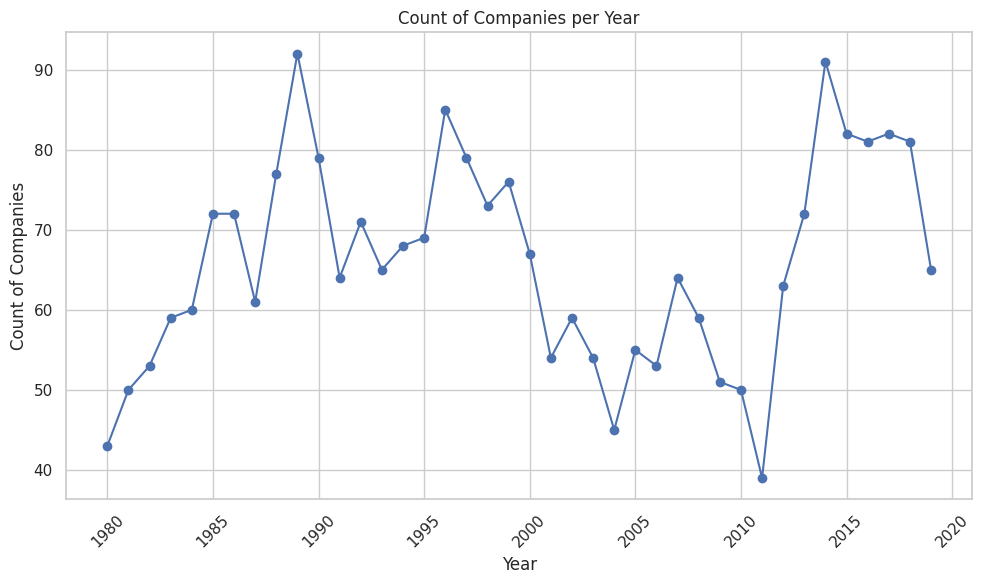

In [ ]:
# Grouping by 'year' and counting unique companies in each year
company_count_per_year = company_year_summary.groupby('year')['company'].nunique().reset_index(name='count_of_companies')

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(company_count_per_year['year'], company_count_per_year['count_of_companies'], marker='o', linestyle='-', color='b')
plt.title('Count of Companies per Year')
plt.xlabel('Year')
plt.ylabel('Count of Companies')
plt.grid(True)
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.tight_layout()  # Adjust layout to not cut off labels

plt.show()

In [ ]:
from ydata_profiling import ProfileReport
profile_report=ProfileReport(company_year_summary)
profile_report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Model 1: Gross Revenue Forecasting Model

In [ ]:
data= merged_df.drop(['year_bin'], axis=1)
data.head()

,name,rating,genre,year,score,votes,director,writer,star,company,runtime,released_date,released_day_of_week,released_week_number,released_month,released_year,season,population,adjusted_budget,adjusted_gross,net_profit,roi_in_%,fate,runtime_Category,score_bucket,profit_loss
0,The Blue Lagoon,R,Adventure,1980,5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,Columbia Pictures,104.0,1980-07-02,Wednesday,27,July,1980.0,Summer,223140018,1.432767e+06,2.821104e+07,2.677828e+07,1868.990939,Blockbuster,101-110,Medium (4-7),Profit
1,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,Lucasfilm,124.0,1980-06-20,Friday,25,June,1980.0,Summer,223140018,5.731066e+06,2.580683e+08,2.523373e+08,4402.972318,Blockbuster,121-130,High (7-10),Profit
2,Airplane!,PG,Comedy,1980,7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,Paramount Pictures,88.0,1980-07-02,Wednesday,27,July,1980.0,Summer,223140018,1.114374e+06,4.000318e+07,3.888881e+07,3489.744655,Blockbuster,0-90,High (7-10),Profit
3,Caddyshack,R,Comedy,1980,7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,Orion Pictures,98.0,1980-07-25,Friday,30,July,1980.0,Summer,223140018,1.910355e+06,1.910022e+07,1.718986e+07,899.825187,Blockbuster,91-100,High (7-10),Profit
4,Friday the 13th,R,Horror,1980,6.4,123000.0,Sean S. Cunningham,Victor Miller,Betsy Palmer,Paramount Pictures,95.0,1980-05-09,Friday,19,May,1980.0,Spring,223140018,1.751159e+05,1.905624e+07,1.888112e+07,10782.070944,Blockbuster,91-100,Medium (4-7),Profit


In [ ]:
print(data.info())
print(data.describe())
data.isna().sum()
data.dropna(subset=["runtime_Category"],inplace=True)

<class 'pandas.core.frame.DataFrame'>
Index: 5052 entries, 0 to 5052
Data columns (total 26 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   name                  5052 non-null   object        
 1   rating                5052 non-null   object        
 2   genre                 5052 non-null   object        
 3   year                  5052 non-null   int64         
 4   score                 5052 non-null   float64       
 5   votes                 5052 non-null   float64       
 6   director              5052 non-null   object        
 7   writer                5052 non-null   object        
 8   star                  5052 non-null   object        
 9   company               5052 non-null   object        
 10  runtime               5052 non-null   float64       
 11  released_date         5052 non-null   datetime64[ns]
 12  released_day_of_week  5052 non-null   object        
 13  released_week_number  5

In [ ]:
print(data.info())
print(data.describe())
data.isna().sum()

<class 'pandas.core.frame.DataFrame'>
Index: 4857 entries, 0 to 5052
Data columns (total 26 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   name                  4857 non-null   object        
 1   rating                4857 non-null   object        
 2   genre                 4857 non-null   object        
 3   year                  4857 non-null   int64         
 4   score                 4857 non-null   float64       
 5   votes                 4857 non-null   float64       
 6   director              4857 non-null   object        
 7   writer                4857 non-null   object        
 8   star                  4857 non-null   object        
 9   company               4857 non-null   object        
 10  runtime               4857 non-null   float64       
 11  released_date         4857 non-null   datetime64[ns]
 12  released_day_of_week  4857 non-null   object        
 13  released_week_number  4

name                    0
rating                  0
genre                   0
year                    0
score                   0
votes                   0
director                0
writer                  0
star                    0
company                 0
runtime                 0
released_date           0
released_day_of_week    0
released_week_number    0
released_month          0
released_year           0
season                  0
population              0
adjusted_budget         0
adjusted_gross          0
net_profit              0
roi_in_%                0
fate                    0
runtime_Category        0
score_bucket            0
profit_loss             0
dtype: int64

In [ ]:
# Import necessary libraries
from sklearn.preprocessing import MinMaxScaler, StandardScaler
import numpy as np

# Initialize MinMaxScaler and StandardScaler
scaler = MinMaxScaler()
stan = StandardScaler()

# Create copies of the original data
datanorm = data.copy()
datastan = data.copy()
newdata = data.copy()

# Drop irrelevant columns from datanorm and datastan
datanorm = datanorm.drop(["rating","director","writer","star","company","released_date","released_week_number","population","fate","score_bucket","profit_loss","name","net_profit",'runtime_Category','season','released_month','released_day_of_week','runtime'],axis=1)
datastan = datastan.drop(["rating","director","writer","star","company","released_date","released_week_number","population","fate","score_bucket","profit_loss","name","net_profit",'runtime_Category','season','released_month','released_day_of_week','runtime'],axis=1)

# Reset index for both datanorm and datastan
datanorm.reset_index(drop=True, inplace=True)
datastan.reset_index(drop=True, inplace=True)

# Identify numerical and categorical columns
numerical_columns = datastan.select_dtypes(include=['int', 'float']).columns
categorical_columns = datastan.select_dtypes(include=['object']).columns

# Define columns for which log transformation will be applied
logcolumns=['adjusted_budget','adjusted_gross']

# Normalize numerical columns in datanorm using MinMaxScaler
datanorm[numerical_columns] = scaler.fit_transform(datanorm[numerical_columns])

# Standardize numerical columns in datastan using StandardScaler
datastan[numerical_columns] = stan.fit_transform(datastan[numerical_columns])

# Create copies of datanorm and datastan
datanormlog = datanorm.copy()
datastanlog = datastan.copy()

# Apply log transformation to numerical columns in datanormlog and datastanlog
datanormlog[numerical_columns] = np.log(datanormlog[numerical_columns] + 1)
datastanlog[numerical_columns] = np.log(datastanlog[numerical_columns] + 1)

# Reset index for datanormlog and datastanlog
datanormlog.reset_index(drop=True, inplace=True)
datastanlog.reset_index(drop=True, inplace=True)

# Drop irrelevant columns from newdata to create newdatastan
newdatastan = newdata.drop(["rating","director","writer","star","company","released_date","released_week_number","population","fate","score_bucket","profit_loss","name","net_profit",'runtime_Category','season','released_month','released_day_of_week','runtime'],axis=1)

# Standardize columns specified in logcolumns in newdatastan
newdatastan[logcolumns] = stan.fit_transform(newdatastan[logcolumns])

# Create a copy of newdatastan and apply log transformation to specified columns
newdatastanlog = newdatastan.copy()
newdatastanlog[logcolumns] = np.log(newdatastanlog[logcolumns] + 1)

# Drop irrelevant columns from newdata to create newdatanorm
newdatanorm = newdata.drop(["rating","director","writer","star","company","released_date","released_week_number","population","fate","score_bucket","profit_loss","name","net_profit",'runtime_Category','season','released_month','released_day_of_week','runtime'],axis=1)

# Normalize columns specified in logcolumns in newdatanorm
newdatanorm[logcolumns] = scaler.fit_transform(newdatanorm[logcolumns])

# Create a copy of newdatanorm and apply log transformation to specified columns
newdatanormlog = newdatanorm.copy()
newdatanormlog[logcolumns] = np.log(newdatanormlog[logcolumns] + 1)

# Reset index for newdatastanlog, newdatastan, newdatanorm, and newdatanormlog
newdatastanlog.reset_index(drop=True, inplace=True)
newdatastan.reset_index(drop=True, inplace=True)
newdatanorm.reset_index(drop=True, inplace=True)
newdatanormlog.reset_index(drop=True, inplace=True)

# Output newdatanorm
newdatanorm

,genre,year,score,votes,released_year,adjusted_budget,adjusted_gross,roi_in_%
0,Adventure,1980,5.8,65000.0,1980.0,0.005039,0.014383,1868.990939
1,Action,1980,8.7,1200000.0,1980.0,0.020167,0.131575,4402.972318
2,Comedy,1980,7.7,221000.0,1980.0,0.003918,0.020395,3489.744655
3,Comedy,1980,7.3,108000.0,1980.0,0.006720,0.009738,899.825187
4,Horror,1980,6.4,123000.0,1980.0,0.000612,0.009715,10782.070944
...,...,...,...,...,...,...,...,...
4852,Horror,2019,4.8,1900.0,2019.0,0.071285,0.000002,-99.974888
4853,Action,2019,3.5,195.0,2019.0,0.004169,0.000023,-96.173521
4854,Comedy,2019,5.9,403.0,2019.0,0.069546,0.000483,-95.203632
4855,Adventure,2019,5.6,336.0,2019.0,0.128664,0.000914,-95.091930


In [ ]:
# Import necessary libraries
from sklearn.preprocessing import OneHotEncoder
import pandas as pd

# Initialize OneHotEncoder
encoder = OneHotEncoder(sparse=False, drop='first')

# Perform one-hot encoding on categorical columns in datanorm
one_hot_encoded = encoder.fit_transform(datanorm[categorical_columns])

# Get feature names after one-hot encoding
feature_names = encoder.get_feature_names_out(categorical_columns)

# Create a DataFrame with one-hot encoded categorical features and merge it with datanorm
datanormenint = pd.DataFrame(one_hot_encoded, columns=feature_names)
datanormen = pd.concat([datanorm.drop(categorical_columns, axis=1), datanormenint], axis=1)

# Perform similar operations for datanormlog, datastan, and datastanlog
datanormlogen = pd.concat([datanormlog.drop(categorical_columns, axis=1), datanormenint], axis=1)
datastanen = pd.concat([datastan.drop(categorical_columns, axis=1), datanormenint], axis=1)
datastanlogen = pd.concat([datastanlog.drop(categorical_columns, axis=1), datanormenint], axis=1)

# Perform one-hot encoding on categorical columns in newdatanorm
newone_hot_encoded = encoder.fit_transform(newdatanorm[categorical_columns])

# Get feature names after one-hot encoding
feature_names = encoder.get_feature_names_out(categorical_columns)

# Create a DataFrame with one-hot encoded categorical features and merge it with newdatanorm
newdatanormenint = pd.DataFrame(newone_hot_encoded, columns=feature_names)
newdatanormen = pd.concat([newdatanorm.drop(categorical_columns, axis=1), newdatanormenint], axis=1)

# Perform similar operations for newdatanormlog, newdatastan, and newdatastanlog
newdatanormlogen = pd.concat([newdatanormlog.drop(categorical_columns, axis=1), newdatanormenint], axis=1)
newdatastanen = pd.concat([newdatastan.drop(categorical_columns, axis=1), newdatanormenint], axis=1)
newdatastanlogen = pd.concat([newdatastanlog.drop(categorical_columns, axis=1), newdatanormenint], axis=1)

# Reset index for newdatanormen, newdatanormlogen, newdatastanen, and newdatastanlogen
newdatanormen.reset_index(drop=True, inplace=True)
newdatanormlogen.reset_index(drop=True, inplace=True)
newdatastanen.reset_index(drop=True, inplace=True)
newdatastanlogen.reset_index(drop=True, inplace=True)

In [ ]:
newdatanormenint
newdatastanen

,year,score,votes,released_year,adjusted_budget,adjusted_gross,roi_in_%,genre_Adventure,genre_Animation,genre_Biography,genre_Comedy,genre_Crime,genre_Drama,genre_Family,genre_Fantasy,genre_Horror,genre_Mystery,genre_Romance,genre_Sci-Fi,genre_Thriller
0,1980,5.8,65000.0,1980.0,-0.713296,-0.320727,1868.990939,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1980,8.7,1200000.0,1980.0,-0.578746,1.304431,4402.972318,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,1980,7.7,221000.0,1980.0,-0.723262,-0.237353,3489.744655,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,1980,7.3,108000.0,1980.0,-0.698346,-0.385143,899.825187,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,1980,6.4,123000.0,1980.0,-0.752664,-0.385454,10782.070944,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4852,2019,4.8,1900.0,2019.0,-0.124122,-0.520151,-99.974888,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
4853,2019,3.5,195.0,2019.0,-0.721032,-0.519866,-96.173521,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4854,2019,5.9,403.0,2019.0,-0.139586,-0.513486,-95.203632,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4855,2019,5.6,336.0,2019.0,0.386190,-0.507501,-95.091930,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


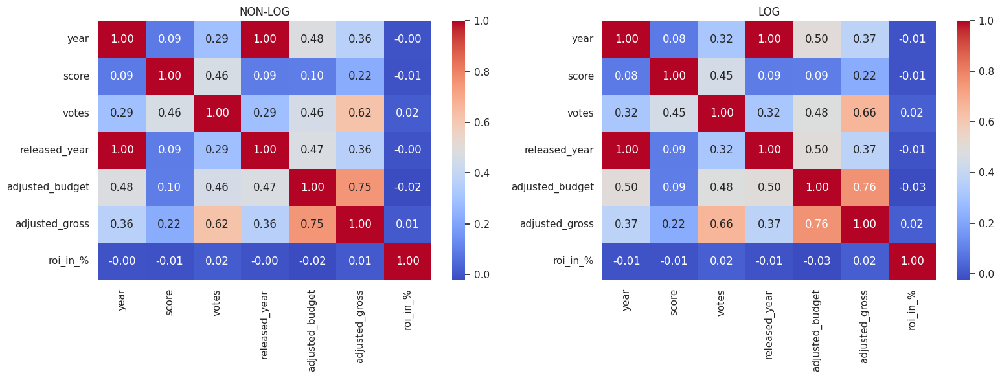

In [ ]:
# Calculate correlation matrices for numerical columns in datanorm with and without log transformation
corre = datanorm[numerical_columns].corr()
corre1 = datanormlog[numerical_columns].corr()

# Create subplots with 1 row and 2 columns, set the figure size
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Plot heatmap for correlation matrix without log transformation
sns.heatmap(corre, annot=True, cmap='coolwarm', fmt=".2f", ax=axes[0])
axes[0].set_title('NON-LOG')

# Plot heatmap for correlation matrix with log transformation
sns.heatmap(corre1, annot=True, cmap='coolwarm', fmt=".2f", ax=axes[1])
axes[1].set_title('LOG')

# Adjust layout and display the plots
plt.tight_layout()
plt.show()

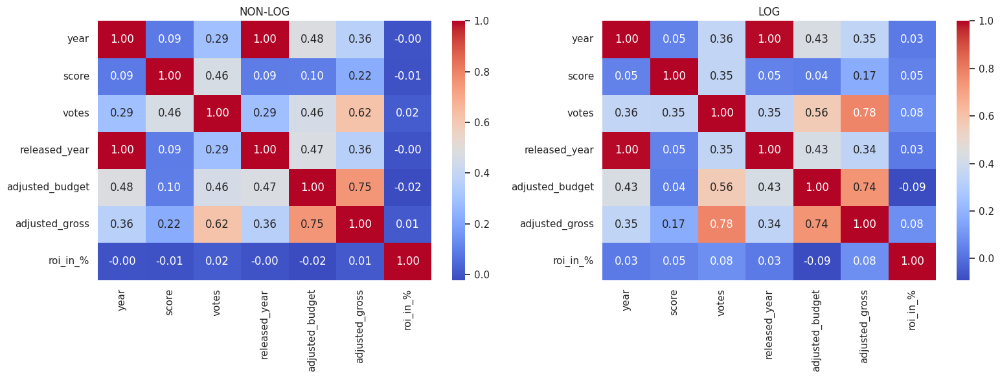

In [ ]:
# Calculate correlation matrices for numerical columns in datastan with and without log transformation
corre = datastan[numerical_columns].corr()
corre1 = datastanlog[numerical_columns].corr()

# Create subplots with 1 row and 2 columns, set the figure size
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Plot heatmap for correlation matrix without log transformation
sns.heatmap(corre, annot=True, cmap='coolwarm', fmt=".2f", ax=axes[0])
axes[0].set_title('NON-LOG')

# Plot heatmap for correlation matrix with log transformation
sns.heatmap(corre1, annot=True, cmap='coolwarm', fmt=".2f", ax=axes[1])
axes[1].set_title('LOG')

# Adjust layout and display the plots
plt.tight_layout()
plt.show()

In [ ]:
# Drop specified columns from newdatastanen to create the DataFrame of independent variables, dfx
dfx = newdatastanen.drop(['adjusted_gross', 'votes', 'score', 'roi_in_%'], axis=1)

# Create a DataFrame containing only the specified columns as dependent variables, dfy
dfy = newdatastanen[['adjusted_gross', 'votes', 'score', 'roi_in_%']]

# Display the first few rows of dfy
dfy.head()

,adjusted_gross,votes,score,roi_in_%
0,-0.320727,65000.0,5.8,1868.990939
1,1.304431,1200000.0,8.7,4402.972318
2,-0.237353,221000.0,7.7,3489.744655
3,-0.385143,108000.0,7.3,899.825187
4,-0.385454,123000.0,6.4,10782.070944


In [ ]:
# Import necessary library for splitting dataset into training and testing sets
from sklearn.model_selection import train_test_split

# Split the dataset into training and testing sets
# dfx_train: Training set for independent variables
# dfx_test: Testing set for independent variables
# dfy_train: Training set for dependent variable ('adjusted_gross')
# dfy_test: Testing set for dependent variable ('adjusted_gross')
# The test size is set to 20% of the entire dataset, and a random state is specified for reproducibility
dfx_train, dfx_test, dfy_train, dfy_test = train_test_split(dfx, dfy['adjusted_gross'], test_size=0.2, random_state=12)

In [ ]:
dfx_train.isna().sum()

year               0
released_year      0
adjusted_budget    0
genre_Adventure    0
genre_Animation    0
genre_Biography    0
genre_Comedy       0
genre_Crime        0
genre_Drama        0
genre_Family       0
genre_Fantasy      0
genre_Horror       0
genre_Mystery      0
genre_Romance      0
genre_Sci-Fi       0
genre_Thriller     0
dtype: int64

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, mean_absolute_percentage_error

model = LinearRegression()

# Fit the model on the training data
model.fit(dfx_train, dfy_train)

# Make predictions on the test data
dfy_pred = model.predict(dfx_test)

# Evaluate the model using mean squared error (MSE)
mse = mean_squared_error(dfy_test, dfy_pred)
mae = mean_absolute_error(dfy_test, dfy_pred)
rmse = np.sqrt(mean_squared_error(dfy_test, dfy_pred))
r_squared = r2_score(dfy_test, dfy_pred)
epsilon = 1e-10
mape = mean_absolute_percentage_error(dfy_test + epsilon, dfy_pred)
# accuracy=accuracy_score(dfy_test, dfy_pred)

print("Mean Absolute Error (MAE):", mae)
print("Root Mean Squared Error (RMSE):", rmse)
print("R-squared (R2):", r_squared)
print("Mean Absolute Percentage Error (MAPE):", mape)
# print("accuracy:", accuracy)

Mean Absolute Error (MAE): 0.32928536322080154
Root Mean Squared Error (RMSE): 0.6315173196651732
R-squared (R2): 0.5305421275428819
Mean Absolute Percentage Error (MAPE): 1.4455356116108913


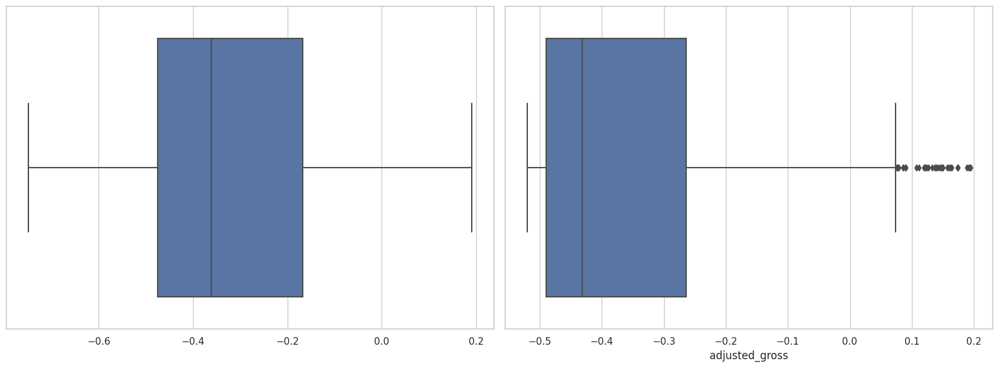

In [ ]:
fig, axes= plt.subplots(1,2,figsize=(16, 6))

sns.boxplot(x=(dfy_pred[dfy_pred<0.2]), ax=axes[0])
sns.boxplot(x=(dfy_test[dfy_test<0.2]), ax=axes[1])

plt.tight_layout()
plt.show()

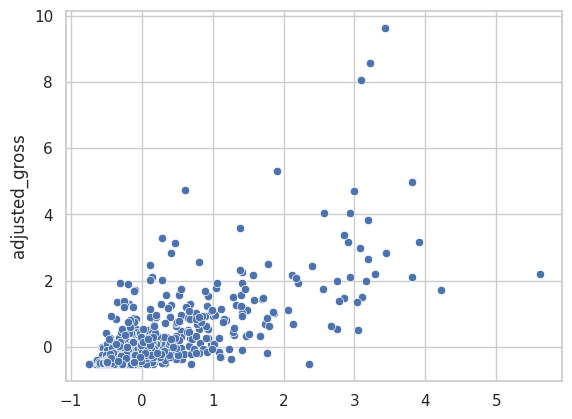

In [ ]:
sns.scatterplot(x=dfy_pred, y=dfy_test)
plt.show()
# binedge=np.linspace(1.9,9.3,75)
# sns.histplot(data[data['genre']=='adventure']['roi_in_%'], bins=binedge)
# plt.show

In [ ]:
dfx=datanormlogen.drop(['adjusted_gross','votes','score'],axis=1)
dfy=datanormlogen[['adjusted_gross','votes','score']]


dfx_train, dfx_test, dfy_train, dfy_test =train_test_split(dfx, dfy['adjusted_gross'], test_size=0.2, random_state=12)

In [ ]:
model = LinearRegression()

# Fit the model on the training data
model.fit(dfx_train, dfy_train)

# Make predictions on the test data
dfy_pred = model.predict(dfx_test)

# Evaluate the model using mean squared error (MSE)
mse = mean_squared_error(dfy_test, dfy_pred)
mae = mean_absolute_error(dfy_test, dfy_pred)
rmse = np.sqrt(mean_squared_error(dfy_test, dfy_pred))
r_squared = r2_score(dfy_test, dfy_pred)
epsilon = 1e-10
mape = mean_absolute_percentage_error(dfy_test + epsilon, dfy_pred)

print("Mean Absolute Error (MAE):", mae)
print("Root Mean Squared Error (RMSE):", rmse)
print("R-squared (R2):", r_squared)
print("Mean Absolute Percentage Error (MAPE):", mape)

Mean Absolute Error (MAE): 0.02135064670261864
Root Mean Squared Error (RMSE): 0.03802186334298678
R-squared (R2): 0.5593184965791139
Mean Absolute Percentage Error (MAPE): 52.79606613432374


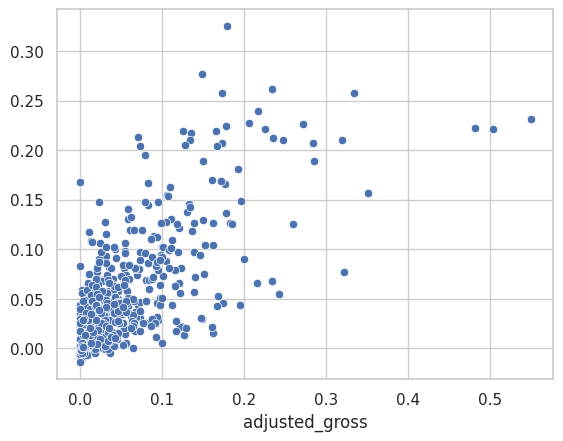

In [ ]:
sns.scatterplot(x=(dfy_test), y=(dfy_pred))
plt.show()

Mean Squared Error: 3.649683010174945e-05


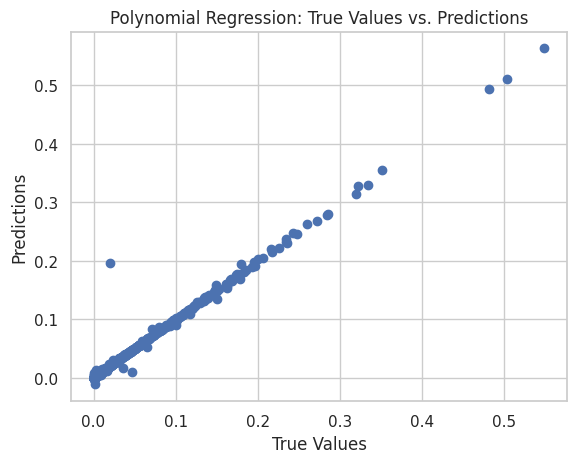

In [ ]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt



degree = 3
poly_features = PolynomialFeatures(degree=degree, include_bias=False)
X_train_poly = poly_features.fit_transform(dfx_train)
X_test_poly = poly_features.transform(dfx_test)


poly_reg = LinearRegression()
poly_reg.fit(X_train_poly, dfy_train)

# Make predictions on the test set
y_pred = poly_reg.predict(X_test_poly)

# Calculate Mean Squared Error
mse = mean_squared_error(dfy_test, y_pred)
print("Mean Squared Error:", mse)

# Plot the predicted values vs. the true values
plt.scatter(dfy_test, y_pred)
plt.xlabel("True Values")
plt.ylabel("Predictions")
plt.title("Polynomial Regression: True Values vs. Predictions")
plt.show()


### RandomForestRegressor

In [ ]:
# Import necessary libraries
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np

# Separate independent (X) and dependent (y) variables from the dataset
X = newdatastanlogen.drop(['adjusted_gross','votes','score','year'],axis=1)
y = newdatastanlogen[['adjusted_gross','votes','score']]

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y['adjusted_gross'], test_size=0.2, random_state=42)

# Initialize and train the Random Forest Regressor model
rf_regressor = RandomForestRegressor(n_estimators=100, random_state=42)
rf_regressor.fit(X_train, y_train)

# Predict the target variable on the testing set
y_pred = rf_regressor.predict(X_test)
y_trainpred = rf_regressor.predict(X_train)

# Calculate evaluation metrics
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
r_squared = r2_score(y_test, y_pred)
epsilon = 1e-10
mape = mean_absolute_percentage_error(y_test + epsilon, y_pred)
r_sq_test = r2_score(y_train, y_trainpred)

# Print the evaluation metrics
print("Mean Squared Error (MSE):", mse)
print("Mean Absolute Error (MAE):", mae)
print("Root Mean Squared Error (RMSE):", rmse)
print("R-squared (R2) test:", r_squared)
print("R-squared (R2) train:", r_sq_test)
print("Mean Absolute Percentage Error (MAPE):", mape)

Mean Squared Error (MSE): 0.003605867401853516
Mean Absolute Error (MAE): 0.013599091874826554
Root Mean Squared Error (RMSE): 0.06004887510897699
R-squared (R2) test: 0.9893088590855587
R-squared (R2) train: 0.9995907952366517
Mean Absolute Percentage Error (MAPE): 0.054380394574986064


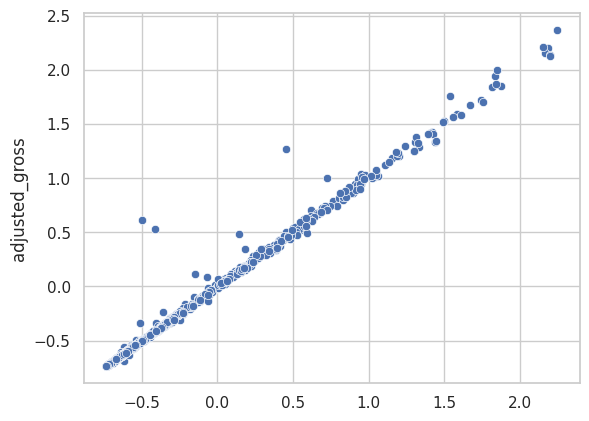

In [ ]:
sns.scatterplot(x=y_pred, y=y_test)
plt.show()

### DecisionTrees

In [ ]:
# Import necessary libraries
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score

# Separate independent (X) and dependent (y) variables from the dataset
X = newdatastanlogen.drop(['adjusted_gross','votes','score','year'],axis=1)
y = newdatastanlogen[['adjusted_gross','votes','score']]

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y['adjusted_gross'], test_size=0.2, random_state=42)

# Initialize and train the Decision Tree Regressor model
regressor = DecisionTreeRegressor()
regressor.fit(X_train, y_train)

# Predict the target variable on the testing set
y_pred = regressor.predict(X_test)
y_trainpred = regressor.predict(X_train)

# Calculate evaluation metrics
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
r_squared = r2_score(y_test, y_pred)
epsilon = 1e-10
mape = mean_absolute_percentage_error(y_test + epsilon, y_pred)
r_sq_test = r2_score(y_train, y_trainpred)

# Print the evaluation metrics
print("Mean Squared Error (MSE):", mse)
print("Mean Absolute Error (MAE):", mae)
print("Root Mean Squared Error (RMSE):", rmse)
print("R-squared (R2) test:", r_squared)
print("R-squared (R2) train:", r_sq_test)
print("Mean Absolute Percentage Error (MAPE):", mape)

Mean Squared Error (MSE): 0.004232865105474158
Mean Absolute Error (MAE): 0.02651355912328093
Root Mean Squared Error (RMSE): 0.0650604726809924
R-squared (R2) test: 0.9874498553964619
R-squared (R2) train: 1.0
Mean Absolute Percentage Error (MAPE): 0.11718912800123049


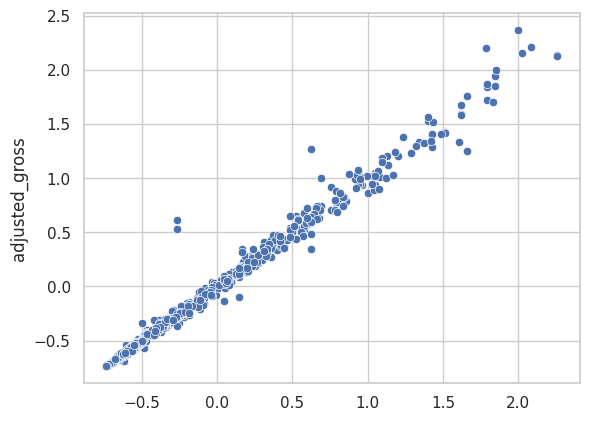

In [ ]:
sns.scatterplot(x=y_pred, y=y_test)
plt.show()

### Gradient Boosting

In [ ]:
!pip install xgboost

In [ ]:
# Import necessary libraries
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score

# Separate independent (X) and dependent (y) variables from the dataset
X = newdatastanlogen.drop(['adjusted_gross','votes','score','year'], axis=1)
y = newdatastanlogen[['adjusted_gross','votes','score']]

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y['adjusted_gross'], test_size=0.2, random_state=42)

# Initialize and train the XGBoost regressor model
xgb_regressor = xgb.XGBRegressor()
xgb_regressor.fit(X_train, y_train)

# Predict the target variable on the testing set
y_pred = xgb_regressor.predict(X_test)
y_trainpred = xgb_regressor.predict(X_train)

# Calculate evaluation metrics
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
r_squared = r2_score(y_test, y_pred)
epsilon = 1e-10
mape = mean_absolute_percentage_error(y_test + epsilon, y_pred)
r_sq_test = r2_score(y_train, y_trainpred)

# Print the evaluation metrics
print("Mean Squared Error (MSE):", mse)
print("Mean Absolute Error (MAE):", mae)
print("Root Mean Squared Error (RMSE):", rmse)
print("R-squared (R2) test:", r_squared)
print("R-squared (R2) train:", r_sq_test)
print("Mean Absolute Percentage Error (MAPE):", mape)

Mean Squared Error (MSE): 0.0033577199216120674
Mean Absolute Error (MAE): 0.01863722784782535
Root Mean Squared Error (RMSE): 0.0579458361024506
R-squared (R2) test: 0.9900445987518207
R-squared (R2) train: 0.9998142899251877
Mean Absolute Percentage Error (MAPE): 0.08622797314751116


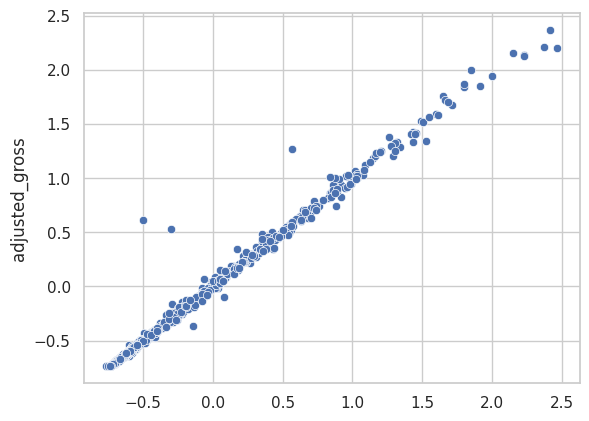

In [ ]:
sns.scatterplot(x=y_pred, y=y_test)
plt.show()

In [ ]:
# Create a DataFrame 'gros' containing the predicted adjusted gross values
gros = pd.DataFrame(y_pred, columns=['adjusted_gross'])

# Retrieve the adjusted budget values from X_test
bud = X_test['adjusted_budget']

# Reset index of the bud DataFrame to match with gros
bud.reset_index(drop=True, inplace=True)

# Concatenate adjusted budget and predicted adjusted gross DataFrames
revdata = pd.concat([bud, gros], axis=1)

# Reset index of the concatenated DataFrame
revdata.reset_index(drop=True, inplace=True)

# Convert the concatenated DataFrame values back to the original scale (non-log scale)
revdatanonlog = np.exp(revdata) - 1

# Inverse transform the data back to its original scale using the StandardScaler
revdatanonlogstan = pd.DataFrame(stan.inverse_transform(revdatanonlog), columns=logcolumns)

# Print the first few rows of the resulting DataFrame
print(revdatanonlogstan.head())

   adjusted_budget  adjusted_gross
0     8.375193e+06    1.720434e+07
1     1.240340e+07    1.441864e+05
2     2.290572e+07    3.851621e+06
3     5.267388e+06    1.609508e+07
4     1.243238e+07    4.251192e+07


In [ ]:
# data = {
#     'genre': ['Action', 'Drama', 'Comedy', 'Sci-Fi'],
#     'year': [2010, 2011, 2012, 2013],
#     'score': [None, None, None, None],
#     'votes': [None, None, None, None],
#     'released_year': [2009, 2010, 2011, 2012],
#     'adjusted_budget': [50000000, 60000000, 45000000, 70000000],
#     'adjusted_gross': [50000000, 60000000, 45000000, 70000000],
#     'roi_in_%': [None, None, None, None]
# }
# prediction=pd.DataFrame(data)
# prediction

## Model 2: Risk Rating Model

### Regression for Feature Importance

In [ ]:
pip install category_encoders

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.9/81.9 kB 875.4 kB/s eta 0:00:00


In [ ]:
pip install scikit-optimize

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 107.7/107.7 kB 2.0 MB/s eta 0:00:00


In [ ]:
data= merged_df

data= data.drop(['year', 'runtime_Category', 'score_bucket', 'profit_loss', 'net_profit', 'name', 'released_date'], axis = 1)

data.head()

,rating,genre,score,votes,director,writer,star,company,runtime,released_day_of_week,released_week_number,released_month,released_year,season,population,adjusted_budget,adjusted_gross,roi_in_%,fate,year_bin
0,R,Adventure,5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,Columbia Pictures,104.0,Wednesday,27,July,1980.0,Summer,223140018,1.432767e+06,2.821104e+07,1868.990939,Blockbuster,NaN
1,PG,Action,8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,Lucasfilm,124.0,Friday,25,June,1980.0,Summer,223140018,5.731066e+06,2.580683e+08,4402.972318,Blockbuster,NaN
2,PG,Comedy,7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,Paramount Pictures,88.0,Wednesday,27,July,1980.0,Summer,223140018,1.114374e+06,4.000318e+07,3489.744655,Blockbuster,NaN
3,R,Comedy,7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,Orion Pictures,98.0,Friday,30,July,1980.0,Summer,223140018,1.910355e+06,1.910022e+07,899.825187,Blockbuster,NaN
4,R,Horror,6.4,123000.0,Sean S. Cunningham,Victor Miller,Betsy Palmer,Paramount Pictures,95.0,Friday,19,May,1980.0,Spring,223140018,1.751159e+05,1.905624e+07,10782.070944,Blockbuster,NaN


In [ ]:
# Checking cardinality of each column
# Initialize an empty dictionary to store the cardinality of each column
cardinality = {}

# Loop through each column in the DataFrame
for column in data.columns:
    # Count the number of unique values in the column
    unique_values = data[column].nunique()
    # Store the count in the dictionary
    cardinality[column] = unique_values

# Print the cardinality of each column
for column, unique_count in cardinality.items():
    print(f"The column '{column}' has {unique_count} unique values.")

The column 'rating' has 6 unique values.
The column 'genre' has 14 unique values.
The column 'score' has 72 unique values.
The column 'votes' has 775 unique values.
The column 'director' has 1999 unique values.
The column 'writer' has 3054 unique values.
The column 'star' has 1769 unique values.
The column 'company' has 1267 unique values.
The column 'runtime' has 118 unique values.
The column 'released_day_of_week' has 7 unique values.
The column 'released_week_number' has 53 unique values.
The column 'released_month' has 12 unique values.
The column 'released_year' has 41 unique values.
The column 'season' has 4 unique values.
The column 'population' has 40 unique values.
The column 'adjusted_budget' has 2148 unique values.
The column 'adjusted_gross' has 5011 unique values.
The column 'roi_in_%' has 5040 unique values.
The column 'fate' has 5 unique values.
The column 'year_bin' has 7 unique values.


#### CatBoost Regressor on Gross


In [ ]:
!pip install catboost

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.5/98.5 MB 2.3 MB/s eta 0:00:00


In [ ]:
# Encoding categorical variables
categorical_variables = ['fate']
data_encoded = pd.get_dummies(data, columns=categorical_variables)
df= data_encoded
df= df.drop(['population', 'rating',  'released_day_of_week', 'released_month', 'season', 'genre', 'released_year'],axis=1)

In [ ]:
df = df.drop(['director', 'writer', 'star', 'company', 'year_bin'], axis=1)
df.head()

,score,votes,runtime,released_week_number,adjusted_budget,adjusted_gross,roi_in_%,fate_Bomb,fate_Flop,fate_Average,fate_Hit,fate_Blockbuster
0,5.8,65000.0,104.0,27,1.432767e+06,2.821104e+07,1868.990939,False,False,False,False,True
1,8.7,1200000.0,124.0,25,5.731066e+06,2.580683e+08,4402.972318,False,False,False,False,True
2,7.7,221000.0,88.0,27,1.114374e+06,4.000318e+07,3489.744655,False,False,False,False,True
3,7.3,108000.0,98.0,30,1.910355e+06,1.910022e+07,899.825187,False,False,False,False,True
4,6.4,123000.0,95.0,19,1.751159e+05,1.905624e+07,10782.070944,False,False,False,False,True


In [ ]:
from sklearn.model_selection import train_test_split

# Splitting Data
y = df['adjusted_gross']  # Target variable
X = df.drop(['adjusted_gross', 'score', 'votes', 'runtime', 'released_week_number'], axis=1)  # Features

# Train-Test Split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Applying log transformation with a small constant to target variable
small_constant = 0.01
y_train_log = np.log(y_train.values.reshape(-1, 1) + small_constant)
y_test_log = np.log(y_test.values.reshape(-1, 1) + small_constant)

In [ ]:
# Checking for NaN values in the transformed target variable
nan_in_y_train_log = np.isnan(y_train_log).any()
nan_in_y_test_log = np.isnan(y_test_log).any()

print("NaN in y_train_log:", nan_in_y_train_log)
print("NaN in y_test_log:", nan_in_y_test_log)

NaN in y_train_log: False
NaN in y_test_log: False


In [ ]:
# Initialize DataFrames to store metrics and feature importances
metrics_df = pd.DataFrame(columns=['Model', 'MAPE', 'RMSE', 'MAE', 'MSE', 'R-squared'])
model_names = ['CatBoostRegressor',	'CatBoostRegressor-HYP',	'LGBMRegressor_Default',	'DecisionTreeRegressor',	'DecisionTreeRegressor-HYP',	'XGBoostRegressor',	'XGBoostRegressor-HYP',	'GradientBoostingRegressor',	'GradientBoostingRegressor-HYP',	'ExtraTreesRegressor',	'ExtraTreesRegressor-HYP',	'RandomForestRegressor',	'RandomForestRegressor-HYP']
feature_importances_df = pd.DataFrame(index=X.columns, columns=model_names)

In [ ]:
print(type(metrics_df))

<class 'pandas.core.frame.DataFrame'>


In [ ]:
from catboost import CatBoostRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Initialize CatBoostRegressor
cb_regressor = CatBoostRegressor(random_state=42, verbose=0)  # 'verbose=0' to silence training output

# Train the model with the log-transformed target
cb_regressor.fit(X_train, y_train_log)

# Make predictions (these will be on the log scale)
y_pred_log = cb_regressor.predict(X_test)

# Convert predictions back to the original scale
y_pred = np.exp(y_pred_log) - small_constant

# Calculate metrics on the original scale
metrics_cb = {
    'Model': 'CatBoostRegressor',
    'MAPE': np.mean(np.abs((y_test - y_pred) / y_test)) * 100,
    'RMSE': np.sqrt(mean_squared_error(y_test, y_pred)),
    'MAE': mean_absolute_error(y_test, y_pred),
    'MSE': mean_squared_error(y_test, y_pred),
    'R-squared': r2_score(y_test, y_pred)
}

# Store metrics in a DataFrame (assuming 'metrics_df' is already defined)
metrics_cb_df = pd.DataFrame([metrics_cb])
metrics_df = pd.concat([metrics_df, metrics_cb_df], ignore_index=True)

# Store feature importances in a DataFrame (assuming 'feature_importances_df' is already defined)
feature_importances_df['CatBoostRegressor'] = cb_regressor.feature_importances_

In [ ]:
from sklearn.model_selection import train_test_split, GridSearchCV

# Define the parameter grid for CatBoostRegressor
param_grid = {
    'depth': [4, 6, 8],
    'learning_rate': [0.01, 0.05, 0.1],
    'iterations': [30, 50, 100]
}

# Initialize the CatBoostRegressor
cb = CatBoostRegressor(random_state=42)

# Initialize GridSearchCV
grid_search = GridSearchCV(estimator=cb, param_grid=param_grid, cv=3, n_jobs=-1, scoring='neg_mean_squared_error', verbose=0)

# Fit GridSearchCV with the log-transformed target
grid_search.fit(X_train, y_train_log)

# Print the best parameters
print("Best parameters found: ", grid_search.best_params_)

# Train CatBoostRegressor with the best parameters
best_cb = grid_search.best_estimator_

# Make predictions (these will be on the log scale)
y_pred_log = best_cb.predict(X_test)

# Convert predictions back to the original scale
y_pred = np.exp(y_pred_log) - small_constant

# Calculate metrics on the original scale
metrics_cb_tuned = {
    'Model': 'CatBoostRegressor-HYP',
    'MAPE': np.mean(np.abs((y_test - y_pred) / y_test)) * 100,
    'RMSE': np.sqrt(mean_squared_error(y_test, y_pred)),
    'MAE': mean_absolute_error(y_test, y_pred),
    'MSE': mean_squared_error(y_test, y_pred),
    'R-squared': r2_score(y_test, y_pred)
}

# Assuming 'metrics_df' and 'feature_importances_df' are the DataFrames initialized previously
metrics_cb_df = pd.DataFrame([metrics_cb_tuned])
metrics_df = pd.concat([metrics_df, metrics_cb_df], ignore_index=True)
feature_importances_df['CatBoostRegressor-HYP'] = best_cb.get_feature_importance()

0:	learn: 1.8228310	total: 4.63ms	remaining: 459ms
1:	learn: 1.6838952	total: 8.88ms	remaining: 435ms
2:	learn: 1.5493992	total: 12.4ms	remaining: 401ms
3:	learn: 1.4323539	total: 16ms	remaining: 384ms
4:	learn: 1.3299456	total: 20.8ms	remaining: 394ms
5:	learn: 1.2275177	total: 23.1ms	remaining: 362ms
6:	learn: 1.1376333	total: 26.6ms	remaining: 353ms
7:	learn: 1.0525014	total: 30.3ms	remaining: 349ms
8:	learn: 0.9765844	total: 33.9ms	remaining: 342ms
9:	learn: 0.9089199	total: 37.4ms	remaining: 336ms
10:	learn: 0.8439939	total: 40.9ms	remaining: 331ms
11:	learn: 0.7843528	total: 44.3ms	remaining: 325ms
12:	learn: 0.7348018	total: 50.1ms	remaining: 336ms
13:	learn: 0.6857044	total: 53.7ms	remaining: 330ms
14:	learn: 0.6433040	total: 57.4ms	remaining: 325ms
15:	learn: 0.6046906	total: 60.9ms	remaining: 319ms
16:	learn: 0.5679634	total: 64.4ms	remaining: 314ms
17:	learn: 0.5368346	total: 67.7ms	remaining: 309ms
18:	learn: 0.5054607	total: 71.3ms	remaining: 304ms
19:	learn: 0.4741659	tot

#### Light GBM on Gross

In [ ]:
!pip install lightgbm

In [ ]:
from lightgbm import LGBMRegressor

# Initialize LGBMRegressor with default parameters
lgbm = LGBMRegressor(random_state=42)

# Fit the model on the  log-transformed training data
lgbm.fit(X_train, y_train_log)

# Make predictions on the test data (predictions will be on the log scale)
y_pred_log = lgbm.predict(X_test)

# Convert predictions back to the original scale
y_pred = np.exp(y_pred_log) - small_constant

# Calculate evaluation metrics on the original scale
metrics_lgbm = {
    'Model': 'LGBMRegressor_Default',
    'MAPE': np.mean(np.abs((y_test - y_pred) / y_test)) * 100,
    'RMSE': np.sqrt(mean_squared_error(y_test, y_pred)),
    'MAE': mean_absolute_error(y_test, y_pred),
    'MSE': mean_squared_error(y_test, y_pred),
    'R-squared': r2_score(y_test, y_pred)
}

# Assuming 'metrics_df' and 'feature_importances_df' are the DataFrames initialized previously
metrics_lgbm_df = pd.DataFrame([metrics_lgbm])
metrics_df = pd.concat([metrics_df, metrics_lgbm_df], ignore_index=True)
feature_importances_df['LGBMRegressor_Default'] = lgbm.feature_importances_

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000374 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 520
[LightGBM] [Info] Number of data points in the train set: 4041, number of used features: 7
[LightGBM] [Info] Start training from score 16.820258


#### Decision Tree Regressor on Gross

In [ ]:
from sklearn.tree import DecisionTreeRegressor

# Initialize the Decision Tree Regressor with default parameters
dt_regressor = DecisionTreeRegressor(random_state=42)

# Fit the model on the log-transformed training data
dt_regressor.fit(X_train, y_train_log)

# Make predictions on the test data (predictions will be on the log scale)
y_pred_log = dt_regressor.predict(X_test)

# Convert predictions back to the original scale
y_pred = np.exp(y_pred_log) - small_constant

# Calculate metrics on the original scale
mape = np.mean(np.abs((y_test - y_pred) / y_test)) * 100
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# Update metrics DataFrame with the Decision Tree Regressor's metrics
metrics_dt = {
    'Model': 'DecisionTreeRegressor',
    'MAPE': mape,
    'RMSE': rmse,
    'MAE': mae,
    'MSE': mse,
    'R-squared': r2
}

# Assuming 'metrics_df' is your DataFrame for storing metrics
metrics_dt_df = pd.DataFrame([metrics_dt])
metrics_df = pd.concat([metrics_df, metrics_dt_df], ignore_index=True)

# Assuming 'feature_importances_df' is your DataFrame for storing feature importances
feature_importances_df['DecisionTreeRegressor'] = dt_regressor.feature_importances_

In [ ]:
# Define the parameter grid for hyperparameter tuning
param_grid = {
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Initialize the Decision Tree Regressor
dtree = DecisionTreeRegressor(random_state=42)

# Initialize GridSearchCV
grid_search = GridSearchCV(estimator=dtree, param_grid=param_grid, cv=3, scoring='neg_mean_squared_error', n_jobs=-1)

# Fit GridSearchCV with the log-transformed target
grid_search.fit(X_train, y_train_log)

# Get the best estimator
best_dtree = grid_search.best_estimator_

# Make predictions with the best estimator (predictions will be on the log scale)
y_pred_log = best_dtree.predict(X_test)

# Convert predictions back to the original scale
y_pred = np.exp(y_pred_log) - small_constant

# Calculate the metrics on the original scale
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)
mape = np.mean(np.abs((y_test - y_pred) / y_test)) * 100

# Update the metrics DataFrame
new_row = pd.DataFrame({
    'Model': ['DecisionTreeRegressor-HYP'],
    'MAPE': [mape],
    'RMSE': [rmse],
    'MAE': [mae],
    'MSE': [mse],
    'R-squared': [r2]
})

metrics_df = pd.concat([metrics_df, new_row], ignore_index=True)

# Update the feature importances DataFrame
feature_importances_df['DecisionTreeRegressor-HYP'] = best_dtree.feature_importances_

#### XGBoost Regressor on Gross

In [ ]:
!pip install xgboost

In [ ]:
import xgboost as xgb

# Initialize the XGBoost Regressor with default parameters
xgb_reg = xgb.XGBRegressor(random_state=42, objective='reg:squarederror')

# Fit the model on the log-transformed training data
xgb_reg.fit(X_train, y_train_log)

# Make predictions on the test data (predictions will be on the log scale)
y_pred_log = xgb_reg.predict(X_test)

# Convert predictions back to the original scale
y_pred = np.exp(y_pred_log) - small_constant

# Calculate the metrics on the original scale
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)
mape = np.mean(np.abs((y_test - y_pred) / y_test)) * 100

# Update the metrics DataFrame
new_row = pd.DataFrame({
    'Model': ['XGBoostRegressor'],
    'MAPE': [mape],
    'RMSE': [rmse],
    'MAE': [mae],
    'MSE': [mse],
    'R-squared': [r2]
})

metrics_df = pd.concat([metrics_df, new_row], ignore_index=True)

# Update the feature importances DataFrame
# Convert feature importances to a Series for easier DataFrame operation
feature_importances_series = pd.Series(xgb_reg.feature_importances_, index=X_train.columns)
feature_importances_df['XGBoostRegressor'] = feature_importances_series

In [ ]:
# Define the hyperparameter grid to search
param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [3, 6, 9],
    'learning_rate': [0.01, 0.1],
    'colsample_bytree': [0.8, 1.0],
    'subsample': [0.8, 1.0]
}

# Initialize the XGBoost regressor
xgb_reg = xgb.XGBRegressor(random_state=42, objective='reg:squarederror')

# Initialize the GridSearchCV object
grid_search = GridSearchCV(estimator=xgb_reg, param_grid=param_grid, cv=3, scoring='neg_mean_squared_error', n_jobs=-1, verbose=2)

# Fit the GridSearchCV object to the log-transformed training data
grid_search.fit(X_train, y_train_log)

# Print the best parameters found by GridSearchCV
print("Best parameters found: ", grid_search.best_params_)

# Retrieve the best estimator (model with the best parameters)
best_xgb_reg = grid_search.best_estimator_

# Make predictions with the best estimator (predictions will be on the log scale)
y_pred_log = best_xgb_reg.predict(X_test)

# Convert predictions back to the original scale
y_pred = np.exp(y_pred_log) - small_constant

# Calculate the metrics on the original scale
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)
mape = np.mean(np.abs((y_test - y_pred) / y_test)) * 100

# Update the metrics DataFrame
new_row = pd.DataFrame({
    'Model': ['XGBoostRegressor-HYP'],
    'MAPE': [mape],
    'RMSE': [rmse],
    'MAE': [mae],
    'MSE': [mse],
    'R-squared': [r2]
})

metrics_df = pd.concat([metrics_df, new_row], ignore_index=True)

# Update the feature importances DataFrame
feature_importances_series = pd.Series(best_xgb_reg.feature_importances_, index=X_train.columns)
feature_importances_df['XGBoostRegressor-HYP'] = feature_importances_series

Fitting 3 folds for each of 48 candidates, totalling 144 fits
Best parameters found:  {'colsample_bytree': 0.8, 'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 200, 'subsample': 1.0}


#### Gradient Boosting Regressor on Gross

In [ ]:
from sklearn.ensemble import GradientBoostingRegressor

# Initialize the Gradient Boosting Regressor with default parameters
gbr = GradientBoostingRegressor(random_state=42)

# Fit the model on the log-transformed training data
gbr.fit(X_train, y_train_log)

# Make predictions on the test data (predictions will be on the log scale)
y_pred_log = gbr.predict(X_test)

# Convert predictions back to the original scale
y_pred = np.exp(y_pred_log) - small_constant

# Calculate the metrics on the original scale
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)
mape = np.mean(np.abs((y_test - y_pred) / y_test)) * 100

# Update the metrics DataFrame
new_row = pd.DataFrame({
    'Model': ['GradientBoostingRegressor'],
    'MAPE': [mape],
    'RMSE': [rmse],
    'MAE': [mae],
    'MSE': [mse],
    'R-squared': [r2]
})

metrics_df = pd.concat([metrics_df, new_row], ignore_index=True)


# Update the feature importances DataFrame
feature_importances_series = pd.Series(gbr.feature_importances_, index=X_train.columns)
feature_importances_df['GradientBoostingRegressor'] = feature_importances_series

In [ ]:
# Define the hyperparameter grid to search
param_grid = {
    'n_estimators': [100, 200],
    'learning_rate': [0.01, 0.1],
    'max_depth': [3, 4, 5],
    'min_samples_split': [2, 3],
    'min_samples_leaf': [1, 2]
}

# Initialize the Gradient Boosting Regressor
gbr = GradientBoostingRegressor(random_state=42)

# Initialize the GridSearchCV object
grid_search = GridSearchCV(estimator=gbr, param_grid=param_grid, cv=3, scoring='neg_mean_squared_error', n_jobs=-1, verbose=2)

# Fit the GridSearchCV object to the log-transformed training data
grid_search.fit(X_train, y_train_log)

# Print the best parameters found by GridSearchCV
print("Best parameters found: ", grid_search.best_params_)

# Retrieve the best estimator (model with the best parameters)
best_gbr = grid_search.best_estimator_

# Make predictions with the best estimator (predictions will be on the log scale)
y_pred_log = best_gbr.predict(X_test)

# Convert predictions back to the original scale
y_pred = np.exp(y_pred_log) - small_constant

# Calculate the metrics on the original scale
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)
mape = np.mean(np.abs((y_test - y_pred) / y_test)) * 100

# Update the metrics DataFrame
new_row = pd.DataFrame({
    'Model': ['GradientBoostingRegressor-HYP'],
    'MAPE': [mape],
    'RMSE': [rmse],
    'MAE': [mae],
    'MSE': [mse],
    'R-squared': [r2]
})

metrics_df = pd.concat([metrics_df, new_row], ignore_index=True)


# Update the feature importances DataFrame
feature_importances_series = pd.Series(best_gbr.feature_importances_, index=X_train.columns)
feature_importances_df['GradientBoostingRegressor-HYP'] = feature_importances_series

Fitting 3 folds for each of 48 candidates, totalling 144 fits
Best parameters found:  {'learning_rate': 0.1, 'max_depth': 5, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 200}


#### Extra Trees Regressor on Gross

In [ ]:
from sklearn.ensemble import ExtraTreesRegressor

# Initialize the Extra Trees Regressor with default parameters
etr = ExtraTreesRegressor(random_state=42)

# Fit the model on the log-transformed training data
etr.fit(X_train, y_train_log)

# Make predictions on the test data (predictions will be on the log scale)
y_pred_log = etr.predict(X_test)

# Convert predictions back to the original scale
y_pred = np.exp(y_pred_log) - small_constant

# Calculate the metrics on the original scale
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)
mape = np.mean(np.abs((y_test - y_pred) / y_test)) * 100

# Update the metrics DataFrame
new_row = pd.DataFrame({
    'Model': ['ExtraTreesRegressor'],
    'MAPE': [mape],
    'RMSE': [rmse],
    'MAE': [mae],
    'MSE': [mse],
    'R-squared': [r2]
})

metrics_df = pd.concat([metrics_df, new_row], ignore_index=True)

# Update the feature importances DataFrame
feature_importances_series = pd.Series(etr.feature_importances_, index=X_train.columns)
feature_importances_df['ExtraTreesRegressor'] = feature_importances_series

In [ ]:
# Define the hyperparameter grid to search
param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 4],
    'min_samples_leaf': [1, 2]
}

# Initialize the Extra Trees Regressor
etr = ExtraTreesRegressor(random_state=42)

# Initialize the GridSearchCV object
grid_search = GridSearchCV(estimator=etr, param_grid=param_grid, cv=3, scoring='neg_mean_squared_error', n_jobs=-1, verbose=2)

# Fit the GridSearchCV object to the log-transformed training data
grid_search.fit(X_train, y_train_log)

# Print the best parameters found by GridSearchCV
print("Best parameters found: ", grid_search.best_params_)

# Retrieve the best estimator (model with the best parameters)
best_etr = grid_search.best_estimator_

# Make predictions with the best estimator (predictions will be on the log scale)
y_pred_log = best_etr.predict(X_test)

# Convert predictions back to the original scale
y_pred = np.exp(y_pred_log) - small_constant

# Calculate the metrics on the original scale
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)
mape = np.mean(np.abs((y_test - y_pred) / y_test)) * 100

# Update the metrics DataFrame
new_row = pd.DataFrame({
    'Model': ['ExtraTreesRegressor-HYP'],
    'MAPE': [mape],
    'RMSE': [rmse],
    'MAE': [mae],
    'MSE': [mse],
    'R-squared': [r2]
})

metrics_df = pd.concat([metrics_df, new_row], ignore_index=True)


# Update the feature importances DataFrame
feature_importances_series = pd.Series(best_etr.feature_importances_, index=X_train.columns)
feature_importances_df['ExtraTreesRegressor-HYP'] = feature_importances_series

Fitting 3 folds for each of 24 candidates, totalling 72 fits
Best parameters found:  {'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}


#### Adaptive Boosting Regressor on Gross

In [ ]:
from sklearn.ensemble import AdaBoostRegressor
from sklearn.tree import DecisionTreeRegressor

# Initialize the AdaBoost Regressor with default parameters
# Using DecisionTreeRegressor as the default base estimator
ada_reg = AdaBoostRegressor(base_estimator=DecisionTreeRegressor(), random_state=42)

# Fit the model on the log-transformed training data
ada_reg.fit(X_train, y_train_log)

# Make predictions on the test data (predictions will be on the log scale)
y_pred_log = ada_reg.predict(X_test)

# Convert predictions back to the original scale
y_pred = np.exp(y_pred_log) - small_constant

# Calculate the metrics on the original scale
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)
mape = np.mean(np.abs((y_test - y_pred) / y_test)) * 100

# Update the metrics DataFrame
new_row = pd.DataFrame({
    'Model': ['AdaBoostRegressor'],
    'MAPE': [mape],
    'RMSE': [rmse],
    'MAE': [mae],
    'MSE': [mse],
    'R-squared': [r2]
})

metrics_df = pd.concat([metrics_df, new_row], ignore_index=True)

# Note: AdaBoost does not provide a straightforward way to access feature importances like tree-based models
# Hence, we can't update the feature_importances_df in this case

In [ ]:
# Define the hyperparameter grid to search
param_grid = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 1.0],
    'base_estimator__max_depth': [1, 2, 3],
    'base_estimator__min_samples_split': [2, 4]
}

# Initialize the AdaBoost Regressor with a DecisionTreeRegressor as its base estimator
ada_reg = AdaBoostRegressor(base_estimator=DecisionTreeRegressor(), random_state=42)

# Initialize the GridSearchCV object
grid_search = GridSearchCV(estimator=ada_reg, param_grid=param_grid, cv=3, scoring='neg_mean_squared_error', n_jobs=-1, verbose=2)

# Fit the GridSearchCV object to the log-transformed training data
grid_search.fit(X_train, y_train_log)

# Print the best parameters found by GridSearchCV
print("Best parameters found: ", grid_search.best_params_)

# Retrieve the best estimator (model with the best parameters)
best_ada_reg = grid_search.best_estimator_

# Make predictions with the best estimator (predictions will be on the log scale)
y_pred_log = best_ada_reg.predict(X_test)

# Convert predictions back to the original scale
y_pred = np.exp(y_pred_log) - small_constant

# Calculate the metrics on the original scale
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)
mape = np.mean(np.abs((y_test - y_pred) / y_test)) * 100

# Update the metrics DataFrame
new_row = pd.DataFrame({
    'Model': ['AdaBoostRegressor-HYP'],
    'MAPE': [mape],
    'RMSE': [rmse],
    'MAE': [mae],
    'MSE': [mse],
    'R-squared': [r2]
})

metrics_df = pd.concat([metrics_df, new_row], ignore_index=True)


Fitting 3 folds for each of 54 candidates, totalling 162 fits
Best parameters found:  {'base_estimator__max_depth': 3, 'base_estimator__min_samples_split': 2, 'learning_rate': 1.0, 'n_estimators': 100}


#### Bagging Regressor on Gross

In [ ]:
from sklearn.ensemble import BaggingRegressor

# Initialize the Bagging Regressor with default parameters
bag_reg = BaggingRegressor(random_state=42)

# Fit the model on the log-transformed training data
bag_reg.fit(X_train, y_train_log)

# Make predictions on the test data (predictions will be on the log scale)
y_pred_log = bag_reg.predict(X_test)

# Convert predictions back to the original scale
y_pred = np.exp(y_pred_log) - small_constant

# Calculate the metrics on the original scale
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)
mape = np.mean(np.abs((y_test - y_pred) / y_test)) * 100

# Update the metrics DataFrame
new_row = pd.DataFrame({
    'Model': ['BaggingRegressor'],
    'MAPE': [mape],
    'RMSE': [rmse],
    'MAE': [mae],
    'MSE': [mse],
    'R-squared': [r2]
})

metrics_df = pd.concat([metrics_df, new_row], ignore_index=True)


# Note: The Bagging Regressor does not provide a direct way to access feature importances

In [ ]:
# Define the hyperparameter grid to search
param_grid = {
    'n_estimators': [10, 50, 100],
    'max_samples': [0.5, 1.0],  # Fraction of samples for each base estimator
    'max_features': [0.5, 1.0]  # Fraction of features for each base estimator
}

# Initialize the Bagging Regressor
bag_reg = BaggingRegressor(random_state=42)

# Initialize the GridSearchCV object
grid_search = GridSearchCV(estimator=bag_reg, param_grid=param_grid, cv=3, scoring='neg_mean_squared_error', n_jobs=-1, verbose=2)

# Fit the GridSearchCV object to the log-transformed training data
grid_search.fit(X_train, y_train_log)

# Print the best parameters found by GridSearchCV
print("Best parameters found: ", grid_search.best_params_)

# Retrieve the best estimator (model with the best parameters)
best_bag_reg = grid_search.best_estimator_

# Make predictions with the best estimator (predictions will be on the log scale)
y_pred_log = best_bag_reg.predict(X_test)

# Convert predictions back to the original scale
y_pred = np.exp(y_pred_log) - small_constant

# Calculate the metrics on the original scale
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)
mape = np.mean(np.abs((y_test - y_pred) / y_test)) * 100

# Update the metrics DataFrame
new_row = pd.DataFrame({
    'Model': ['BaggingRegressor_Tuned'],
    'MAPE': [mape],
    'RMSE': [rmse],
    'MAE': [mae],
    'MSE': [mse],
    'R-squared': [r2]
})

metrics_df = pd.concat([metrics_df, new_row], ignore_index=True)


Fitting 3 folds for each of 12 candidates, totalling 36 fits
Best parameters found:  {'max_features': 1.0, 'max_samples': 1.0, 'n_estimators': 100}


#### Random Forest Regressor on Gross

In [ ]:
from sklearn.ensemble import RandomForestRegressor

# Train and Evaluate RandomForestRegressor
rf_regressor = RandomForestRegressor(random_state=42)
rf_regressor.fit(X_train, y_train_log)
y_pred_log = rf_regressor.predict(X_test)
# Convert predictions back to the original scale
y_pred = np.exp(y_pred_log) - small_constant

# Calculate metrics on the original scale
metrics_rf = {
    'Model': 'RandomForestRegressor',
    'MAPE': np.mean(np.abs((y_test - y_pred) / y_test)) * 100,
    'RMSE': np.sqrt(mean_squared_error(y_test, y_pred)),
    'MAE': mean_absolute_error(y_test, y_pred),
    'MSE': mean_squared_error(y_test, y_pred),
    'R-squared': r2_score(y_test, y_pred)
}

# Store metrics and feature importances
metrics_rf_df = pd.DataFrame([metrics_rf])
metrics_df = pd.concat([metrics_df, metrics_rf_df], ignore_index=True)
feature_importances_df['RandomForestRegressor'] = rf_regressor.feature_importances_

In [ ]:
from skopt import BayesSearchCV  # Import BayesSearchCV
from skopt.space import Real, Categorical, Integer  # Import types of search space

np.int = int

# Define the search space
search_space = {
    'n_estimators': Integer(100, 700),
    'max_depth': Integer(2, 20),
    'min_samples_split': Integer(2, 11),
    'min_samples_leaf': Integer(1, 11)
}

# Initialize the Random Forest Regressor
rf_regressor = RandomForestRegressor(random_state=42)

# Initialize BayesSearchCV with the defined search space and model
bayes_search = BayesSearchCV(
    estimator=rf_regressor,
    search_spaces=search_space,
    n_iter=75,  # Number of parameter settings sampled, increase for more thorough search
    cv=5,
    scoring='neg_mean_squared_error',
    n_jobs=-1,
    random_state=42
)

# Fit BayesSearchCV to the log-transformed data
bayes_search.fit(X_train, y_train_log)

# Best parameters and model
best_params = bayes_search.best_params_
print("Best Parameters:", best_params)
best_rf = bayes_search.best_estimator_

# Model evaluation with predictions on the log scale
y_pred_log = best_rf.predict(X_test)

# Convert predictions back to the original scale
y_pred = np.exp(y_pred_log) - small_constant

# Calculate metrics on the original scale
metrics_rf_bayes = {
    'Model': 'RandomForestRegressor-HYP',
    'MAPE': np.mean(np.abs((y_test - y_pred) / y_test)) * 100,
    'RMSE': np.sqrt(mean_squared_error(y_test, y_pred)),
    'MAE': mean_absolute_error(y_test, y_pred),
    'MSE': mean_squared_error(y_test, y_pred),
    'R-squared': r2_score(y_test, y_pred)
}

# Store metrics and feature importances
metrics_rf_bayes_df = pd.DataFrame([metrics_rf_bayes])
metrics_df = pd.concat([metrics_df, metrics_rf_bayes_df], ignore_index=True)
feature_importances_df['RandomForestRegressor-HYP'] = best_rf.feature_importances_

Best Parameters: OrderedDict([('max_depth', 14), ('min_samples_leaf', 1), ('min_samples_split', 2), ('n_estimators', 700)])


### Display the Metrics and Feature Importances

In [ ]:
metrics_df

,Model,MAPE,RMSE,MAE,MSE,R-squared
0,CatBoostRegressor,5.233592,3.043987e+07,3.324583e+06,9.265855e+14,0.971317
1,CatBoostRegressor-HYP,10.115272,4.930472e+07,6.849177e+06,2.430956e+15,0.924749
2,LGBMRegressor_Default,8.082859,4.639448e+07,5.648011e+06,2.152448e+15,0.933371
3,DecisionTreeRegressor,9.091737,4.543748e+07,7.305353e+06,2.064564e+15,0.936091
4,DecisionTreeRegressor-HYP,9.091737,4.543748e+07,7.305353e+06,2.064564e+15,0.936091
5,XGBoostRegressor,6.977751,2.712150e+07,4.523624e+06,7.355757e+14,0.977230
6,XGBoostRegressor-HYP,7.577775,3.501345e+07,5.758817e+06,1.225942e+15,0.962051
7,GradientBoostingRegressor,9.149598,3.989254e+07,7.184918e+06,1.591415e+15,0.950737
8,GradientBoostingRegressor-HYP,6.994421,3.120155e+07,4.734895e+06,9.735370e+14,0.969864
9,ExtraTreesRegressor,3.682309,3.213503e+07,2.754770e+06,1.032660e+15,0.968034


In [ ]:
feature_importances_df

,CatBoostRegressor,CatBoostRegressor-HYP,LGBMRegressor_Default,DecisionTreeRegressor,DecisionTreeRegressor-HYP,XGBoostRegressor,XGBoostRegressor-HYP,GradientBoostingRegressor,GradientBoostingRegressor-HYP,ExtraTreesRegressor,ExtraTreesRegressor-HYP,RandomForestRegressor,RandomForestRegressor-HYP
adjusted_budget,45.467273,46.337341,1563,3.388685e-01,3.388685e-01,0.286827,0.148176,0.336825,0.334294,0.332070,0.331609,0.332299,0.333458
roi_in_%,46.072634,43.753624,1426,6.610649e-01,6.610649e-01,0.637833,0.167003,0.663175,0.665607,0.181987,0.182472,0.667561,0.666365
fate_Bomb,3.823019,4.340563,0,9.033614e-07,9.033614e-07,0.000000,0.328500,0.000000,0.000001,0.412376,0.412376,0.000018,0.000019
fate_Flop,0.088127,0.090011,1,4.047024e-06,4.047024e-06,0.000341,0.016521,0.000000,0.000009,0.000543,0.000567,0.000022,0.000022
fate_Average,0.152404,0.245191,5,1.880100e-05,1.880100e-05,0.000701,0.000921,0.000000,0.000011,0.000594,0.000550,0.000034,0.000039
fate_Hit,0.270996,0.351850,4,1.539487e-05,1.539487e-05,0.000628,0.089468,0.000000,0.000001,0.009047,0.008756,0.000037,0.000040
fate_Blockbuster,4.125547,4.881420,1,2.750567e-05,2.750567e-05,0.073669,0.249411,0.000000,0.000076,0.063382,0.063669,0.000028,0.000057


###  Analysing the Feature Importance of the Chosen Model

In [ ]:
model_name = 'RandomForestRegressor-HYP'
model = best_rf

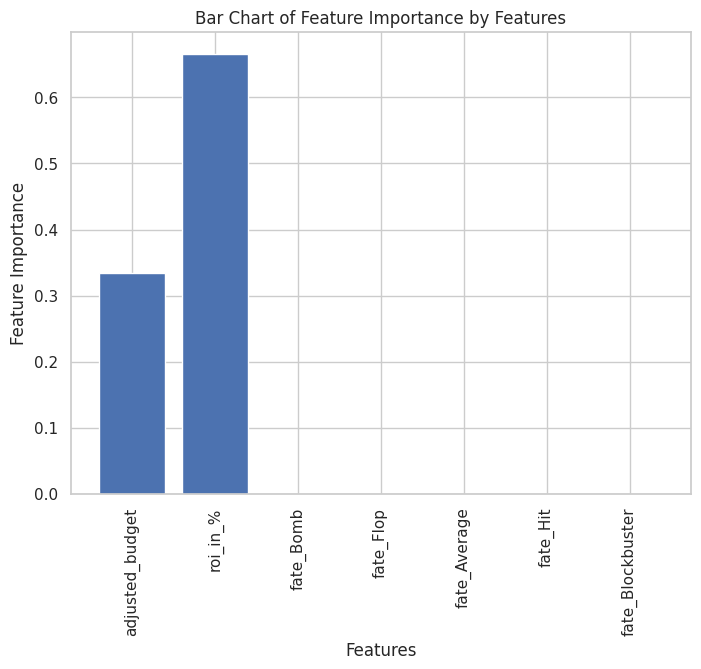

In [ ]:
# Plotting
plt.figure(figsize=(8, 6))  # Optional: Adjust figure size
plt.bar(x=feature_importances_df.index, height=feature_importances_df['RandomForestRegressor-HYP'])
plt.xticks(rotation=90)

# Adding labels and title
plt.xlabel('Features')
plt.ylabel('Feature Importance')
plt.title('Bar Chart of Feature Importance by Features')

# Show plot
plt.show()

### Assigning Feature Importance as Risk Weights

In [ ]:
roi_in_percent_weight = feature_importances_df.loc['roi_in_%', model_name]
blockbuster_weight = feature_importances_df.loc['fate_Blockbuster', model_name]
hit_weight = feature_importances_df.loc['fate_Hit', model_name]
average_weight = feature_importances_df.loc['fate_Average', model_name]
flop_weight = feature_importances_df.loc['fate_Flop', model_name]
bomb_weight = feature_importances_df.loc['fate_Bomb', model_name]

print(f"ROI in % : {roi_in_percent_weight}")
print(f"Blockbuster : {blockbuster_weight}")
print(f"Hit : {hit_weight}")
print(f"Average : {average_weight}")
print(f"Flop : {flop_weight}")
print(f"Bomb : {bomb_weight}")

ROI in % : 0.6663647985038422
Blockbuster : 5.6886043860322625e-05
Hit : 4.0084449196151966e-05
Average : 3.8768754153145124e-05
Flop : 2.2388849828533533e-05
Bomb : 1.9017961705172913e-05


### Applying Risk Weights to Risk Rating Tool

In [ ]:
def calculate_risk_ratings_separately(merged_df):
    # Define weights for various outcomes of movie projects to assess risk
    fate_weights = {
        'Blockbuster': -blockbuster_weight,  # Low risk, high negative weight due to high feature importance
        'Hit': -hit_weight,  # Adjusted as per feature importance
        'Average': -average_weight,  # Neutral impact, adjusted as per feature importance
        'Flop': -flop_weight,  # High risk, lesser negative weight due to lower feature importance
        'Bomb': -bomb_weight  # Very high risk, lowest negative weight due to lowest feature importance
    }

    # Define a negative weight for ROI to incentivize higher returns (lower risk)
    roi_weight = -roi_in_percent_weight

    # Initialize a dictionary to hold the risk rating DataFrames for each category
    risk_rating_dfs = {}

    # List of categories (including 'company') to assess risk ratings
    combinations = ['director', 'writer', 'star', 'company']

    # Calculate risk ratings for each category
    for combo in combinations:
        # Group data by genre and category, counting occurrences of each 'fate'
        fate_counts = merged_df.groupby(['genre', combo, 'fate']).size().unstack(fill_value=0).reset_index()

        # Calculate average ROI for each genre-category combination
        average_roi = merged_df.groupby(['genre', combo])['roi_in_%'].mean().reset_index()

        # Merge fate counts with average ROI data on genre and category
        combined_data = pd.merge(fate_counts, average_roi, on=['genre', combo])

        # Calculate risk score for each 'fate' and sum them for a total fate risk score
        for fate, weight in fate_weights.items():
            combined_data[f'{fate}_risk'] = combined_data[fate] * weight
        combined_data['fate_risk_score'] = combined_data[[f'{f}_risk' for f in fate_weights.keys()]].sum(axis=1)

        # Calculate risk score from average ROI
        combined_data['roi_risk_score'] = combined_data['roi_in_%'] * roi_weight

        # Combine fate and ROI risk scores for a final risk rating
        combined_data['final_risk_rating'] = combined_data['fate_risk_score'] + combined_data['roi_risk_score']

        # Prepare final DataFrame for output, including only relevant columns
        final_output = combined_data[['genre', combo, 'final_risk_rating']]

        # Store final DataFrame in the risk rating dictionary under the current category
        risk_rating_dfs[combo] = final_output

    # Return the dictionary containing all risk rating DataFrames
    return risk_rating_dfs


def get_company_risk_rating(risk_rating_dfs_separate, genre, company):
    # Retrieve the DataFrame for company-based risk ratings
    company_df = risk_rating_dfs_separate['company'][(risk_rating_dfs_separate['company']['genre'] == genre) & (risk_rating_dfs_separate['company']['company'] == company)]

    # If the DataFrame is not empty, return the first 'final_risk_rating' found
    if not company_df.empty:
        return company_df['final_risk_rating'].iloc[0]
    else:
        return None  # Return None if no risk rating is found for the specified company and genre

In [ ]:
risk_rating_dfs_separate= calculate_risk_ratings_separately(merged_df)
risk_rating_dfs_separate

{'director':          genre          director  final_risk_rating
 0       Action      Aaron Norris          11.873749
 1       Action        Adam McKay         -55.988962
 2       Action       Adam Rifkin          44.089015
 3       Action      Adam Robitel       -1091.858705
 4       Action   Adrian Grunberg         -55.887153
 ...        ...               ...                ...
 3094  Thriller       Deon Taylor        -239.699508
 3095  Thriller  John Schlesinger        -158.585229
 3096  Thriller         Rob Cohen        -837.227320
 3097  Thriller        Sam Miller        -219.442703
 3098  Thriller        Wes Craven        -212.562937
 
 [3099 rows x 3 columns],
 'writer':          genre            writer  final_risk_rating
 0       Action     A.J. Quinnell         -75.705022
 1       Action      Aaron Butler        -411.417294
 2       Action  Aaron Guzikowski        -205.577841
 3       Action      Aaron Norris          -4.900767
 4       Action       Adam Cooper         -78.792

#### Arriving at Director, Star , Writer, Genre and Company Combined Risk Rating

In [ ]:
# Function to combine risk ratings from director, writer, and star for a given film project.
def get_combined_risk_rating(risk_rating_dfs_separate, genre, director, writer, star):
    # Initialize a variable to hold the combined risk rating.
    combined_risk_rating = 0

    # Initialize a counter to track the number of valid individual risk ratings found.
    valid_ratings_count = 0

    # Helper function to update combined risk rating and valid ratings count based on individual risk ratings.
    def update_combined_rating(rating_df):
        nonlocal combined_risk_rating, valid_ratings_count  # Access variables defined in the parent function's scope.
        if not rating_df.empty:
            combined_risk_rating += rating_df['final_risk_rating'].iloc[0]
            valid_ratings_count += 1

    # Check for director's risk rating in the specified genre and update combined risk rating.
    director_df = risk_rating_dfs_separate['director'][(risk_rating_dfs_separate['director']['genre'] == genre) & (risk_rating_dfs_separate['director']['director'] == director)]
    update_combined_rating(director_df)

    # Repeat the process for the writer.
    writer_df = risk_rating_dfs_separate['writer'][(risk_rating_dfs_separate['writer']['genre'] == genre) & (risk_rating_dfs_separate['writer']['writer'] == writer)]
    update_combined_rating(writer_df)

    # Repeat the process for the star.
    star_df = risk_rating_dfs_separate['star'][(risk_rating_dfs_separate['star']['genre'] == genre) & (risk_rating_dfs_separate['star']['star'] == star)]
    update_combined_rating(star_df)

    # If there are valid ratings, calculate the average. Otherwise, set the combined risk rating to None.
    if valid_ratings_count > 0:
        combined_risk_rating /= valid_ratings_count
    else:
        combined_risk_rating = None

    # Return the combined risk rating.
    return combined_risk_rating

In [ ]:
# Combine All Individual Risk Ratings
def get_total_project_risk(risk_rating_dfs_separate, genre, director, writer, star, company):
    combined_star_director_writer_risk = get_combined_risk_rating(risk_rating_dfs_separate, genre, director, writer, star)
    company_risk = get_company_risk_rating(risk_rating_dfs_separate, genre, company)

    if combined_star_director_writer_risk is None and company_risk is None:
        return None  # If no valid ratings were found for any category, return None

    total_risk = 0
    valid_risk_count = 0

    if combined_star_director_writer_risk is not None:
        total_risk += combined_star_director_writer_risk
        valid_risk_count += 1

    if company_risk is not None:
        total_risk += company_risk
        valid_risk_count += 1

    if valid_risk_count == 0:
        return None  # Return None if there are no valid ratings to average

    # Calculate the average risk rating
    return total_risk / valid_risk_count

In [ ]:
def apply_total_project_risk(row):
    # Extract the necessary information from the row
    genre = row['genre']
    director = row['director']
    writer = row['writer']
    star = row['star']
    company = row['company']

    # Use the extracted information to calculate the total project risk for the current row
    return get_total_project_risk(risk_rating_dfs_separate, genre, director, writer, star, company)

# Apply the function to each row of the combinations_df DataFrame
merged_df['total_project_risk'] = merged_df.apply(apply_total_project_risk, axis=1)
merged_df

,name,rating,genre,year,score,votes,director,writer,star,company,runtime,released_date,released_day_of_week,released_week_number,released_month,released_year,season,population,adjusted_budget,adjusted_gross,net_profit,roi_in_%,fate,runtime_Category,score_bucket,profit_loss,year_bin,total_project_risk
0,The Blue Lagoon,R,Adventure,1980,5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,Columbia Pictures,104.0,1980-07-02,Wednesday,27,July,1980.0,Summer,223140018,1.432767e+06,2.821104e+07,2.677828e+07,1868.990939,Blockbuster,101-110,Medium (4-7),Profit,NaN,-353.879265
1,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,Lucasfilm,124.0,1980-06-20,Friday,25,June,1980.0,Summer,223140018,5.731066e+06,2.580683e+08,2.523373e+08,4402.972318,Blockbuster,121-130,High (7-10),Profit,NaN,-1515.566781
2,Airplane!,PG,Comedy,1980,7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,Paramount Pictures,88.0,1980-07-02,Wednesday,27,July,1980.0,Summer,223140018,1.114374e+06,4.000318e+07,3.888881e+07,3489.744655,Blockbuster,0-90,High (7-10),Profit,NaN,-520.025217
3,Caddyshack,R,Comedy,1980,7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,Orion Pictures,98.0,1980-07-25,Friday,30,July,1980.0,Summer,223140018,1.910355e+06,1.910022e+07,1.718986e+07,899.825187,Blockbuster,91-100,High (7-10),Profit,NaN,-220.575664
4,Friday the 13th,R,Horror,1980,6.4,123000.0,Sean S. Cunningham,Victor Miller,Betsy Palmer,Paramount Pictures,95.0,1980-05-09,Friday,19,May,1980.0,Spring,223140018,1.751159e+05,1.905624e+07,1.888112e+07,10782.070944,Blockbuster,91-100,Medium (4-7),Profit,NaN,-3213.744353
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5048,Body at Brighton Rock,R,Horror,2019,4.8,1900.0,Roxanne Benjamin,Roxanne Benjamin,Karina Fontes,Protostar Pictures,87.0,2019-04-26,Friday,17,April,2019.0,Spring,334319671,2.025444e+07,5.086197e+03,-2.024936e+07,-99.974888,Bomb,0-90,Medium (4-7),Loss,NaN,66.619727
5049,High on the Hog,R,Action,2019,3.5,195.0,Tony Wash,Andy Golub,Sid Haig,Hicktown Entertainment,85.0,2019-04-16,Tuesday,16,April,2019.0,Spring,334319671,1.185626e+06,4.536773e+04,-1.140258e+06,-96.173521,Bomb,0-90,Low (0-4),Loss,NaN,64.086630
5050,The Fighting Preacher,PG,Comedy,2019,5.9,403.0,T.C. Christensen,T.C. Christensen,David McConnell,Remember Films,100.0,2019-07-24,Wednesday,30,July,2019.0,Summer,334319671,1.976043e+07,9.477830e+05,-1.881265e+07,-95.203632,Bomb,101-110,Medium (4-7),Loss,NaN,63.440330
5051,The Other Side of Heaven 2: Fire of Faith,PG-13,Adventure,2019,5.6,336.0,Mitch Davis,Mitch Davis,Christopher Gorham,Kolipoki Pictures,117.0,2019-06-28,Friday,26,June,2019.0,Summer,334319671,3.655680e+07,1.794233e+06,-3.476257e+07,-95.091930,Bomb,111-120,Medium (4-7),Loss,NaN,50.852446


### Calculating the Risk and Budget Quartiles for each Project in Historical ataset

In [ ]:
import pandas as pd
import numpy as np

# Step 1: Calculate the quartiles for risk and budget
grouped = merged_df.groupby(['released_year', 'genre'])
quartiles_risk = grouped['total_project_risk'].quantile([0.25, 0.5, 0.75]).unstack()
quartiles_budget = grouped['adjusted_budget'].quantile([0.25, 0.5, 0.75]).unstack()

# Step 2: Normalize the quartiles
def min_max_normalize(df):
    return (df - df.min().min()) / (df.max().max() - df.min().min())

normalized_risk = min_max_normalize(quartiles_risk)
normalized_budget = min_max_normalize(quartiles_budget)

# Step 3: Assign budget quartile indices based on risk quartiles
def assign_budget_range_and_normalized_risk(row):
    year, genre = row['released_year'], row['genre']
    risk_value = row['total_project_risk']

    # Initialize default values
    lower_bound, upper_bound, normalized_risk_rating = np.nan, np.nan, np.nan

    # Check if the (year, genre) combination exists in the index
    if (year, genre) in quartiles_risk.index:
        try:
            # Fetch quartile values
            budget_quartiles = quartiles_budget.loc[(year, genre)]
            risk_quartiles = quartiles_risk.loc[(year, genre)]

            # Normalize the risk value
            min_risk, max_risk = risk_quartiles.min(), risk_quartiles.max()
            if max_risk > min_risk:
                normalized_risk_rating = (risk_value - min_risk) / (max_risk - min_risk)

                # Map normalized risk value to budget quartile range
                if normalized_risk_rating <= 0.25:
                    lower_bound, upper_bound = budget_quartiles.quantile(0.5), budget_quartiles.quantile(0.75)
                elif normalized_risk_rating <= 0.5:
                    lower_bound, upper_bound = budget_quartiles.quantile(0.25), budget_quartiles.quantile(0.5)
                elif normalized_risk_rating <= 0.75:
                    lower_bound, upper_bound = budget_quartiles.quantile(0), budget_quartiles.quantile(0.25)
                else:
                    lower_bound, upper_bound = 0, budget_quartiles.quantile(0)  # Assuming 0 as the lower bound for the lowest quartile
            else:
                normalized_risk_rating = 0.5  # Default normalized value in case of no variance

        except Exception as e:
            print(f"An error occurred for {year}, {genre}: {e}")

    return pd.Series([lower_bound, upper_bound, normalized_risk_rating], index=['optimal_budget_range_lower', 'optimal_budget_range_upper', 'normalized_risk_rating'])

# Apply the updated function to the DataFrame
merged_df[['optimal_budget_range_lower', 'optimal_budget_range_upper', 'normalized_risk_rating']] = merged_df.apply(assign_budget_range_and_normalized_risk, axis=1)

merged_df

,name,rating,genre,year,score,votes,director,writer,star,company,runtime,released_date,released_day_of_week,released_week_number,released_month,released_year,season,population,adjusted_budget,adjusted_gross,net_profit,roi_in_%,fate,runtime_Category,score_bucket,profit_loss,year_bin,total_project_risk,optimal_budget_range_lower,optimal_budget_range_upper,normalized_risk_rating
0,The Blue Lagoon,R,Adventure,1980,5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,Columbia Pictures,104.0,1980-07-02,Wednesday,27,July,1980.0,Summer,223140018,1.432767e+06,2.821104e+07,2.677828e+07,1868.990939,Blockbuster,101-110,Medium (4-7),Profit,NaN,-353.879265,3.024730e+06,3.860510e+06,-1.599591
1,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,Lucasfilm,124.0,1980-06-20,Friday,25,June,1980.0,Summer,223140018,5.731066e+06,2.580683e+08,2.523373e+08,4402.972318,Blockbuster,121-130,High (7-10),Profit,NaN,-1515.566781,4.775889e+06,5.412674e+06,-8.226099
2,Airplane!,PG,Comedy,1980,7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,Paramount Pictures,88.0,1980-07-02,Wednesday,27,July,1980.0,Summer,223140018,1.114374e+06,4.000318e+07,3.888881e+07,3489.744655,Blockbuster,0-90,High (7-10),Profit,NaN,-520.025217,1.910355e+06,1.910355e+06,-2.555540
3,Caddyshack,R,Comedy,1980,7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,Orion Pictures,98.0,1980-07-25,Friday,30,July,1980.0,Summer,223140018,1.910355e+06,1.910022e+07,1.718986e+07,899.825187,Blockbuster,91-100,High (7-10),Profit,NaN,-220.575664,1.910355e+06,1.910355e+06,-0.248208
4,Friday the 13th,R,Horror,1980,6.4,123000.0,Sean S. Cunningham,Victor Miller,Betsy Palmer,Paramount Pictures,95.0,1980-05-09,Friday,19,May,1980.0,Spring,223140018,1.751159e+05,1.905624e+07,1.888112e+07,10782.070944,Blockbuster,91-100,Medium (4-7),Profit,NaN,-3213.744353,1.651662e+05,1.751159e+05,0.449855
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5048,Body at Brighton Rock,R,Horror,2019,4.8,1900.0,Roxanne Benjamin,Roxanne Benjamin,Karina Fontes,Protostar Pictures,87.0,2019-04-26,Friday,17,April,2019.0,Spring,334319671,2.025444e+07,5.086197e+03,-2.024936e+07,-99.974888,Bomb,0-90,Medium (4-7),Loss,NaN,66.619727,0.000000e+00,1.160925e+07,1.186646
5049,High on the Hog,R,Action,2019,3.5,195.0,Tony Wash,Andy Golub,Sid Haig,Hicktown Entertainment,85.0,2019-04-16,Tuesday,16,April,2019.0,Spring,334319671,1.185626e+06,4.536773e+04,-1.140258e+06,-96.173521,Bomb,0-90,Low (0-4),Loss,NaN,64.086630,0.000000e+00,3.680381e+07,1.778816
5050,The Fighting Preacher,PG,Comedy,2019,5.9,403.0,T.C. Christensen,T.C. Christensen,David McConnell,Remember Films,100.0,2019-07-24,Wednesday,30,July,2019.0,Summer,334319671,1.976043e+07,9.477830e+05,-1.881265e+07,-95.203632,Bomb,101-110,Medium (4-7),Loss,NaN,63.440330,0.000000e+00,1.976043e+07,1.464154
5051,The Other Side of Heaven 2: Fire of Faith,PG-13,Adventure,2019,5.6,336.0,Mitch Davis,Mitch Davis,Christopher Gorham,Kolipoki Pictures,117.0,2019-06-28,Friday,26,June,2019.0,Summer,334319671,3.655680e+07,1.794233e+06,-3.476257e+07,-95.091930,Bomb,111-120,Medium (4-7),Loss,NaN,50.852446,0.000000e+00,2.223049e+07,2.301693


### Calculate the Revised ROI

In [ ]:
def calculate_revised_roi(row):
    # Extract necessary values from the row
    optimal_budget_lower = row['optimal_budget_range_lower']
    optimal_budget_upper = row['optimal_budget_range_upper']
    adjusted_budget = row['adjusted_budget']  # Adjusted budget
    adjusted_gross = row['adjusted_gross']  # Revenue

    # Calculate the median of the optimal budget range as the initial optimal budget spend
    initial_optimal_budget_spend = (optimal_budget_lower + optimal_budget_upper) / 2

    # Ensure the optimal budget spend does not exceed the adjusted budget
    optimal_budget_spend = min(initial_optimal_budget_spend, adjusted_budget)

    # Calculate the optimal net profit (revenue - budget spend)
    optimal_net_profit = adjusted_gross - optimal_budget_spend

    # Calculate the optimal ROI (net profit / budget spend * 100 to get percentage)
    if optimal_budget_spend != 0:
        optimal_roi = (optimal_net_profit / optimal_budget_spend) * 100
    else:
        optimal_roi = None  # An appropriate value or handling for this case

    return optimal_roi

# Apply the function to each row in the DataFrame to calculate the revised ROI
merged_df['revised_optimal_roi'] = merged_df.apply(calculate_revised_roi, axis=1)

merged_df

,name,rating,genre,year,score,votes,director,writer,star,company,runtime,released_date,released_day_of_week,released_week_number,released_month,released_year,season,population,adjusted_budget,adjusted_gross,net_profit,roi_in_%,fate,runtime_Category,score_bucket,profit_loss,year_bin,total_project_risk,optimal_budget_range_lower,optimal_budget_range_upper,normalized_risk_rating,revised_optimal_roi
0,The Blue Lagoon,R,Adventure,1980,5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,Columbia Pictures,104.0,1980-07-02,Wednesday,27,July,1980.0,Summer,223140018,1.432767e+06,2.821104e+07,2.677828e+07,1868.990939,Blockbuster,101-110,Medium (4-7),Profit,NaN,-353.879265,3.024730e+06,3.860510e+06,-1.599591,1868.990939
1,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,Lucasfilm,124.0,1980-06-20,Friday,25,June,1980.0,Summer,223140018,5.731066e+06,2.580683e+08,2.523373e+08,4402.972318,Blockbuster,121-130,High (7-10),Profit,NaN,-1515.566781,4.775889e+06,5.412674e+06,-8.226099,4965.843857
2,Airplane!,PG,Comedy,1980,7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,Paramount Pictures,88.0,1980-07-02,Wednesday,27,July,1980.0,Summer,223140018,1.114374e+06,4.000318e+07,3.888881e+07,3489.744655,Blockbuster,0-90,High (7-10),Profit,NaN,-520.025217,1.910355e+06,1.910355e+06,-2.555540,3489.744655
3,Caddyshack,R,Comedy,1980,7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,Orion Pictures,98.0,1980-07-25,Friday,30,July,1980.0,Summer,223140018,1.910355e+06,1.910022e+07,1.718986e+07,899.825187,Blockbuster,91-100,High (7-10),Profit,NaN,-220.575664,1.910355e+06,1.910355e+06,-0.248208,899.825187
4,Friday the 13th,R,Horror,1980,6.4,123000.0,Sean S. Cunningham,Victor Miller,Betsy Palmer,Paramount Pictures,95.0,1980-05-09,Friday,19,May,1980.0,Spring,223140018,1.751159e+05,1.905624e+07,1.888112e+07,10782.070944,Blockbuster,91-100,Medium (4-7),Profit,NaN,-3213.744353,1.651662e+05,1.751159e+05,0.449855,11100.260153
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5048,Body at Brighton Rock,R,Horror,2019,4.8,1900.0,Roxanne Benjamin,Roxanne Benjamin,Karina Fontes,Protostar Pictures,87.0,2019-04-26,Friday,17,April,2019.0,Spring,334319671,2.025444e+07,5.086197e+03,-2.024936e+07,-99.974888,Bomb,0-90,Medium (4-7),Loss,NaN,66.619727,0.000000e+00,1.160925e+07,1.186646,-99.912377
5049,High on the Hog,R,Action,2019,3.5,195.0,Tony Wash,Andy Golub,Sid Haig,Hicktown Entertainment,85.0,2019-04-16,Tuesday,16,April,2019.0,Spring,334319671,1.185626e+06,4.536773e+04,-1.140258e+06,-96.173521,Bomb,0-90,Low (0-4),Loss,NaN,64.086630,0.000000e+00,3.680381e+07,1.778816,-96.173521
5050,The Fighting Preacher,PG,Comedy,2019,5.9,403.0,T.C. Christensen,T.C. Christensen,David McConnell,Remember Films,100.0,2019-07-24,Wednesday,30,July,2019.0,Summer,334319671,1.976043e+07,9.477830e+05,-1.881265e+07,-95.203632,Bomb,101-110,Medium (4-7),Loss,NaN,63.440330,0.000000e+00,1.976043e+07,1.464154,-90.407265
5051,The Other Side of Heaven 2: Fire of Faith,PG-13,Adventure,2019,5.6,336.0,Mitch Davis,Mitch Davis,Christopher Gorham,Kolipoki Pictures,117.0,2019-06-28,Friday,26,June,2019.0,Summer,334319671,3.655680e+07,1.794233e+06,-3.476257e+07,-95.091930,Bomb,111-120,Medium (4-7),Loss,NaN,50.852446,0.000000e+00,2.223049e+07,2.301693,-83.857904


### User Defined Combinations

In [ ]:
# User-specified combination
genre = 'Biography'
director = 'Michael Mann'
writer = 'Marie Brenner'
star = 'Russell Crowe'
company = 'Touchstone Pictures'

# Step 2: Filter the DataFrame based on the given combination
filtered_df = merged_df[(merged_df['genre'] == genre) &
                        (merged_df['director'] == director) &
                        (merged_df['writer'] == writer) &
                        (merged_df['star'] == star) &
                        (merged_df['company'] == company)]

# Check if the filtered DataFrame is not empty
if not filtered_df.empty:
    # Extract required information from the filtered DataFrame
    total_project_risk = filtered_df['total_project_risk'].iloc[0]
    normalized_risk_rating = filtered_df['normalized_risk_rating'].iloc[0]
    optimal_budget_range_lower = filtered_df['optimal_budget_range_lower'].iloc[0]
    optimal_budget_range_upper = filtered_df['optimal_budget_range_upper'].iloc[0]
    adjusted_budget = filtered_df['adjusted_budget'].iloc[0]
    adjusted_gross = filtered_df['adjusted_gross'].iloc[0]
    net_profit = filtered_df['net_profit'].iloc[0]
    roi_in_percent = filtered_df['roi_in_%'].iloc[0]

    # Calculate median optimal budget spend with a check to ensure it doesn't exceed the adjusted budget
    median_optimal_budget_spend = min((optimal_budget_range_lower + optimal_budget_range_upper) / 2, adjusted_budget)

    # Calculate optimal net profit based on the checked median optimal budget spend
    optimal_net_profit = adjusted_gross - median_optimal_budget_spend

    # Calculate optimal ROI based on optimal net profit and checked median optimal budget spend
    if median_optimal_budget_spend > 0:
        optimal_roi = (optimal_net_profit / median_optimal_budget_spend) * 100
    else:
        optimal_roi = 'Undefined'  # Handle the case where median budget spend is 0

    # Display the extracted and calculated information
    print(f"For Project in Genre: {genre}")
    print(f"With Director: {director}")
    print(f"With Writer: {writer}")
    print(f"Starring: {star}")
    print(f"Produced by: {company}")
    print(f"With adjusted_budget: {adjusted_budget}")
    print(f"Grossed: {adjusted_gross}.\n")
    print(f"Net Profit: {net_profit}.")
    print(f"ROI: {roi_in_percent}%.\n")
    print(f"The Total Project Risk is: {total_project_risk}.")
    print(f"Normalized Risk Rating: {normalized_risk_rating}")
    print(f"The Optimal Budget Range for such a project is from {optimal_budget_range_lower} to {optimal_budget_range_upper}.")
    print(f"Checked Median Optimal Budget Spend (not exceeding adjusted budget): {median_optimal_budget_spend}")
    print(f"Optimal Net Profit based on Checked Median Budget Spend: {optimal_net_profit}")
    print(f"Optimal ROI based on Checked Median Budget Spend: {optimal_roi}%")
else:
    print("No matching entry found in the DataFrame for the specified combination.")


For Project in Genre: Biography
With Director: Michael Mann
With Writer: Marie Brenner
Starring: Russell Crowe
Produced by: Touchstone Pictures
With adjusted_budget: 57936630.6
Grossed: 46701724.766693346.

Net Profit: -11234905.833306655.
ROI: -19.391714217682956%.

The Total Project Risk is: -97.05140461868953.
Normalized Risk Rating: 1.5000000000000027
The Optimal Budget Range for such a project is from 0.0 to 26554289.025.
Checked Median Optimal Budget Spend (not exceeding adjusted budget): 13277144.5125
Optimal Net Profit based on Checked Median Budget Spend: 33424580.254193347
Optimal ROI based on Checked Median Budget Spend: 251.74524705011075%


## Next Steps- Model 3- Score Prediction Model for Prestige Awards

In [ ]:
# Count unique values in each column
unique_value_counts = merged_df.nunique()

# Get data types for each column
data_types = merged_df.dtypes

# Combine counts and data types into a single DataFrame
summary_df = pd.concat([unique_value_counts, data_types], axis=1)
summary_df.columns = ['Unique Values Count', 'Data Type']

summary_df

,Unique Values Count,Data Type
rating,6,object
genre,14,object
score,72,float64
votes,775,float64
runtime,118,float64
released_day_of_week,7,object
released_week_number,53,UInt32
released_month,12,object
released_year,41,float64
season,4,object


### Data Preprocessing for the model

In [ ]:
# Removing the Columns with names
data = merged_df

In [ ]:
data= data.drop(['year_bin', 'total_project_risk', 'optimal_budget_range_lower', 'optimal_budget_range_upper', 'normalized_risk_rating', 'revised_optimal_roi'], axis=1)
data

,rating,genre,score,votes,runtime,released_day_of_week,released_week_number,released_month,released_year,season,adjusted_budget,adjusted_gross,net_profit,roi_in_%,fate
0,R,Adventure,5.8,65000.0,104.0,Wednesday,27,July,1980.0,Summer,1.432767e+06,2.821104e+07,2.677828e+07,1868.990939,Blockbuster
1,PG,Action,8.7,1200000.0,124.0,Friday,25,June,1980.0,Summer,5.731066e+06,2.580683e+08,2.523373e+08,4402.972318,Blockbuster
2,PG,Comedy,7.7,221000.0,88.0,Wednesday,27,July,1980.0,Summer,1.114374e+06,4.000318e+07,3.888881e+07,3489.744655,Blockbuster
3,R,Comedy,7.3,108000.0,98.0,Friday,30,July,1980.0,Summer,1.910355e+06,1.910022e+07,1.718986e+07,899.825187,Blockbuster
4,R,Horror,6.4,123000.0,95.0,Friday,19,May,1980.0,Spring,1.751159e+05,1.905624e+07,1.888112e+07,10782.070944,Blockbuster
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5048,R,Horror,4.8,1900.0,87.0,Friday,17,April,2019.0,Spring,2.025444e+07,5.086197e+03,-2.024936e+07,-99.974888,Bomb
5049,R,Action,3.5,195.0,85.0,Tuesday,16,April,2019.0,Spring,1.185626e+06,4.536773e+04,-1.140258e+06,-96.173521,Bomb
5050,PG,Comedy,5.9,403.0,100.0,Wednesday,30,July,2019.0,Summer,1.976043e+07,9.477830e+05,-1.881265e+07,-95.203632,Bomb
5051,PG-13,Adventure,5.6,336.0,117.0,Friday,26,June,2019.0,Summer,3.655680e+07,1.794233e+06,-3.476257e+07,-95.091930,Bomb


In [ ]:
# Plot correlation matrix for categorical variables
df_corr= data.drop(['rating','genre','released_day_of_week','season','fate','released_month'],axis=1)
df_corr

,score,votes,runtime,released_week_number,released_year,adjusted_budget,adjusted_gross,net_profit,roi_in_%
0,5.8,65000.0,104.0,27,1980.0,1.432767e+06,2.821104e+07,2.677828e+07,1868.990939
1,8.7,1200000.0,124.0,25,1980.0,5.731066e+06,2.580683e+08,2.523373e+08,4402.972318
2,7.7,221000.0,88.0,27,1980.0,1.114374e+06,4.000318e+07,3.888881e+07,3489.744655
3,7.3,108000.0,98.0,30,1980.0,1.910355e+06,1.910022e+07,1.718986e+07,899.825187
4,6.4,123000.0,95.0,19,1980.0,1.751159e+05,1.905624e+07,1.888112e+07,10782.070944
...,...,...,...,...,...,...,...,...,...
5048,4.8,1900.0,87.0,17,2019.0,2.025444e+07,5.086197e+03,-2.024936e+07,-99.974888
5049,3.5,195.0,85.0,16,2019.0,1.185626e+06,4.536773e+04,-1.140258e+06,-96.173521
5050,5.9,403.0,100.0,30,2019.0,1.976043e+07,9.477830e+05,-1.881265e+07,-95.203632
5051,5.6,336.0,117.0,26,2019.0,3.655680e+07,1.794233e+06,-3.476257e+07,-95.091930


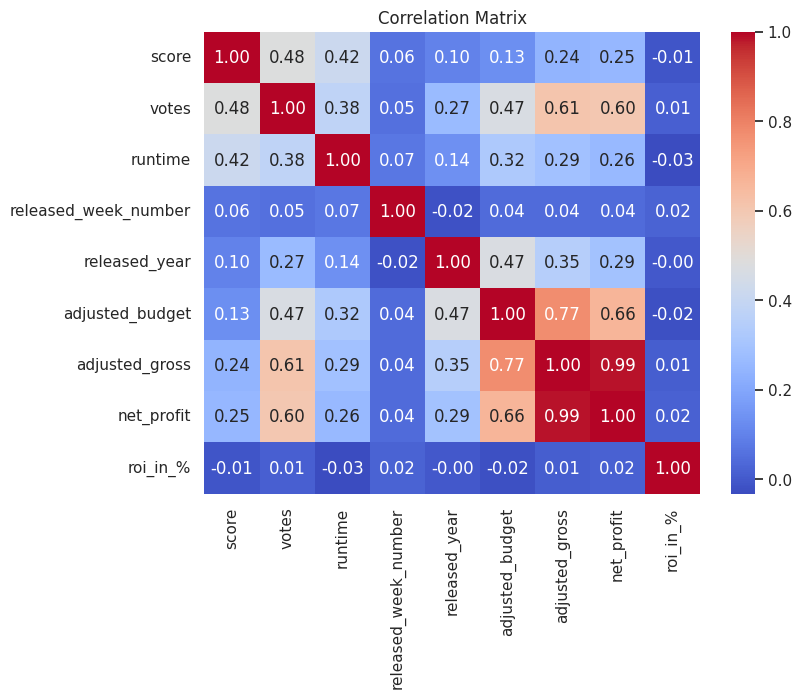

In [ ]:
# Calculate correlation matrix
corr_matrix = df_corr.corr()

# Plot correlation matrix using Seaborn
plt.figure(figsize=(8, 6))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix')
plt.show()

In [ ]:
#net_profit & adjusted_gross have correlation of close to 1, thus removing net_profit
df_corr= df_corr.drop(['net_profit'],axis=1)

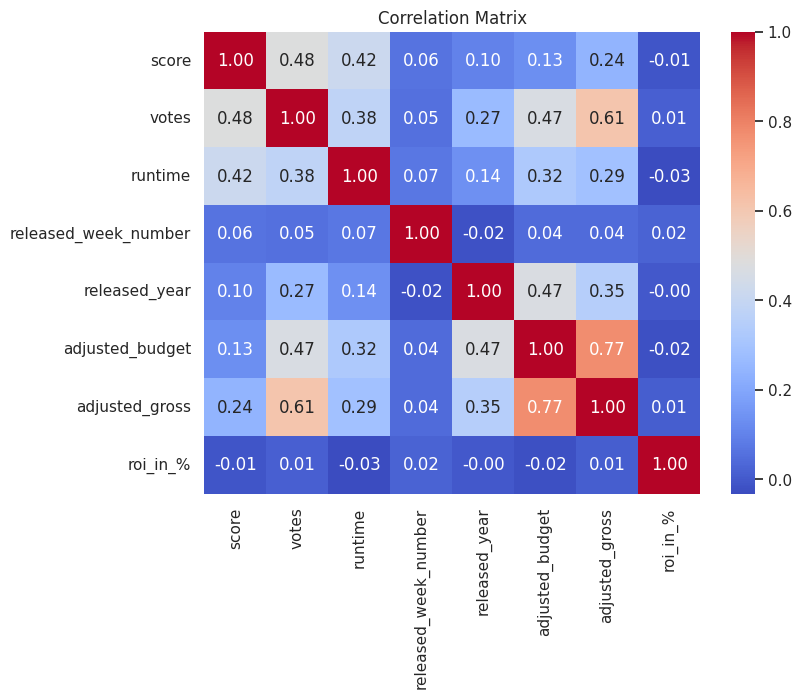

In [ ]:
# Calculate correlation matrix
corr_matrix = df_corr.corr()

# Plot correlation matrix using Seaborn
plt.figure(figsize=(8, 6))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix')
plt.show()

In [ ]:
# Adjusted gross had high correlation with adjusted budget and Votes, thus dropping gross
df_corr= df_corr.drop(['adjusted_gross'],axis=1)

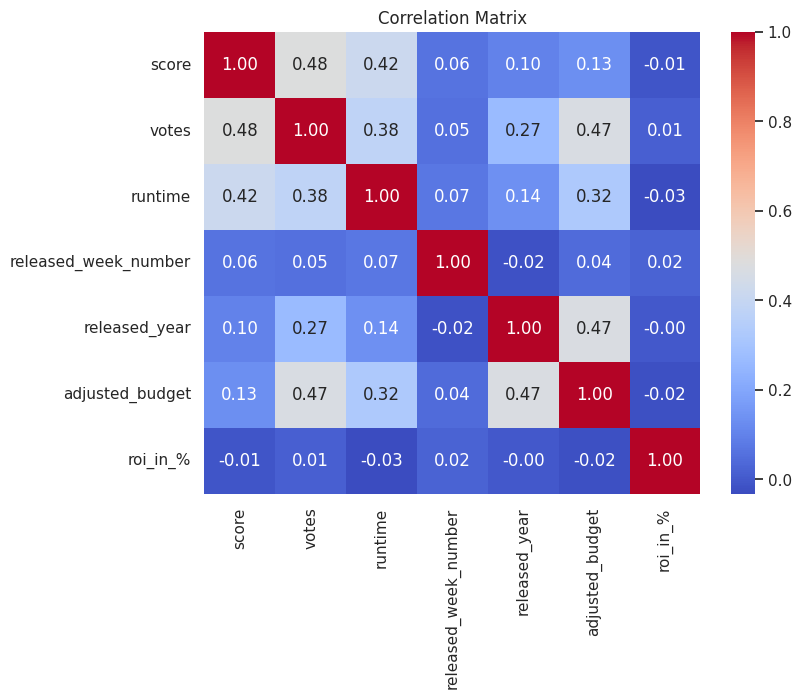

In [ ]:
# Calculate correlation matrix
corr_matrix = df_corr.corr()

# Plot correlation matrix using Seaborn
plt.figure(figsize=(8, 6))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix')
plt.show()

### Handling the categorical data

In [ ]:
# creating categorical variables data
categorical_df = data.drop(['score', 'votes', 'runtime', 'released_week_number', 'released_year', 'adjusted_budget','roi_in_%','adjusted_gross','net_profit'], axis=1)

# Convert categorical columns into dummy variables
dummy_df = pd.get_dummies(categorical_df)

# Concatenate the dummy variables with the original DataFrame
movies_df = pd.concat([df_corr, dummy_df], axis=1)
categorical_df

,rating,genre,released_day_of_week,released_month,season,fate
0,R,Adventure,Wednesday,July,Summer,Blockbuster
1,PG,Action,Friday,June,Summer,Blockbuster
2,PG,Comedy,Wednesday,July,Summer,Blockbuster
3,R,Comedy,Friday,July,Summer,Blockbuster
4,R,Horror,Friday,May,Spring,Blockbuster
...,...,...,...,...,...,...
5048,R,Horror,Friday,April,Spring,Bomb
5049,R,Action,Tuesday,April,Spring,Bomb
5050,PG,Comedy,Wednesday,July,Summer,Bomb
5051,PG-13,Adventure,Friday,June,Summer,Bomb


In [ ]:
movies_df

,score,votes,runtime,released_week_number,released_year,adjusted_budget,roi_in_%,rating_G,rating_NC-17,rating_PG,rating_PG-13,rating_R,rating_Unrated,genre_Action,genre_Adventure,genre_Animation,genre_Biography,genre_Comedy,genre_Crime,genre_Drama,genre_Family,genre_Fantasy,genre_Horror,genre_Mystery,genre_Romance,genre_Sci-Fi,genre_Thriller,released_day_of_week_Friday,released_day_of_week_Monday,released_day_of_week_Saturday,released_day_of_week_Sunday,released_day_of_week_Thursday,released_day_of_week_Tuesday,released_day_of_week_Wednesday,released_month_April,released_month_August,released_month_December,released_month_February,released_month_January,released_month_July,released_month_June,released_month_March,released_month_May,released_month_November,released_month_October,released_month_September,season_Fall,season_Spring,season_Summer,season_Winter,fate_Bomb,fate_Flop,fate_Average,fate_Hit,fate_Blockbuster
0,5.8,65000.0,104.0,27,1980.0,1.432767e+06,1868.990939,False,False,False,False,True,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,True,False,False,False,False,False,False,False,False,True,False,False,False,False,False,True
1,8.7,1200000.0,124.0,25,1980.0,5.731066e+06,4402.972318,False,False,True,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,True,False,False,False,False,False,True
2,7.7,221000.0,88.0,27,1980.0,1.114374e+06,3489.744655,False,False,True,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,True,False,False,False,False,False,False,False,False,True,False,False,False,False,False,True
3,7.3,108000.0,98.0,30,1980.0,1.910355e+06,899.825187,False,False,False,False,True,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,True,False,False,False,False,False,True
4,6.4,123000.0,95.0,19,1980.0,1.751159e+05,10782.070944,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,True,False,False,False,False,False,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5048,4.8,1900.0,87.0,17,2019.0,2.025444e+07,-99.974888,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,True,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,True,False,False,False,False
5049,3.5,195.0,85.0,16,2019.0,1.185626e+06,-96.173521,False,False,False,False,True,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,True,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,True,False,False,False,False
5050,5.9,403.0,100.0,30,2019.0,1.976043e+07,-95.203632,False,False,True,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,True,False,False,False,False,False,False,False,False,True,False,True,False,False,False,False
5051,5.6,336.0,117.0,26,2019.0,3.655680e+07,-95.091930,False,False,False,True,False,False,False,True,False,False,False,False,False,False,False,False,Fal

In [ ]:
# We need to categorize the Scores in the range of 0-4,4-6,6-8 and 8-10 to mark them as the bad,average,good and excellent movies respectively

movies_df["movie_binned_score"]=pd.cut(movies_df['score'], bins=[0,4,6,8,10], right=True, labels=False)+1

In [ ]:
#Dropping the score column as it is being replaced with the movies_score values
movies_df.drop('score',axis=1,inplace=True)

In [ ]:
# Let's create a X dataframe which will have all IDVs
X = movies_df.drop("movie_binned_score", axis =1 )
X.head()

,votes,runtime,released_week_number,released_year,adjusted_budget,roi_in_%,rating_G,rating_NC-17,rating_PG,rating_PG-13,rating_R,rating_Unrated,genre_Action,genre_Adventure,genre_Animation,genre_Biography,genre_Comedy,genre_Crime,genre_Drama,genre_Family,genre_Fantasy,genre_Horror,genre_Mystery,genre_Romance,genre_Sci-Fi,genre_Thriller,released_day_of_week_Friday,released_day_of_week_Monday,released_day_of_week_Saturday,released_day_of_week_Sunday,released_day_of_week_Thursday,released_day_of_week_Tuesday,released_day_of_week_Wednesday,released_month_April,released_month_August,released_month_December,released_month_February,released_month_January,released_month_July,released_month_June,released_month_March,released_month_May,released_month_November,released_month_October,released_month_September,season_Fall,season_Spring,season_Summer,season_Winter,fate_Bomb,fate_Flop,fate_Average,fate_Hit,fate_Blockbuster
0,65000.0,104.0,27,1980.0,1.432767e+06,1868.990939,False,False,False,False,True,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,True,False,False,False,False,False,False,False,False,True,False,False,False,False,False,True
1,1200000.0,124.0,25,1980.0,5.731066e+06,4402.972318,False,False,True,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,True,False,False,False,False,False,True
2,221000.0,88.0,27,1980.0,1.114374e+06,3489.744655,False,False,True,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,True,False,False,False,False,False,False,False,False,True,False,False,False,False,False,True
3,108000.0,98.0,30,1980.0,1.910355e+06,899.825187,False,False,False,False,True,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,True,False,False,False,False,False,True
4,123000.0,95.0,19,1980.0,1.751159e+05,10782.070944,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,True,False,False,False,False,False,False,True


In [ ]:
# Create y to contain only target
y = movies_df["movie_binned_score"]
y

0       2
1       4
2       3
3       3
4       3
       ..
5048    2
5049    1
5050    2
5051    2
5052    1
Name: movie_binned_score, Length: 5052, dtype: int64

In [ ]:
#  Splitting the data into training and test data
# Training and testing dataset creation
import sklearn.model_selection as model_selection
X_train, X_test, y_train, y_test = model_selection.train_test_split( X, y, test_size=0.3, random_state=5)

In [ ]:
# Feature Scaling
from sklearn.preprocessing import StandardScaler
sc_X = StandardScaler()
X_train = sc_X.fit_transform(X_train)
X_test = sc_X.transform(X_test)

### Model Selection- Classfication

In [ ]:
# Regression Model
from sklearn.linear_model import LogisticRegression
logit =LogisticRegression()
logit.fit(X_train,np.ravel(y_train,order='C'))
y_pred=logit.predict(X_test)

#Confusion matrix for logistic regression

from sklearn import metrics
cnf_matrix = metrics.confusion_matrix(y_test, y_pred)
print(cnf_matrix)

print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

[[  0  29  12   0]
 [  0 318 216   0]
 [  0 160 744   2]
 [  0   0  14  21]]
Accuracy: 0.7143799472295514


In [ ]:
# Support Vector Classifier Model
from sklearn.svm import SVC
svc= SVC(kernel = 'sigmoid')
svc.fit(X_train, np.ravel(y_train,order='C'))
svcpred = svc.predict(X_test)
cnf_matrix = metrics.confusion_matrix(y_test, svcpred)
print(cnf_matrix)
print("Accuracy:",metrics.accuracy_score(y_test, svcpred))

[[  0  30  11   0]
 [  0 313 221   0]
 [  0 194 711   1]
 [  0   1  16  18]]
Accuracy: 0.6873350923482849


In [ ]:
# k-Nearest Neighbors (KNN) classifier
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier(n_neighbors=22)
knn.fit(X_train, np.ravel(y_train,order='C'))
knnpred = knn.predict(X_test)
cnf_matrix = metrics.confusion_matrix(y_test, knnpred)
print(cnf_matrix)
print("Accuracy:",metrics.accuracy_score(y_test, knnpred))

[[  0  24  17   0]
 [  0 242 292   0]
 [  0 187 719   0]
 [  0   0  32   3]]
Accuracy: 0.6358839050131926


In [ ]:
# Gaussian Naive Bayes classifier

from sklearn.naive_bayes import GaussianNB
gaussiannb= GaussianNB()
gaussiannb.fit(X_train, np.ravel(y_train,order='C'))
gaussiannbpred = gaussiannb.predict(X_test)
cnf_matrix = metrics.confusion_matrix(y_test, gaussiannbpred)
print(cnf_matrix)
print("Accuracy:",metrics.accuracy_score(y_test, gaussiannbpred))

[[ 35   0   2   4]
 [447  10  15  62]
 [524   9  21 352]
 [  0   0   4  31]]
Accuracy: 0.06398416886543536


In [ ]:
#Decision Tree Modelling

from sklearn.tree import DecisionTreeClassifier
dtree = DecisionTreeClassifier(criterion='gini') #criterion = entopy, gini
dtree.fit(X_train, np.ravel(y_train,order='C'))
dtreepred = dtree.predict(X_test)
cnf_matrix = metrics.confusion_matrix(y_test, dtreepred)
print(cnf_matrix)
print("Accuracy:",metrics.accuracy_score(y_test, dtreepred))

[[  3  25  13   0]
 [ 13 303 218   0]
 [ 15 209 676   6]
 [  0   1  14  20]]
Accuracy: 0.6609498680738787


In [ ]:
#Adaptive Boosting classifier
from sklearn.ensemble import AdaBoostClassifier
abcl = AdaBoostClassifier(base_estimator=dtree, n_estimators=60)
abcl=abcl.fit(X_train,np.ravel(y_train,order='C'))
abcl_pred=abcl.predict(X_test)
cnf_matrix = metrics.confusion_matrix(y_test, abcl_pred)
print(cnf_matrix)
print("Accuracy:",metrics.accuracy_score(y_test, abcl_pred))

[[  3  25  13   0]
 [ 16 300 218   0]
 [ 14 207 678   7]
 [  0   1  14  20]]
Accuracy: 0.6602902374670184


In [ ]:
#Random Forest

from sklearn.ensemble import RandomForestClassifier
rfc = RandomForestClassifier(n_estimators = 200)#criterion = entopy,gini
rfc.fit(X_train, np.ravel(y_train,order='C'))
rfcpred = rfc.predict(X_test)
cnf_matrix = metrics.confusion_matrix(y_test, rfcpred)
print(cnf_matrix)
print("Accuracy:",metrics.accuracy_score(y_test, rfcpred))

[[  0  31  10   0]
 [  0 311 223   0]
 [  1 126 779   0]
 [  0   0  28   7]]
Accuracy: 0.7236147757255936


In [ ]:
#Bagging classfier

from sklearn.ensemble import BaggingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import confusion_matrix, accuracy_score

# Assuming X_train, X_test, y_train, y_test are your training and testing data
# Initialize a Decision Tree Classifier as the base estimator
base_estimator = DecisionTreeClassifier()

# Initialize the Bagging Classifier with 100 base estimators
bagging_clf = BaggingClassifier(base_estimator, n_estimators=100, random_state=42)

# Fit the Bagging Classifier to the training data
bagging_clf.fit(X_train, y_train)

# Make predictions on the test data
y_pred = bagging_clf.predict(X_test)

# Calculate accuracy and confusion matrix
accuracy = accuracy_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)

print("Accuracy:", accuracy)
print("Confusion Matrix:")
print(conf_matrix)

Accuracy: 0.7315303430079155
Confusion Matrix:
[[  0  31  10   0]
 [  0 336 198   0]
 [  0 152 753   1]
 [  0   0  15  20]]


In [ ]:
#Gradient boosting

from sklearn.ensemble import GradientBoostingClassifier
gbcl = GradientBoostingClassifier(n_estimators = 50, learning_rate = 0.09, max_depth=5)
gbcl = gbcl.fit(X_train,np.ravel(y_train,order='C'))
test_pred = gbcl.predict(X_test)
cnf_matrix = metrics.confusion_matrix(y_test, test_pred)
print(cnf_matrix)
print("Accuracy:",metrics.accuracy_score(y_test, test_pred))

[[  2  31   8   0]
 [  4 347 183   0]
 [  0 147 757   2]
 [  0   0  17  18]]
Accuracy: 0.741424802110818


In [ ]:
# XG Boosting
from xgboost import XGBClassifier
from sklearn.metrics import confusion_matrix, accuracy_score
from sklearn.preprocessing import LabelEncoder

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit LabelEncoder to unique values in y_train and transform y_train
y_train_encoded = label_encoder.fit_transform(y_train)

# Initialize XGBClassifier
xgb = XGBClassifier()

# Fit the model to the training data
xgb.fit(X_train, y_train_encoded)

# Transform y_test using the same LabelEncoder
y_test_encoded = label_encoder.transform(y_test)

# Make predictions on the testing data
xgb_pred = xgb.predict(X_test)

# Compute confusion matrix
cnf_matrix = confusion_matrix(y_test_encoded, xgb_pred)
print("Confusion Matrix:")
print(cnf_matrix)

# Compute accuracy
accuracy = accuracy_score(y_test_encoded, xgb_pred)
print("Accuracy:", accuracy)

Confusion Matrix:
[[  0  33   8   0]
 [  2 345 187   0]
 [  0 151 753   2]
 [  0   0  16  19]]
Accuracy: 0.7368073878627969


In [ ]:
from sklearn.metrics import classification_report

print('Logistic  Reports\n',classification_report(y_test, y_pred))
print('KNN Reports\n',classification_report(y_test, knnpred))
print('SVC Reports\n',classification_report(y_test, svcpred))
print('Naive BayesReports\n',classification_report(y_test, gaussiannbpred))
print('Decision Tree Reports\n',classification_report(y_test, dtreepred))
print('Ada Boosting\n',classification_report(y_test, abcl_pred))
print('Random Forests Reports\n',classification_report(y_test, rfcpred))

print('Gradient Boosting',classification_report(y_test, test_pred))

xgbprd = xgb.predict(X_test)
print('XGBoosting\n', classification_report(y_test, xgbprd))

from sklearn.model_selection import cross_val_score

# Assuming bagging_clf is your BaggingClassifier object
# Compute cross-validation scores
cv_scores = cross_val_score(bagging_clf, X_train, y_train, cv=5)  # Adjust cv value as needed

# Print mean cross-validation score
print("Mean Cross-Validation Score:", cv_scores.mean())



Logistic  Reports
               precision    recall  f1-score   support

           1       0.00      0.00      0.00        41
           2       0.65      0.63      0.64       534
           3       0.77      0.83      0.80       906
           4       0.95      0.57      0.71        35

    accuracy                           0.73      1516
   macro avg       0.59      0.51      0.54      1516
weighted avg       0.71      0.73      0.72      1516

KNN Reports
               precision    recall  f1-score   support

           1       0.00      0.00      0.00        41
           2       0.53      0.45      0.49       534
           3       0.68      0.79      0.73       906
           4       1.00      0.09      0.16        35

    accuracy                           0.64      1516
   macro avg       0.55      0.33      0.34      1516
weighted avg       0.62      0.64      0.61      1516

SVC Reports
               precision    recall  f1-score   support

           1       0.00      0

In [ ]:
# Tabular formation pf accuracy scores basis different models
import pandas as pd
from sklearn.metrics import classification_report
from sklearn.model_selection import cross_val_score

# Initialize a list to store the results
results = []

# Classification Reports
models = ['Logistic', 'KNN', 'SVC', 'Naive Bayes', 'Decision Tree', 'Ada Boosting', 'Random Forests', 'Gradient Boosting', 'XGBoosting']
for model, y_pred in zip(models, [y_pred, knnpred, svcpred, gaussiannbpred, dtreepred, abcl_pred, rfcpred, test_pred, xgbprd]):
    report = classification_report(y_test, y_pred, output_dict=True)
    results.append([model, report['accuracy'], report['macro avg']['precision'], report['macro avg']['recall'], report['macro avg']['f1-score']])

# Mean Cross-Validation Score
bagging_clf_cv_scores = cross_val_score(bagging_clf, X_train, y_train, cv=5)
results.append(['Bagging Classifier', bagging_clf_cv_scores.mean(), '-', '-', '-'])

# Create a DataFrame
columns = ['MODEL', 'ACCURACY', 'PRECISION', 'RECALL', 'F1-SCORE']
df = pd.DataFrame(results, columns=columns)

# Sort the DataFrame in decreasing order of accuracy
df_sorted = df.sort_values(by='ACCURACY', ascending=False)

# Display the sorted DataFrame
print(df_sorted)

                MODEL  ACCURACY PRECISION    RECALL  F1-SCORE
9  Bagging Classifier  0.746041         -         -         -
7   Gradient Boosting  0.741425  0.669685  0.512105  0.551045
0            Logistic  0.731530  0.592824  0.507942  0.538169
6      Random Forests  0.723615  0.603392  0.410555  0.438677
2                 SVC  0.687335  0.567638  0.471299  0.503272
4       Decision Tree  0.660950  0.540797  0.489538  0.511095
5        Ada Boosting  0.660290  0.532266  0.488685  0.507489
1                 KNN  0.635884   0.55313  0.333124  0.344926
8          XGBoosting  0.146438  0.070321  0.231455  0.073954
3         Naive Bayes  0.063984  0.282537   0.44532  0.068857


In [ ]:
# Thus Gradient Boosting, Bagging Classifiers and Random Forests have accuracy scores of 0.753, 0.743 and 0.742 respectively.